## Introduction

## function defs

In [1]:
def my_jitter(x, jiggle = .1):    
    """Add some jitter for plotting."""
    return np.random.normal(loc = x, scale = jiggle)

## load packages, csv, basic plots etc

In [2]:
import pandas as pd
import numpy as np
from scipy import stats

import itertools as it

%matplotlib notebook

import matplotlib.pyplot as plt

import seaborn as sns
sns.set() 

import tensorflow as tf
import tensorflow_probability as tfp
tfd = tfp.distributions

/anaconda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
tf.enable_eager_execution()

In [4]:
cd nba-enhanced-stats/

/Users/DonBunk/Desktop/Google Drive/data_science/Python_Projects/NBA/nba_game_project/nba-enhanced-stats


In [5]:
nba_team_box_score = pd.read_csv("2017-18_teamBoxScore.csv")

In [6]:
with pd.option_context("display.max_rows", 10, "display.max_columns", 200):
    display(nba_team_box_score)

,gmDate,gmTime,seasTyp,offLNm1,offFNm1,offLNm2,offFNm2,offLNm3,offFNm3,teamAbbr,teamConf,teamDiv,teamLoc,teamRslt,teamMin,teamDayOff,teamPTS,teamAST,teamTO,teamSTL,teamBLK,teamPF,teamFGA,teamFGM,teamFG%,team2PA,team2PM,team2P%,team3PA,team3PM,team3P%,teamFTA,teamFTM,teamFT%,teamORB,teamDRB,teamTRB,teamPTS1,teamPTS2,teamPTS3,teamPTS4,teamPTS5,teamPTS6,teamPTS7,teamPTS8,teamTREB%,teamASST%,teamTS%,teamEFG%,teamOREB%,teamDREB%,teamTO%,teamSTL%,teamBLK%,teamBLKR,teamPPS,teamFIC,teamFIC40,teamOrtg,teamDrtg,teamEDiff,teamPlay%,teamAR,teamAST/TO,teamSTL/TO,opptAbbr,opptConf,opptDiv,opptLoc,opptRslt,opptMin,opptDayOff,opptPTS,opptAST,opptTO,opptSTL,opptBLK,opptPF,opptFGA,opptFGM,opptFG%,oppt2PA,oppt2PM,oppt2P%,oppt3PA,oppt3PM,oppt3P%,opptFTA,opptFTM,opptFT%,opptORB,opptDRB,opptTRB,opptPTS1,opptPTS2,opptPTS3,opptPTS4,opptPTS5,opptPTS6,opptPTS7,opptPTS8,opptTREB%,opptASST%,opptTS%,opptEFG%,opptOREB%,opptDREB%,opptTO%,opptSTL%,opptBLK%,opptBLKR,opptPPS,opptFIC,opptFIC40,opptOrtg,opptDrtg,opptEDiff,opptPlay%,opptAR,opptAST/TO,opptSTL/TO,poss,pace
0,2017-10-17,08:00,Regular,Forte,Brian,Smith,Michael,McCutchen,Monty,BOS,East,Atlantic,Away,Loss,241,0,99,24,12,11,4,24,88,36,0.4091,56,28,0.5000,32,8,0.2500,25,19,0.7600,9,37,46,19,19,33,28,0,0,0,0,47.9167,66.6667,0.5000,0.4545,18.0000,80.4348,10.8108,10.9692,3.9888,7.1429,1.1250,75.375,62.5519,98.7227,101.7143,-2.9916,0.3956,17.7778,2.0000,91.6667,CLE,East,Central,Home,Win,240,0,102,19,17,3,4,25,83,38,0.4578,61,33,0.5410,22,5,0.2273,25,21,0.8400,9,41,50,29,25,18,30,0,0,0,0,52.0833,50.0000,0.5426,0.4880,18.0000,82.0000,15.3153,2.9916,3.9888,6.5574,1.2289,66.625,55.5208,101.7143,98.7227,2.9916,0.4176,14.6154,1.1176,17.6471,100.2809,99.8648
1,2017-10-17,08:00,Regular,Forte,Brian,Smith,Michael,McCutchen,Monty,CLE,East,Central,Home,Win,240,0,102,19,17,3,4,25,83,38,0.4578,61,33,0.5410,22,5,0.2273,25,21,0.8400,9,41,50,29,25,18,30,0,0,0,0,52.0833,50.0000,0.5426,0.4880,19.5652,82.0000,15.3153,2.9916,3.9888,6.5574,1.2289,66.625,55.5208,101.7143,98.7227,2.9916,0.4176,14.6154,1.1176,17.6471,BOS,East,Atlantic,Away,Loss,241,0,99,24,12,11,4,24,88,36,0.4091,56,28,0.5000,32,8,0.2500,25,19,0.7600,9,37,46,19,19,33,28,0,0,0,0,47.9167,66.6667,0.5000,0.4545,19.5652,80.4348,10.8108,10.9692,3.9888,7.1429,1.1250,75.375,62.5519,98.7227,101.7143,-2.9916,0.3956,17.7778,2.0000,91.6667,100.2809,100.2809
2,2017-10-17,10:30,Regular,Maddox,Tre,Garretson,Ron,Foster,Scott,HOU,West,Southwest,Away,Win,239,0,122,28,13,9,5,16,97,47,0.4845,56,32,0.5714,41,15,0.3659,19,13,0.6842,10,33,43,34,28,26,34,0,0,0,0,51.1905,59.5745,0.5790,0.5619,22.2222,84.6154,10.9834,8.7795,4.8775,8.9286,1.2577,97.875,81.9038,119.0108,118.0353,0.9755,0.4700,19.1309,2.1538,69.2308,GS,West,Pacific,Home,Loss,241,0,121,34,17,5,9,25,80,43,0.5375,50,27,0.5400,30,16,0.5333,21,19,0.9048,6,35,41,35,36,30,20,0,0,0,0,48.8095,79.0698,0.6779,0.6375,14.6341,85.3659,16.0015,4.8775,8.7795,18.0000,1.5125,103.875,86.2033,118.0353,119.0108,-0.9755,0.4725,24.2442,2.0000,29.4118,102.5117,102.9406
3,2017-10-17,10:30,Regular,Maddox,Tre,Garretson,Ron,Foster,Scott,GS,West,Pacific,Home,Loss,241,0,121,34,17,5,9,25,80,43,0.5375,50,27,0.5400,30,16,0.5333,21,19,0.9048,6,35,41,35,36,30,20,0,0,0,0,48.8095,79.0698,0.6779,0.6375,15.3846,77.7778,16.0015,4.8775,8.7795,18.0000,1.5125,103.875,86.2033,118.0353,119.0108,-0.9755,0.4725,24.2442,2.0000,29.4118,HOU,West,Southwest,Away,Win,239,0,122,28,13,9,5,16,97,47,0.4845,56,32,0.5714,41,15,0.3659,19,13,0.6842,10,33,43,34,28,26,34,0,0,0,0,51.1905,59.5745,0.5790,0.5619,23.2558,76.7442,10.9834,8.7795,4.8775,8.9286,1.2577,97.875,81.9038,119.0108,118.0353,0.9755,0.4700,19.1309,2.1538,69.2308,102.5117,102.0863
4,2017-10-18,07:00,Regular,Davis,Marc,Boland,Matt,DeRosa,Joe,CHA,East,Southeast,Away,Loss,238,0,90,16,17,4,3,15,73,29,0.3973,43,20,0.4651,30,9,0.3000,29,23,0.7931,3,44,47,27,18,25,20,0,0,0,0,50.0000,55.1724,0.5247,0.4589,7.3171,83.0189,16.5434,4.0412,3.0309,6.9767,1.2329,58.875,49.4748,90.9270,103.0506,-12.1236,0.3333,13.4725,0.9412,23.5294,DET,Eas

In [7]:
# I think this is already sorted, but let us make sure
nba_team_box_score.sort_values(by = 'gmDate', inplace=True)

In [8]:
#just get the Boston data, points in particular
BOS_df = nba_team_box_score[nba_team_box_score.teamAbbr=='BOS']
BOS_pts = BOS_df['teamPTS'].values

<IPython.core.display.Javascript object>


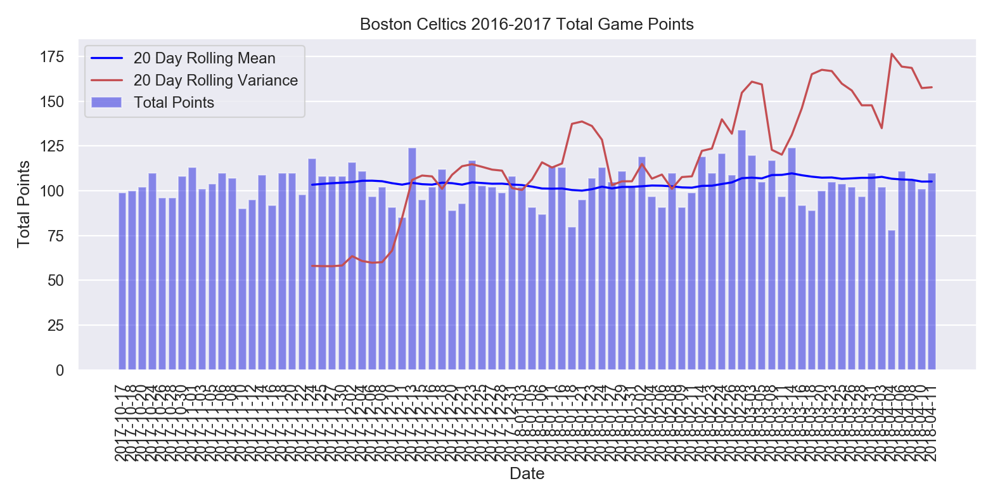

In [9]:
pts_srs = pd.Series(BOS_pts)
pts_windows = pts_srs.rolling(window = 20)

rolling_means = pts_windows.mean()
rolling_var = pts_windows.var()

plt.subplots(figsize = (10,5))
sns.barplot(data = BOS_df, x = 'gmDate', y = 'teamPTS', alpha = .5, color = 'blue', label = 'Total Points')

sns.lineplot(x = range(0,82), y = rolling_means, color = 'blue', label = '20 Day Rolling Mean')
sns.lineplot(x = range(0,82), y = rolling_var, color = 'r', label = '20 Day Rolling Variance')

plt.xticks(rotation = 'vertical');
plt.xlabel('Date')
plt.ylabel('Total Points')
plt.title('Boston Celtics 2016-2017 Total Game Points')
plt.legend()
plt.tight_layout()

<IPython.core.display.Javascript object>


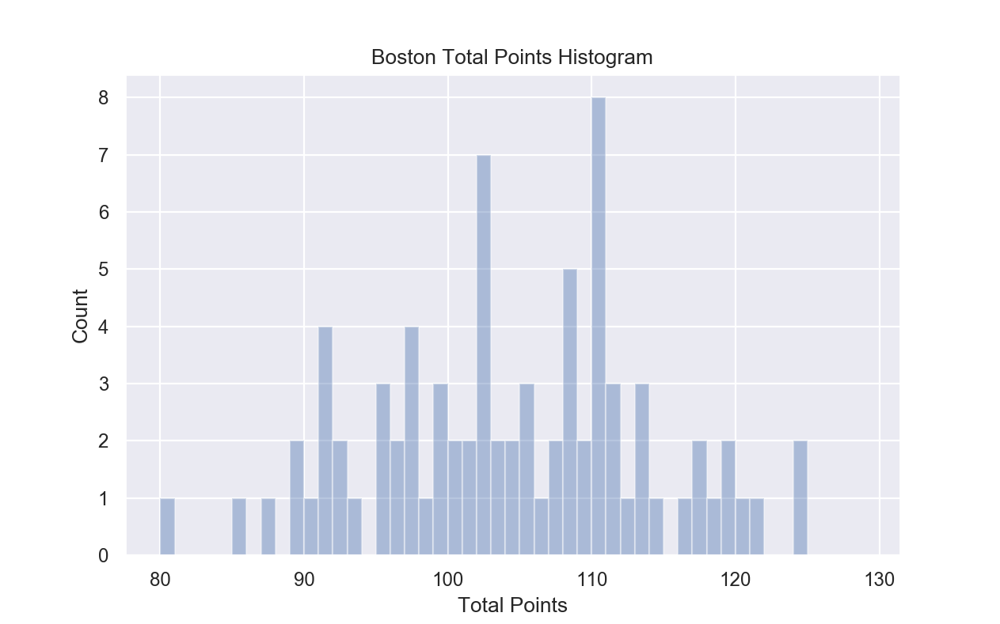

Text(0.5,1,'Boston Total Points Histogram')

In [10]:
plt.subplots(figsize = (8,5))
sns.distplot(BOS_pts, bins=range(80,130), kde=False, norm_hist=False)
#plt.hist(dat, density=True)
plt.xlabel('Total Points')
plt.ylabel('Count')
plt.title('Boston Total Points Histogram')

In [158]:
dat.mean(), dat.var(), stats.skew(dat)

(104.01219512195122, 106.84131469363473, 0.030262395363889794)

In [514]:
dat.std()/2

5.168203621511896

In [516]:
2*(np.quantile(a = dat, q = .75) - np.quantile(a = dat, q = .25))/(len(dat)**(1/3))

5.984603705912713

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


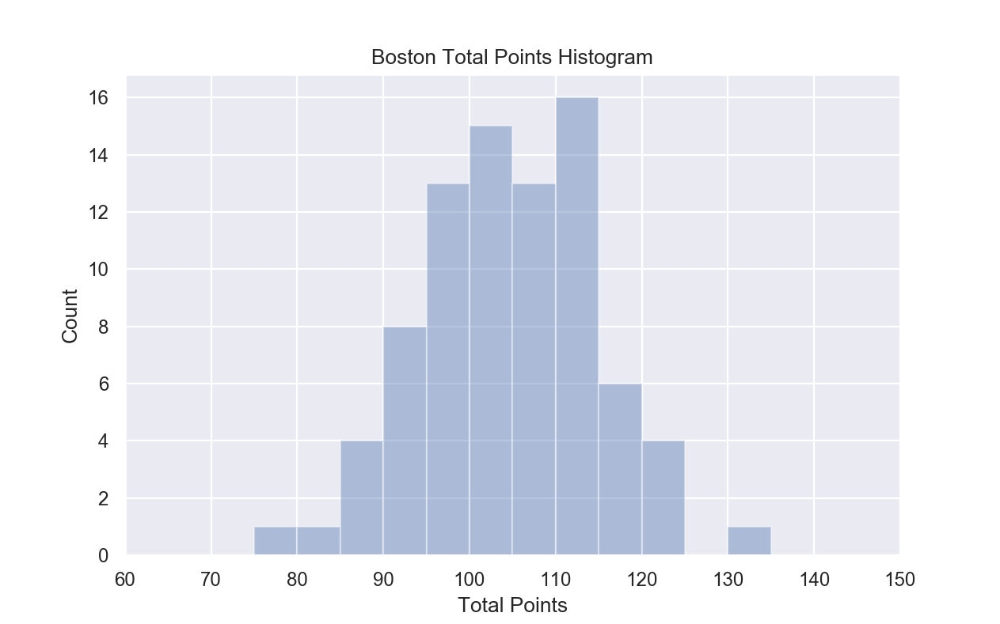

In [392]:
bins = np.arange(50,150,5)

plt.subplots(figsize = (8,5))
sns.distplot(BOS_pts, bins = bins, kde=False, norm_hist=False)

plt.xlim(60, 150)

plt.xlabel('Total Points')
plt.ylabel('Count')
plt.title('Boston Total Points Histogram');

In [12]:
stats.skew(BOS_pts)

0.030262395363889794

## 17-18 Boston game points, Poisson.

### MCMC chain code

In [585]:
def Poisson_chain(data_in, num_results, burn_in_steps, 
                  start_pnt = 100, initial_chain_mean_shift = 1, seed_in = 0, step_size_in = .05):
    
    # basic guesses informed by nba game data, not necessarily Boston points
    lambda_dist = tfd.Normal(loc = 100, scale = 20)
    
    def joint_log_proba(data_in, lambda_obs):
        
#         print(lambda_obs.numpy())
        
        observation_dist = tfd.Poisson(rate = lambda_obs)

        final_log_prob = lambda_dist.log_prob(lambda_obs) \
                         + tf.reduce_sum(observation_dist.log_prob(data_in))

#         print(final_log_prob.numpy())
#         print('\n')
        
        return final_log_prob      
    
    # just an argument reduction for later calls. 
    def unnormalized_log_posterior(lambda_obs):
        return joint_log_proba(data_in, lambda_obs)
      
    # starting point 
    initial_chain_state = [tf.to_float(initial_chain_mean_shift*start_pnt) * tf.ones([], dtype=tf.float32, name="init_lambda"),
                           ]

    unconstrained_bijectors = [tfp.bijectors.Exp()]    
    
    my_step_size = tf.get_variable(name = 'step_size',
                                   initializer = tf.constant(step_size_in, dtype=tf.float32),
                                   trainable = False,
                                   use_resource = True,
                                   )
    
    tf.set_random_seed(seed_in)
    
    my_hmc = tfp.mcmc.HamiltonianMonteCarlo(target_log_prob_fn = unnormalized_log_posterior, 
                                            step_size = my_step_size, 
                                            num_leapfrog_steps = 2,
                                            state_gradients_are_stopped = True, 
                                            step_size_update_fn = tfp.mcmc.make_simple_step_size_update_policy(),
                                            )
       
    [lambda_samples,
    ], kernel_results = tfp.mcmc.sample_chain(num_results = num_results, 
                          num_burnin_steps = burn_in_steps, 
                          current_state = initial_chain_state,                     
                          previous_kernel_results = None, 
                          kernel = tfp.mcmc.TransformedTransitionKernel(inner_kernel = my_hmc, 
                                                                        bijector = unconstrained_bijectors, 
                                                                        name = None,
                                                                        ),
                          num_steps_between_results = 0, 
                          parallel_iterations = 10, 
                          name = None, 
                          )
    
    print("completed")
    return lambda_samples

In [584]:
Poisson_chain(data_in = BOS_pts, 
              num_results = 10, 
              burn_in_steps = 0, 
              start_pnt = 104,
              initial_chain_mean_shift = 1, 
              seed_in = 0, 
              step_size_in = .000001)

104.000015
-311.86264


104.000015
-311.86264


104.00017
-311.86288


104.00017
-311.86288


104.00031
-311.86252


104.00031
-311.86252


104.000114
-311.86252


104.000114
-311.86252


103.999916
-311.86282


103.999916
-311.86282


104.00007
-311.86295


104.00007
-311.86295


104.00021
-311.86224


104.00021
-311.86224


104.000465
-311.86282


104.000465
-311.86282


104.00071
-311.86218


104.00071
-311.86218


104.00081
-311.86234


104.00081
-311.86234


104.00091
-311.86243


104.00091
-311.86243


104.00066
-311.8629


104.00066
-311.8629


104.00041
-311.86252


104.00041
-311.86252


104.00041
-311.86252


104.00041
-311.86252


104.00041
-311.86252


104.00041
-311.86252


104.00041
-311.86252


104.00041
-311.86252


104.00041
-311.86252


104.00041
-311.86252


104.00037
-311.8625


104.00037
-311.8625


104.00031
-311.86252


104.00031
-311.86252


104.00031
-311.86252


104.00031
-311.86252


104.00031
-311.86252


104.00031
-311.86252


completed


<tf.Tensor: id=8268539712, shape=(10,), dtype=float32, numpy=
array([104.00031 , 103.999916, 104.00021 , 104.00071 , 104.00091 ,
       104.00041 , 104.00041 , 104.00041 , 104.00031 , 104.00031 ],
      dtype=float32)>

### various starting values

In [20]:
Pois_all_data = []
for shift in np.linspace(.1,2, 10):
    curr = Poisson_chain(data_in = BOS_pts, 
                          num_results = 1000, 
                          burn_in_steps = 0, 
                          start_pnt = 100,
                          initial_chain_mean_shift = shift, 
                          seed_in = 0, 
                          step_size_in = .05)

    Pois_all_data.append(curr)

completed
completed
completed
completed
completed
completed
completed
completed
completed
completed


<IPython.core.display.Javascript object>


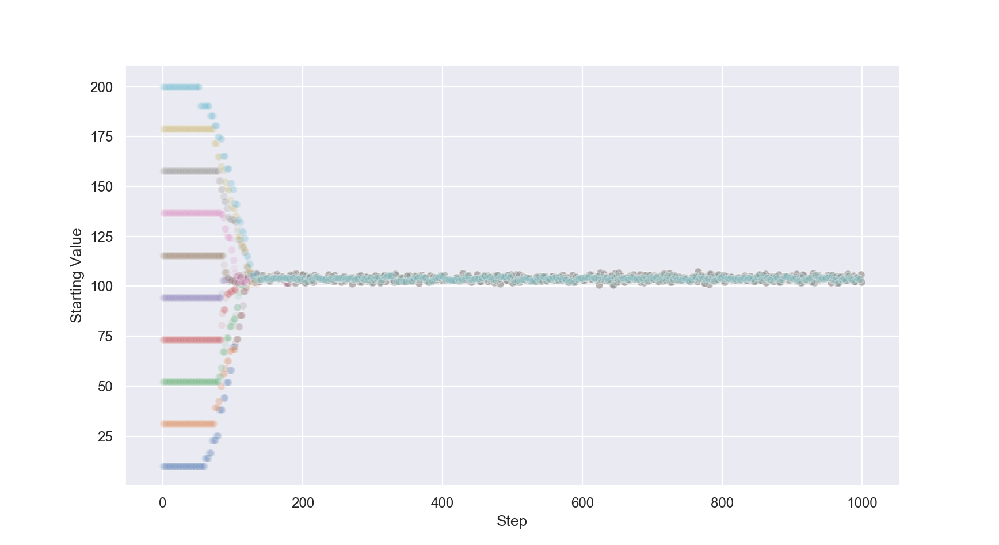

Text(0.5,0,'Step')

In [22]:
fig, ax = plt.subplots(figsize=(11,6))

for d in Pois_all_data:

    y_vals = d.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)
    
plt.ylabel('Starting Value')
plt.xlabel('Step')

### posterior gradient optimization

In [169]:
def Poisson_posterior_with_UniformPrior_FOR_GradientTape(lambda_in):

    data_in = BOS_pts
 
    lambda_dist = tfd.Normal(loc = 100, scale = 20)
    
    observation_dist = tfd.Poisson(rate = lambda_in)

    final_log_prob = lambda_dist.log_prob(lambda_in) \
                     + tf.reduce_sum(observation_dist.log_prob(data_in))

    final_log_prob = -final_log_prob
    
    return final_log_prob

def Poisson_posterior_GradientTape(lambda_in):
    
    lambda_in = tf.Variable(lambda_in, dtype = tf.float32)
    with tf.GradientTape() as tape:

        loss = Poisson_posterior_with_UniformPrior_FOR_GradientTape(lambda_in)
        
    grad = tape.gradient(target = loss, sources = lambda_in)
    
    return Poisson_posterior_with_UniformPrior_FOR_GradientTape(lambda_in), grad

In [170]:
start = tf.constant(150, dtype = tf.float32)
optim_results = tfp.optimizer.bfgs_minimize(Poisson_posterior_GradientTape, 
                                            initial_position=start, 
                                            tolerance=1e-8)


optim_results.position

<tf.Tensor: id=18050768, shape=(), dtype=float32, numpy=103.99952>

In [171]:
start = tf.constant(100, dtype = tf.float32)
optim_results = tfp.optimizer.bfgs_minimize(Poisson_posterior_GradientTape, 
                                            initial_position=start, 
                                            tolerance=1e-8)


optim_results.position

<tf.Tensor: id=18055028, shape=(), dtype=float32, numpy=103.99952>

In [172]:
start = tf.constant(40, dtype = tf.float32)
optim_results = tfp.optimizer.bfgs_minimize(Poisson_posterior_GradientTape, 
                                            initial_position=start, 
                                            tolerance=1e-8)


optim_results.position

<tf.Tensor: id=18059999, shape=(), dtype=float32, numpy=103.9996>

### Sample and explore distribution, test statistics

In [160]:
Poisson_lambda_samps = Poisson_chain(data_in = BOS_pts, 
                                      num_results = 10000, 
                                      burn_in_steps = 2000, #  this is a bit overboard, but just to make sure. 
                                      start_pnt = 100,
                                      initial_chain_mean_shift = 1, 
                                      seed_in = 0, 
                                      step_size_in = .05)

Poisson_lambda_samps = Poisson_lambda_samps.numpy()

completed


<IPython.core.display.Javascript object>


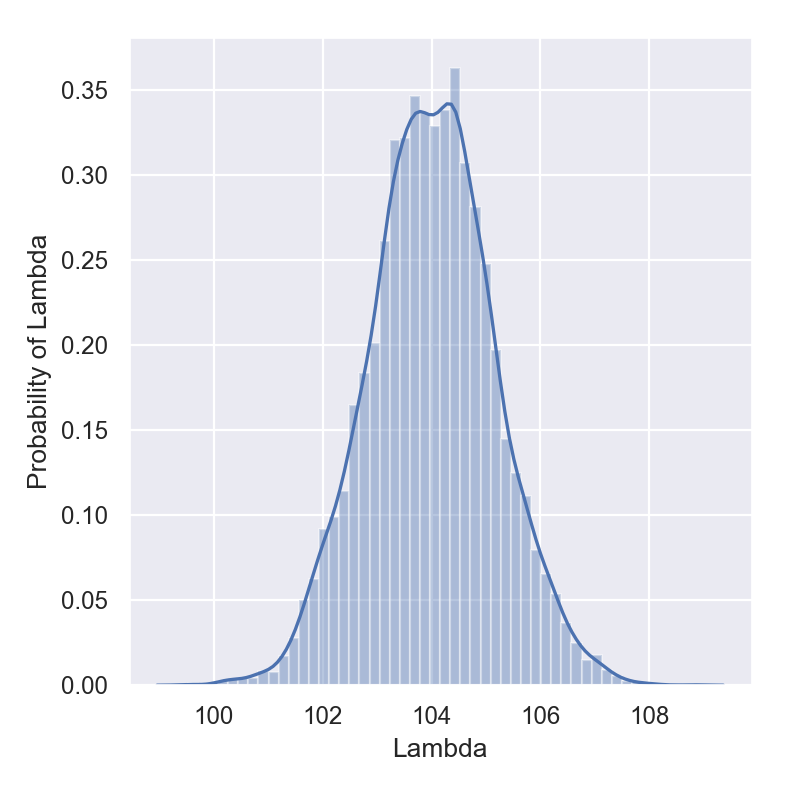

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [12]:
plt.subplots(figsize = (5,5))
sns.distplot(Poisson_lambda_samps)
plt.xlabel('Lambda')
plt.ylabel('Probability of Lambda')
plt.tight_layout()

In [13]:
print('SD',np.std(a = Poisson_lambda_samps))
print('mean',np.mean(a = Poisson_lambda_samps))
print('SD/mean',np.std(a = Poisson_lambda_samps)/np.mean(a = Poisson_lambda_samps))
print('.025 quantile',np.quantile(a = Poisson_lambda_samps, q = .025))
print('.5 quantile',np.quantile(a = Poisson_lambda_samps, q = .5))
print('.975 quantile',np.quantile(a = Poisson_lambda_samps, q = .975))

SD 1.1469294
mean 104.01011
SD/mean 0.011027095
.025 quantile 101.76283264160156
.5 quantile 104.0124397277832
.975 quantile 106.28469200134278


In [453]:
# generate samples, bins them, and them get confidence bands on the bins

tf.set_random_seed(0)

bins = np.linspace(64,144,21)

bin_mid_pts = [(bins[i]+bins[i+1])/2 for i,_ in enumerate(bins[:-1])]

all_scores_bined = []

# generate 82 games for each lambda sample
for LAM in Poisson_lambda_samps:
    
    this_Posn = tfd.Poisson(rate = LAM)

    score_samps = this_Posn.sample(sample_shape=82).numpy().astype(int)
    scores_binned, _ = np.histogram(score_samps, bins = bins, density=True)
    all_scores_bined.append(scores_binned)

#  transpose so that now we have an array, with each entry is a list of bin counts 
all_scores_bined = np.array(all_scores_bined)    
all_scores_bined = all_scores_bined.T

# find the confidence intervals for each bin
p025_bin_vals, p1_bin_vals, median_bin_vals, p9_bin_vals, p975_bin_vals = \
    zip(*[(np.quantile(b,.025), np.quantile(b,.1), np.median(b), np.quantile(b,.9), np.quantile(b,.975)) for b in all_scores_bined])

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


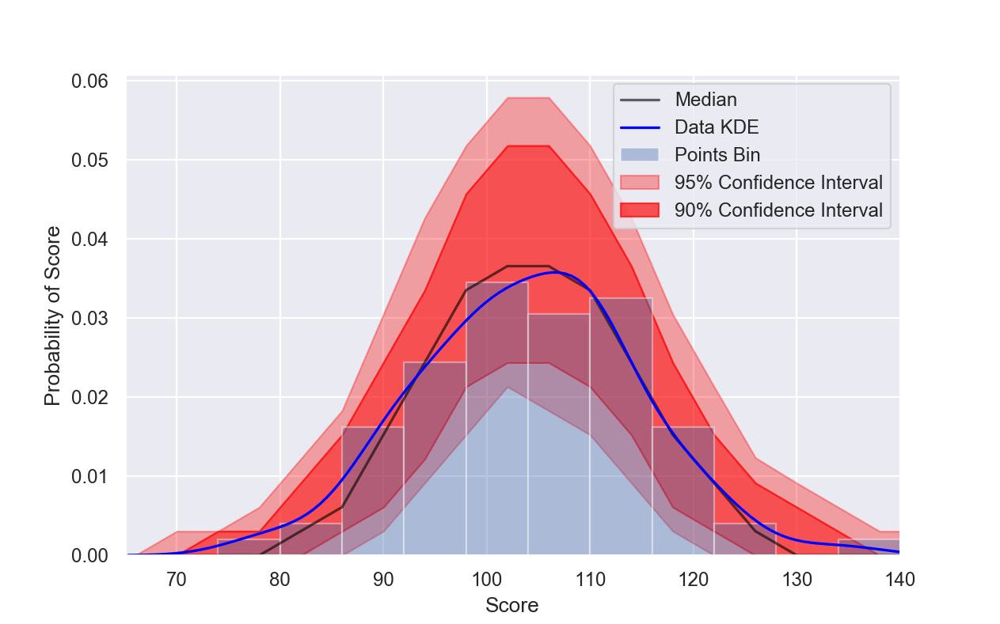

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [454]:
fig, ax = plt.subplots(figsize = (8,5))

# break the 95 confidence band into two pieces, above and below 90 band for easier legend
band_95 = ax.fill_between(x = bin_mid_pts, y1 = p025_bin_vals, y2 = p1_bin_vals, **{'alpha':.33, 'color':'red'},label='95% Confidence Interval')
band_90 = ax.fill_between(x = bin_mid_pts, y1 = p1_bin_vals, y2 = p9_bin_vals, **{'alpha':.66, 'color':'red'},label='90% Confidence Interval')
ax.fill_between(x = bin_mid_pts, y1 = p9_bin_vals, y2 = p975_bin_vals, **{'alpha':.33, 'color':'red'} )

median_line = ax.plot(bin_mid_pts, median_bin_vals, alpha = .6, color = 'black', label = 'Median')

data_line = sns.kdeplot(BOS_pts.astype(int), color = 'blue', label = 'Data KDE')

bins = np.arange(50,150,6)#np.linspace(50,150,101)

bined_plot = sns.distplot(BOS_pts, kde = False, norm_hist=True, bins = bins, label = 'Points Bin')

plt.xlabel('Score')
plt.ylabel('Probability of Score')
plt.xlim(65,140)
plt.legend()

In [482]:
max_of_data = max(BOS_pts)

TF_max = [max(s)>=max_of_data for s in just_Pos_samps]

sum(TF_max)/len(TF_max)*100

20.630000000000003

In [485]:
min_of_data = min(BOS_pts)

TF_min = [min(s)<=min_of_data for s in just_Pos_samps]

sum(TF_min)/len(TF_min)*100

32.92

In [512]:
lowest_4 = []
highest_4 = []

for s in just_Pos_samps:
    srtd = sorted(s)

    lowest_4.append(my_jitter(srtd[0], jiggle=.2))
    highest_4.append(my_jitter(srtd[-1], jiggle=.2))

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


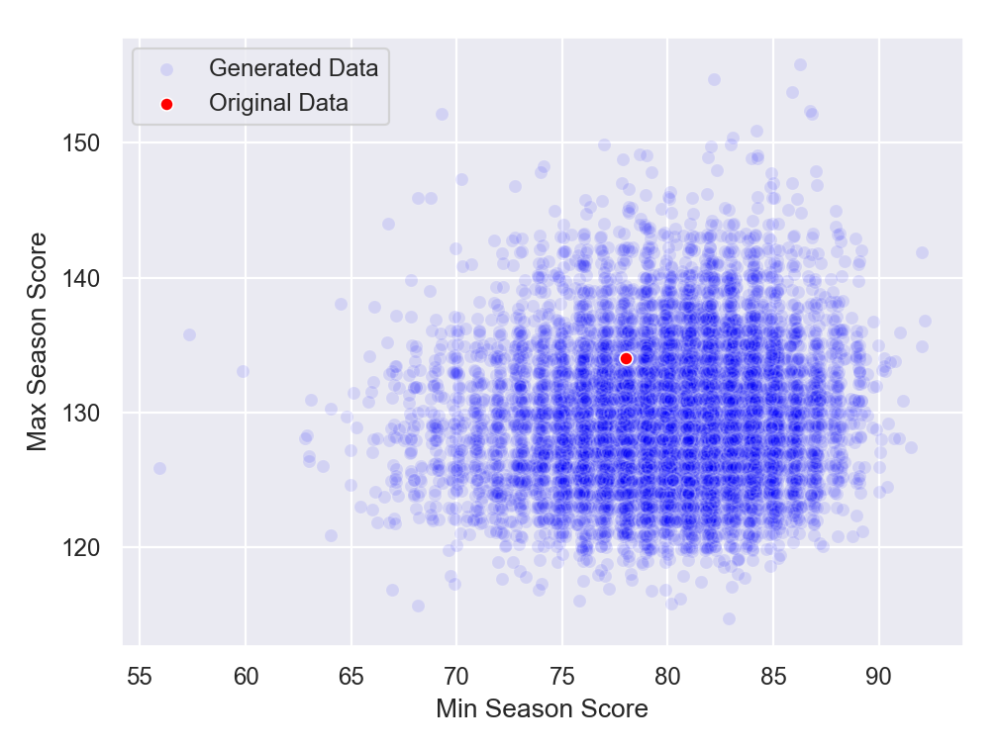

In [513]:
plt.subplots()

sns.scatterplot(x = lowest_4, y = highest_4, alpha = .1, color = 'blue', label = 'Generated Data')

sns.scatterplot(x = [min(BOS_pts)], y = [max(BOS_pts)], color = 'red', label = 'Original Data')

plt.xlabel('Min Season Score')
plt.ylabel('Max Season Score')
plt.legend()
plt.tight_layout()

In [23]:
np.var(BOS_pts)

106.84131469363473

In [208]:
BOS_var = np.var(BOS_pts)

pos_vars = [np.var(s) for s in just_Pos_samps]

test_vars = [v>BOS_var for v in pos_vars]

sum(test_vars)/len(test_vars)*100

37.86

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


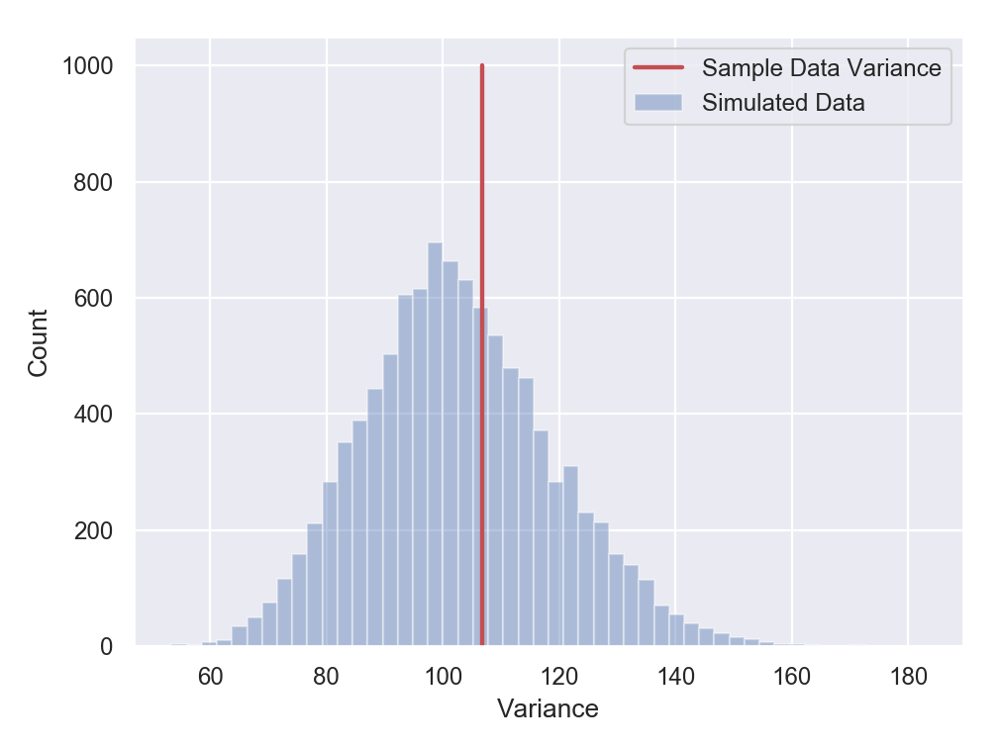

In [486]:
pos_vars = [np.var(s) for s in just_Pos_samps]

plt.subplots()

sns.distplot(pos_vars, kde = False, label = 'Simulated Data')

BOS_var = np.var(BOS_pts)

plt.plot((BOS_var, BOS_var), (0, 1000) , linewidth = 2, color = 'r', label = 'Sample Data Variance')

plt.ylabel('Count')
plt.xlabel('Variance')
plt.legend()
plt.tight_layout()

In [240]:
BOS_skew = stats.skew(BOS_pts)
BOS_skew

0.030262395363889794

In [239]:
BOS_skew = stats.skew(BOS_pts)

pos_skews = [stats.skew(s) for s in just_Pos_samps]

test_skews = [s>BOS_skew for s in pos_skews]

sum(test_skews)/len(test_skews)*100

58.25

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


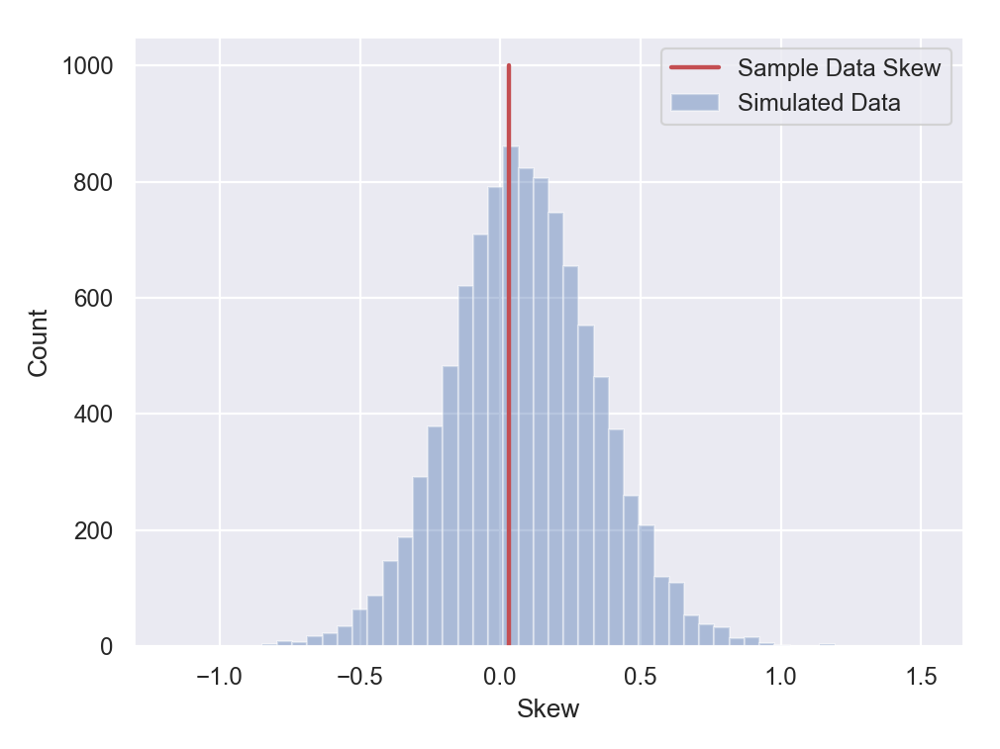

In [487]:
pos_skews = [stats.skew(s) for s in just_Pos_samps]

plt.subplots()

sns.distplot(pos_skews, kde = False, label = 'Simulated Data')

BOS_var = np.var(BOS_pts)

plt.plot((BOS_skew, BOS_skew), (0, 1000) , linewidth = 2, color = 'r', label = 'Sample Data Skew')

plt.ylabel('Count')
plt.xlabel('Skew')
plt.legend()
plt.tight_layout()

In [488]:
pos_kurt = [stats.kurtosis(s) for s in just_Pos_samps]

In [489]:
BOS_kurt = stats.kurtosis(BOS_pts)
BOS_kurt

0.1030400449052995

In [491]:
lt_kurts = [k>=BOS_kurt for k in pos_kurt]

sum(lt_kurts)/len(lt_kurts)*100

29.37

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


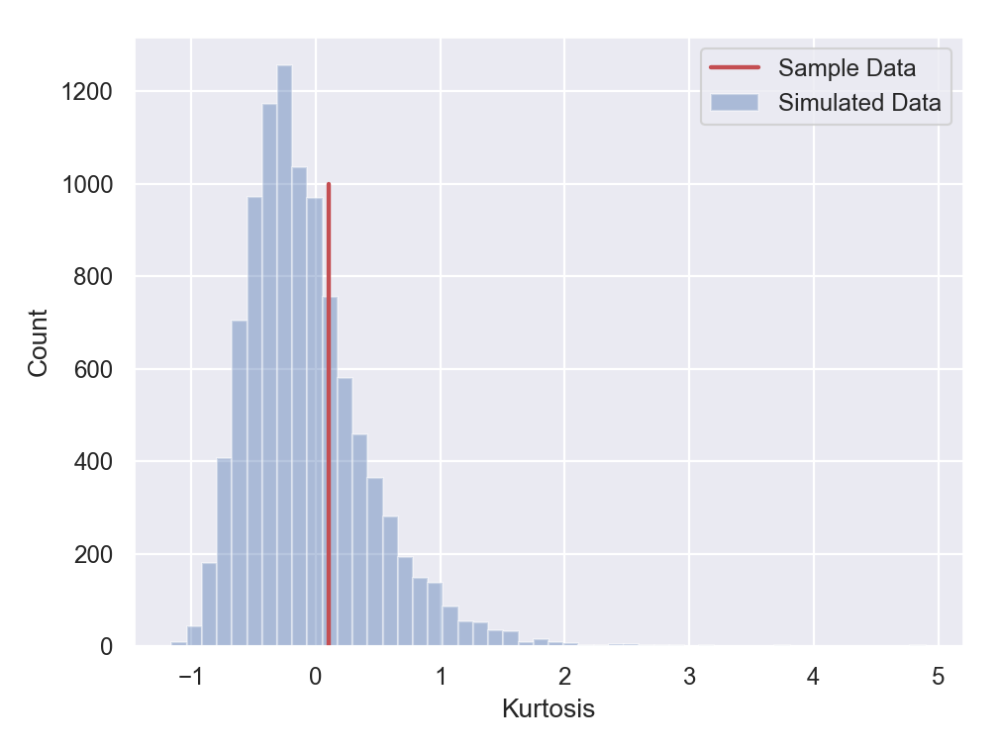

In [492]:
pos_vars = [np.var(s) for s in just_Pos_samps]

plt.subplots()

sns.distplot(pos_kurt, kde = False, label = 'Simulated Data')

BOS_var = np.var(BOS_pts)

plt.plot((BOS_kurt, BOS_kurt), (0, 1000) , linewidth = 2, color = 'r', label = 'Sample Data')

plt.ylabel('Count')
plt.xlabel('Kurtosis')
plt.legend()
plt.tight_layout()

In [578]:
np.quantile(a = BOS_pts, q = .05), np.quantile(a = BOS_pts, q = .95)

(89.0, 119.95)

In [581]:
bins = np.linspace(89,120,32)

pos_binned_arr = [np.histogram(a = s, bins = bins)[0] for s in just_Pos_samps]

# count_0_bins = np.count_nonzero(np.array(pos_binned_arr)==0, axis = 1)
# count_gt6_bins = np.count_nonzero(np.array(pos_binned_arr)>6, axis = 1)
#possibles = np.logical_and(count_0_bins>=2, count_gt6_bins>=2)

count_0_bins = np.count_nonzero(np.array(pos_binned_arr)==0, axis = 1)
final_count_0_bins = [b>=2 for b in count_0_bins]
count_gt6_bins = np.count_nonzero(np.array(pos_binned_arr)>6, axis = 1)
final_count_gt6_bins = [b>=2 for b in count_gt6_bins]

In [582]:
sum(final_count_0_bins)/len(final_count_0_bins)*100

93.16

In [583]:
sum(final_count_gt6_bins)/len(final_count_gt6_bins)*100

7.3

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


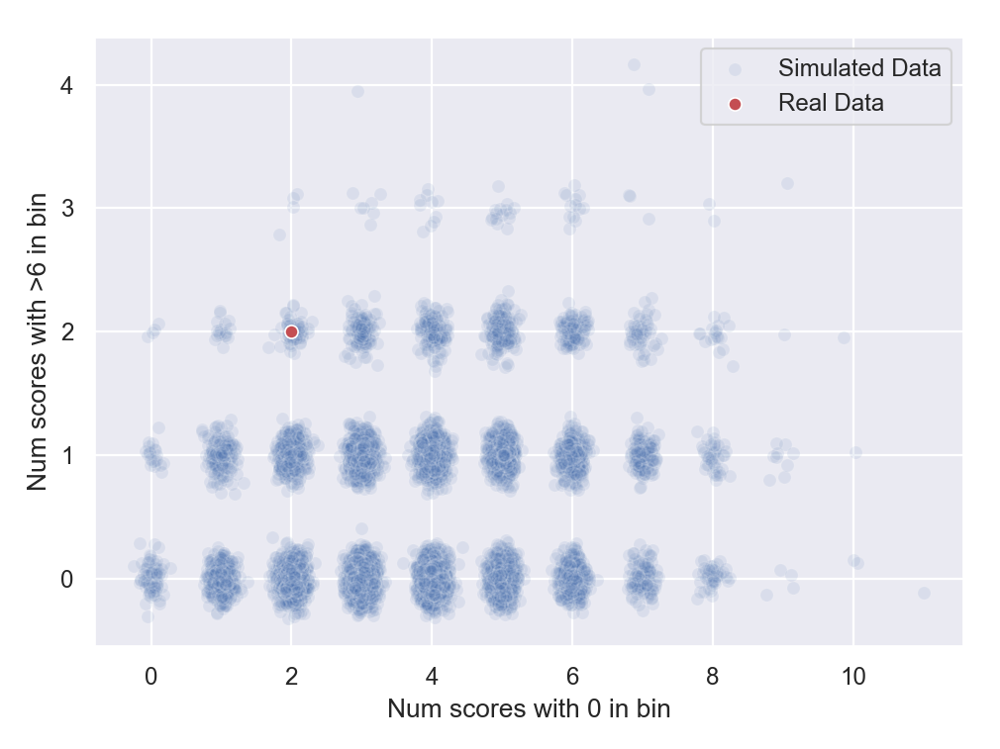

In [584]:
plt.subplots()

# add some jitter to see all the points
new_count_0s = [my_jitter(i) for i in count_0_bins]
new_count_gt6 = [my_jitter(i) for i in count_gt6_bins]

sns.scatterplot(x = new_count_0s, y = new_count_gt6, color = 'b', alpha = .1, label = 'Simulated Data')

sns.scatterplot(x = [2], y = [2], color = 'r', label = 'Real Data') # the data 

plt.xlabel('Num scores with 0 in bin')
plt.ylabel('Num scores with >6 in bin')
plt.legend(loc = 1)
plt.tight_layout()

In [205]:
# as I have stated, some code, like this, duplicates prior code
# sample from the Poisson distribution
just_Pos_samps = []

for Lam in Poisson_lambda_samps:
    
    this_Pos_dist = tfd.Poisson(rate = Lam)
    curr_samps = this_Pos_dist.sample(sample_shape = 82).numpy()
    
    just_Pos_samps.append(curr_samps)

In [187]:
# get confidence bands over time

just_Pos_samps = np.array(just_Pos_samps).T # now each entry is for a given time (although this only really matters for later time dep models)

p025_quart, p1_quart, p5_quart, p9_quart, p975_quart = np.quantile(a = just_Pos_samps, q = [.025, .1, .5, .9, .975], axis = 1) 

<IPython.core.display.Javascript object>


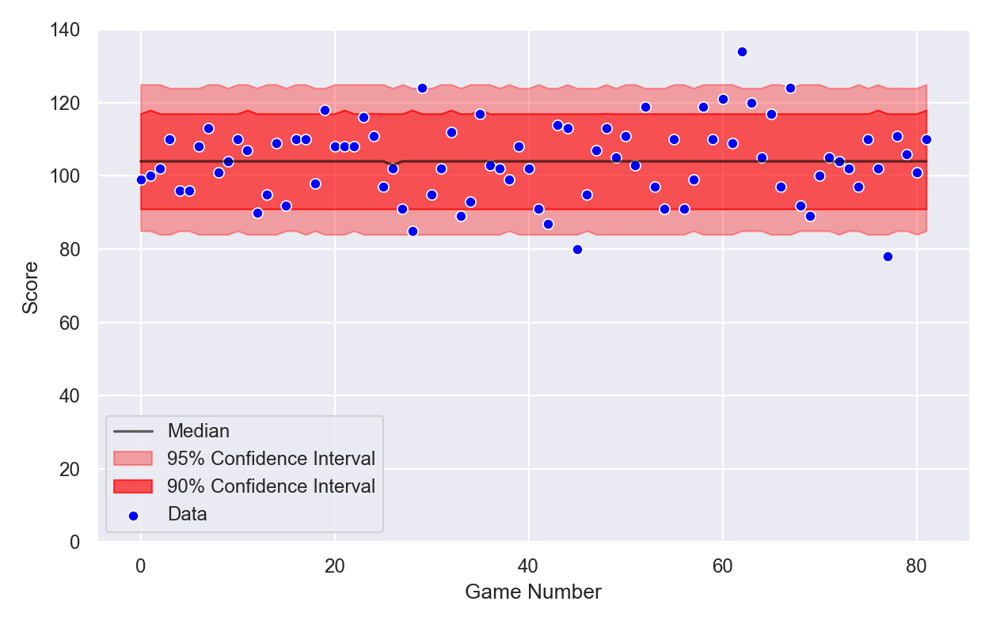

In [188]:
fig, ax = plt.subplots(figsize = (8,5))

t_vals = range(0,82)

# break the 95 confidence band into two pieces, above and below 90 band for easier legend
band_95 = ax.fill_between(x = t_vals, y1 = p025_quart, y2 = p1_quart, **{'alpha':.33, 'color':'red'},label='95% Confidence Interval')
band_90 = ax.fill_between(x = t_vals, y1 = p1_quart, y2 = p9_quart, **{'alpha':.66, 'color':'red'},label='90% Confidence Interval')
ax.fill_between(x = t_vals, y1 = p9_quart, y2 = p975_quart, **{'alpha':.33, 'color':'red'} )
median_line = ax.plot(t_vals, p5_quart, alpha = .6, color = 'black', label = 'Median')

data_line = sns.scatterplot(x = t_vals, y = BOS_pts, color = 'blue', label = 'Data')

plt.xlabel('Game Number')
plt.ylabel('Score')
plt.ylim(0,140)
plt.tight_layout()

In [445]:
np.var(BOS_pts)

106.84131469363473

In [514]:
np.var(BOS_pts[0:41]), np.var(BOS_pts[41:])

(73.99881023200476, 138.96966091612137)

In [515]:
first_half = [np.var(pts[:41]) for pts in just_Pos_samps]
second_half = [np.var(pts[41:]) for pts in just_Pos_samps]

BOS_first_half = np.var(BOS_pts[0:41])
BOS_second_half = np.var(BOS_pts[41:])

possibles = np.logical_and(first_half<=BOS_first_half, second_half>=BOS_second_half)

In [516]:
sum(possibles)/len(possibles)*100

0.5700000000000001

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


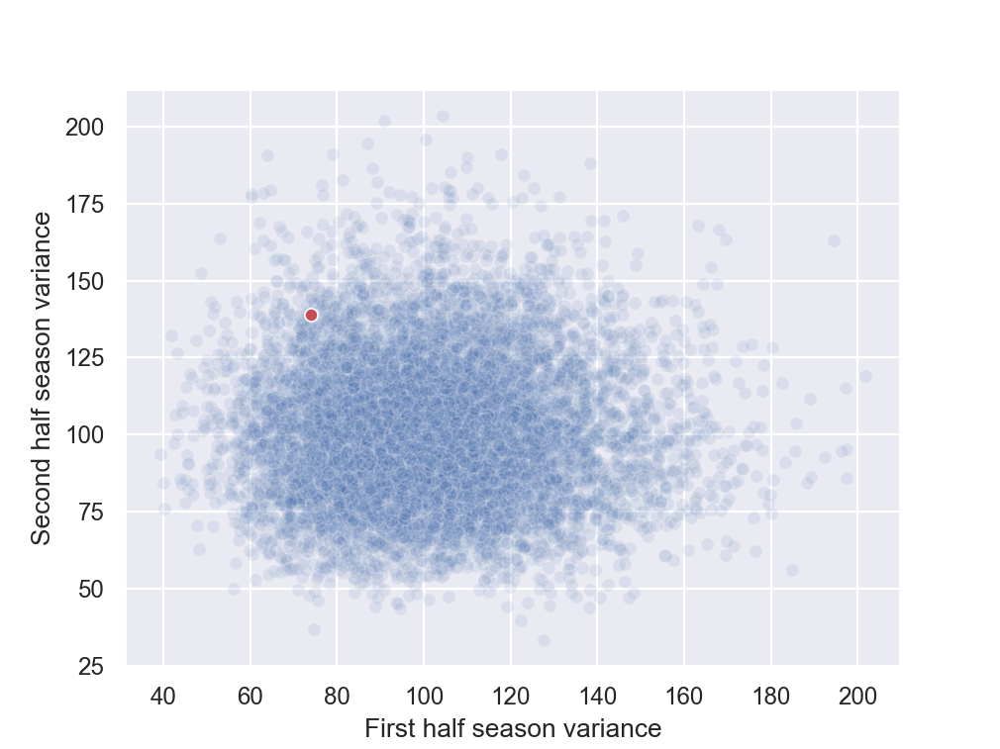

Text(0,0.5,'Second half season variance')

In [517]:
plt.subplots()

sns.scatterplot(x = first_half, y = second_half, color = 'b', alpha = .1)

sns.scatterplot(x = [BOS_first_half], y = [BOS_second_half], color = 'r')

plt.xlabel('First half season variance')
plt.ylabel('Second half season variance')

## 17-18 Boston game points, Poisson with a switch-point.

### MCMC chain code

In [624]:
def Poisson_switchpoint_chain(data_in, num_results, burn_in_steps, 
                              start_pnt = [100,100,40],
                              initial_chain_mean_shift = 1, seed_in = 0, step_size_in = .05):
    
    def which_lambda(data_in_index, tau, lambda_1, lambda_2):
        if data_in_index <= tau:
            return lambda_1
        elif data_in_index > tau:
            return lambda_2
        
    lambda_1_dist = tfd.Normal(loc = 100, scale = 20)
    lambda_2_dist = tfd.Normal(loc = 100, scale = 20)
    tau_dist = tfd.Uniform(low = 0, high = len(data_in))
    
    def joint_log_proba(data_in, lambda_1_obs, lambda_2_obs, tau_obs):

        lambda_final = [which_lambda(i, tau_obs, lambda_1_obs, lambda_2_obs) for i,_ in enumerate(data_in)]

        observation_dist = tfd.Poisson(rate = lambda_final)

        final_log_prob = lambda_1_dist.log_prob(lambda_1_obs) \
                         + lambda_2_dist.log_prob(lambda_2_obs) \
                         + tau_dist.log_prob(tau_obs) \
                         + tf.reduce_sum(observation_dist.log_prob(data_in))

        return final_log_prob  
    
    # just an argument reduction for later calls. 
    def unnormalized_log_posterior(lambda_1_obs, lambda_2_obs, tau_obs):
        return joint_log_proba(data_in, lambda_1_obs, lambda_2_obs, tau_obs) 
    
    initial_chain_state = [tf.to_float(tf.reduce_mean(initial_chain_mean_shift*start_pnt[0])) * tf.ones([], dtype=tf.float32, name="init_lambda_1"),
                           tf.to_float(tf.reduce_mean(initial_chain_mean_shift*start_pnt[1])) * tf.ones([], dtype=tf.float32, name="init_lambda_2"),
                           start_pnt[2] * tf.ones([], dtype=tf.float32, name="init_tau"),
                          ]
    
    rescale = np.float32(len(data_in))
    #print(rescale)
    
    unconstrained_bijectors = [tfp.bijectors.Exp(),
                               tfp.bijectors.Exp(),
                               tfp.bijectors.Chain([tfp.bijectors.AffineScalar(scale = rescale), tfp.bijectors.Sigmoid()])
                               ]

    
    
    my_step_size = tf.get_variable(name = 'step_size',
                                    initializer = tf.constant(step_size_in, dtype = tf.float32),
                                    trainable = False,
                                    use_resource = True,
                                    )
    
    tf.set_random_seed(seed_in)
    
    my_hmc = tfp.mcmc.HamiltonianMonteCarlo(target_log_prob_fn = unnormalized_log_posterior, 
                                            step_size = my_step_size, 
                                            num_leapfrog_steps = 2, 
                                            state_gradients_are_stopped = True, 
                                            step_size_update_fn = tfp.mcmc.make_simple_step_size_update_policy(),
                                            )
       
    [lambda_1_samples,
     lambda_2_samples,
     tau_samples,
    ], kernel_results = tfp.mcmc.sample_chain(num_results = num_results, 
                          num_burnin_steps = burn_in_steps, 
                          current_state = initial_chain_state,                     
                          previous_kernel_results = None, 
                          kernel = tfp.mcmc.TransformedTransitionKernel(inner_kernel = my_hmc, 
                                                                        bijector = unconstrained_bijectors, 
                                                                        name = None,
                                                                        ),
                          num_steps_between_results = 0, #default
                          parallel_iterations = 10, #default
                          name = None, 
                          )
    print('completed')
    
    return lambda_1_samples, lambda_2_samples, tau_samples

### scatter plot on convergence

In [30]:
switchPT_all_data = []
for shift in np.linspace(.5,1.5, 10):
    curr = Poisson_switchpoint_chain(data_in = BOS_pts, 
                                      num_results = 5000, 
                                      burn_in_steps = 0, 
                                      start_pnt = [100,100,40],
                                      initial_chain_mean_shift = shift, 
                                      seed_in = 0, 
                                      step_size_in = .05)
    
    switchPT_all_data.append(curr)

completed
completed
completed
completed
completed
completed
completed
completed
completed
completed


<IPython.core.display.Javascript object>


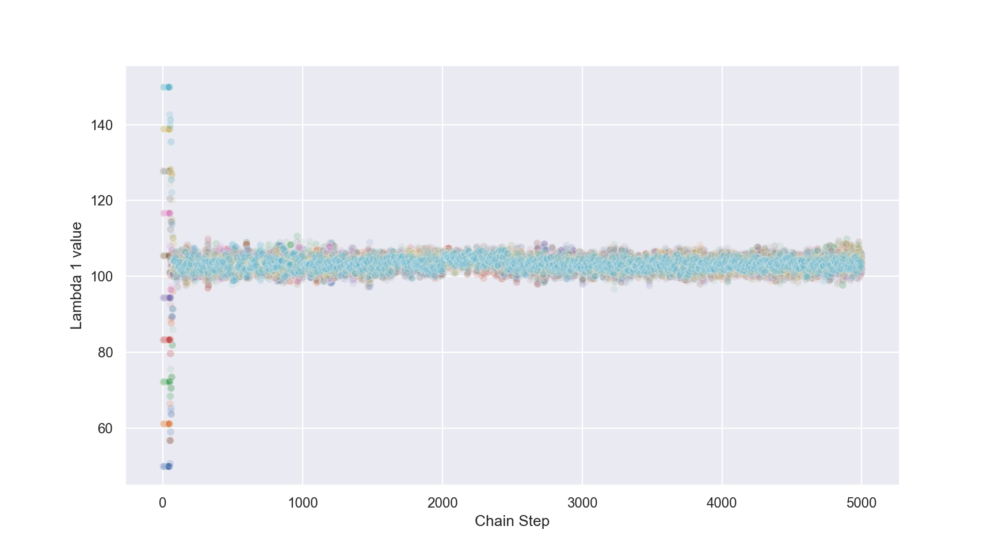

Text(0,0.5,'Lambda 1 value')

In [34]:
fig, ax = plt.subplots(figsize=(11,6))

for d in switchPT_all_data:
    (lam1_samps, _, _) = d

    y_vals = lam1_samps.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)
    
plt.xlabel('Chain Step')
plt.ylabel('Lambda 1 value')

<IPython.core.display.Javascript object>


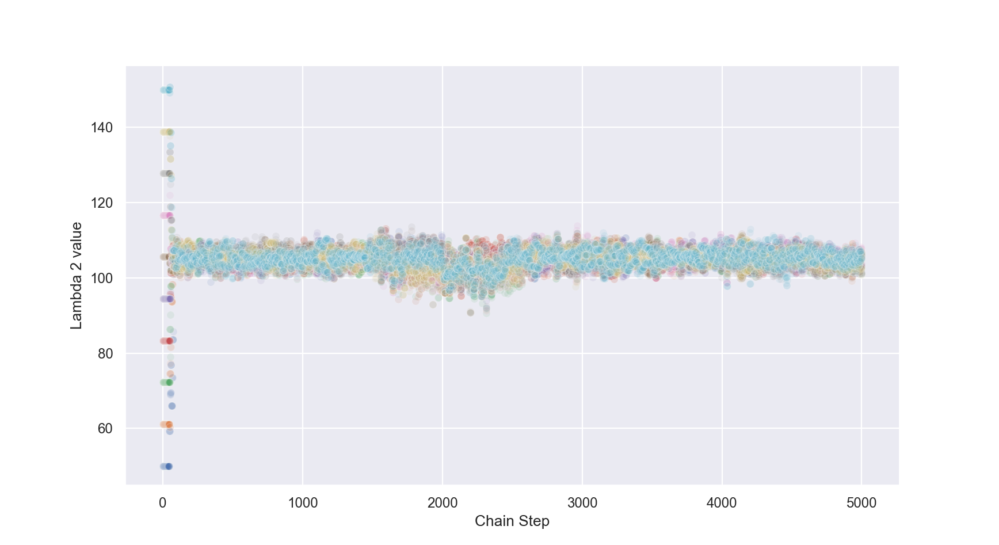

Text(0,0.5,'Lambda 2 value')

In [35]:
fig, ax = plt.subplots(figsize=(11,6))

for d in switchPT_all_data:
    (_, lam2_samps, _) = d

    y_vals = lam2_samps.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)
    
plt.xlabel('Chain Step')
plt.ylabel('Lambda 2 value')

<IPython.core.display.Javascript object>


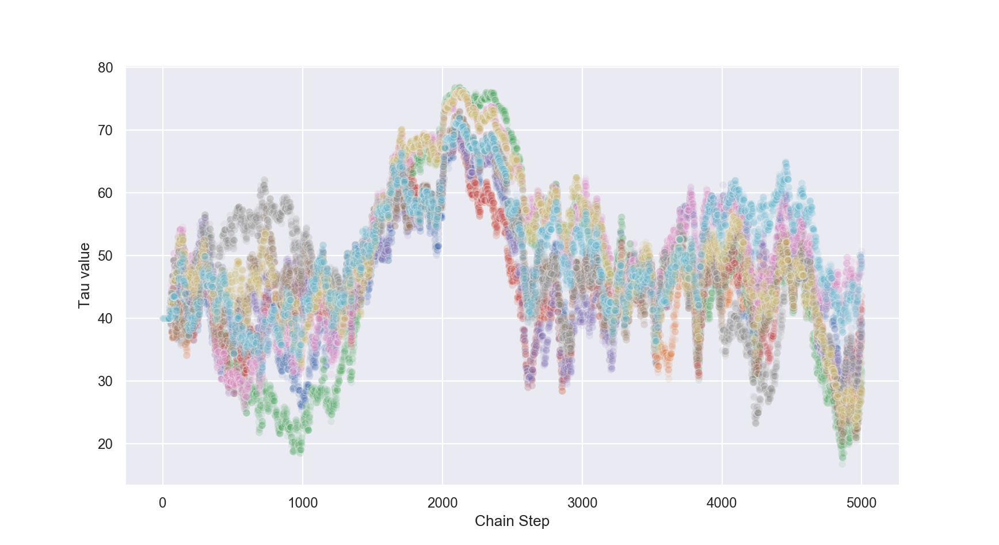

Text(0,0.5,'Tau value')

In [36]:
fig, ax = plt.subplots(figsize=(11,6))

for d in switchPT_all_data:
    (_, _, tau_samps) = d

    y_vals = tau_samps.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)

plt.xlabel('Chain Step')
plt.ylabel('Tau value')

### optimize

In [37]:
def Poisson_switchpoint_posterior(lambda_1_in, lambda_2_in, tau_in, data_in = BOS_pts):
    
    def which_lambda(data_in_index, tau, lambda_1, lambda_2):
        if data_in_index <= tau:
            return lambda_1
        elif data_in_index > tau:
            return lambda_2
    
    data_mean = np.mean(data_in)
    data_mean = data_mean.astype("float32")
    data_std = np.std(data_in)
    data_std = data_std.astype("float32")   
    
    lambda_1_dist = tfd.Normal(loc = data_mean, scale = data_std)
    lambda_2_dist = tfd.Normal(loc = data_mean, scale = data_std)
    tau_dist = tfd.Uniform(low = 0, high = len(data_in))
    

    lambda_final = [which_lambda(i, tau_in, lambda_1_in, lambda_2_in) for i,_ in enumerate(data_in)]

    observation_dist = tfd.Poisson(rate = lambda_final)

    final_log_prob = lambda_1_dist.log_prob(lambda_1_in) \
                         + lambda_2_dist.log_prob(lambda_2_in) \
                         + tau_dist.log_prob(tau_in) \
                         + tf.reduce_sum(observation_dist.log_prob(data_in))

    return final_log_prob.numpy() 

In [39]:
lam_range = range(90,120)
tau_range = range(0,82)

In [40]:
posteriors_results = [(Poisson_switchpoint_posterior(L1_,L2,tau),(L1_,L2,tau)) for L1_,L2,tau in it.product(*[lam_range, lam_range, tau_range])]

In [41]:
# find the best fit
max(posteriors_results, key = lambda x: x[0])

(-317.6479, (103, 107, 57))

### sample from the posterior and analyze samples

In [254]:
 curr = Poisson_switchpoint_chain(data_in = BOS_pts, 
                                  num_results = 10000, 
                                  burn_in_steps = 2000, 
                                  start_pnt = [103,107,57],
                                  initial_chain_mean_shift = 1, 
                                  seed_in = 0, 
                                  step_size_in = .05)

completed


In [255]:
lam_1_samps, lam_2_samps, tau_samps = curr
lam_1_samps = lam_1_samps.numpy()
lam_2_samps = lam_2_samps.numpy()
tau_samps = tau_samps.numpy() 

<IPython.core.display.Javascript object>


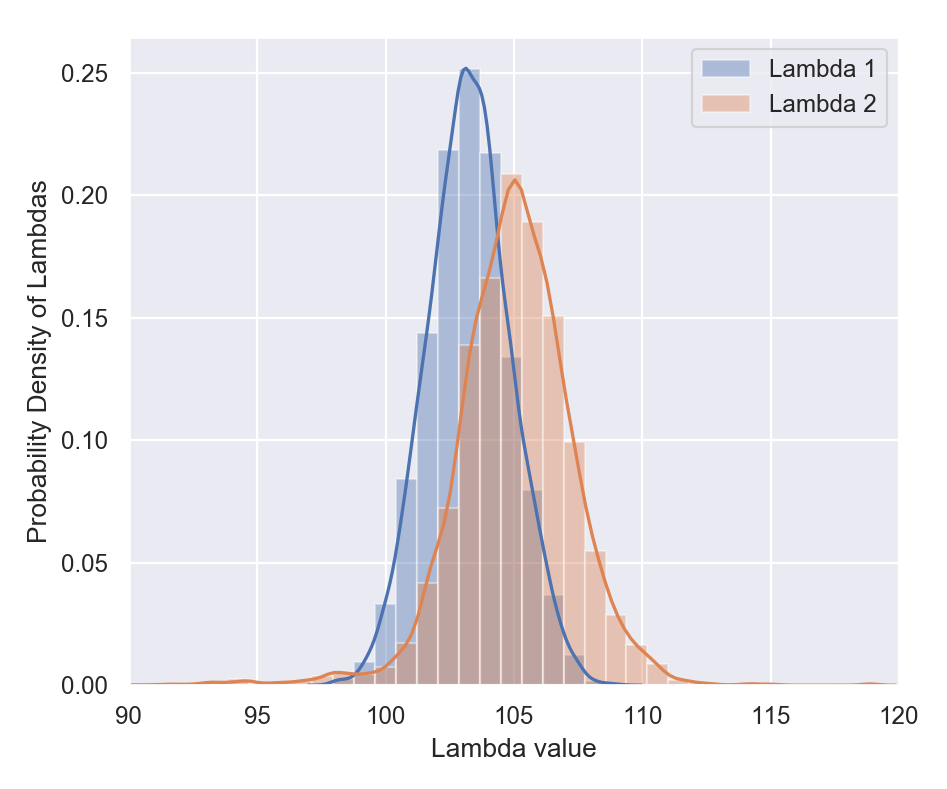

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)
/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [267]:
bins = np.linspace(80,120,50)

plt.subplots(figsize = (6,5))
sns.distplot(a = lam_1_samps, bins = bins, label='Lambda 1')
sns.distplot(a = lam_2_samps, bins = bins, label='Lambda 2')
#plt.xlabel('Lambda')
plt.ylabel('Probability Density of Lambdas')
plt.xlabel('Lambda value')
plt.xlim(90,120)
plt.legend()
plt.tight_layout()

In [262]:
lam_1_mean_plus_2sig = np.mean(lam_1_samps) + 2*np.std(lam_1_samps)
lam_1_mean_mins_2sig = np.mean(lam_1_samps) - 2*np.std(lam_1_samps)

def is_within(lam):
    if lam_1_mean_mins_2sig < lam < lam_1_mean_plus_2sig:
        return 1
    else:
        return 0

In [265]:
is_wthin_list = [is_within(lam_2) for lam_2 in lam_2_samps]
sum(is_wthin_list)/len(is_wthin_list)*100

74.38

<IPython.core.display.Javascript object>


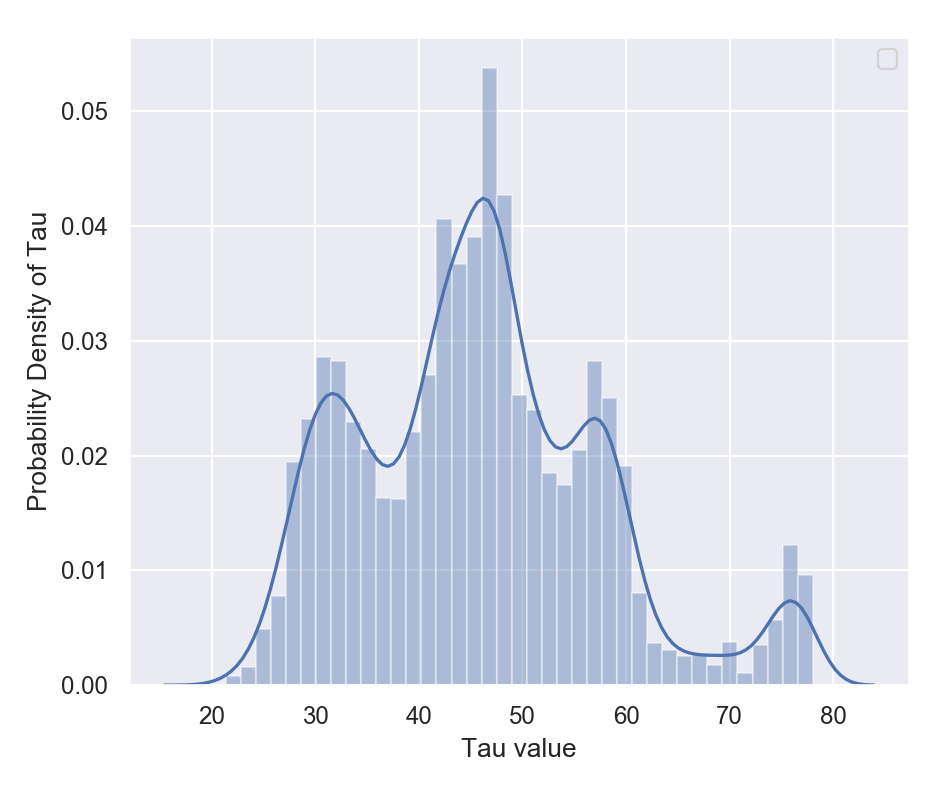

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)
No handles with labels found to put in legend.


In [266]:
plt.subplots(figsize = (6,5))
sns.distplot(a = tau_samps)
plt.ylabel('Probability Density of Tau')
plt.xlabel('Tau value')
plt.legend()
plt.tight_layout()

## 17-18 Boston game points, Poisson with a linear rate.

### MCMC chain code

In [1099]:
def Poisson_nonconstant_chain(data_in, num_results, burn_in_steps, 
                              start_pnt = [100,.1],
                              initial_chain_mean_shift = 1, seed_in = 0, step_size_in = .05):

    data_in = np.array(data_in).astype("float32")
    
    # There are many ways to make a prior for this, I was trying to be as agnostic as possible. 
    intrcpt_dist = tfd.Normal(loc = 100, scale = 20)

    # for the slope, I don't have any good guess, but I don't want anything outside the realm of possibility of the data
    # so I just pick a uniform prior bounded by the biggest and smallest slope
    max_slope = (max(data_in) -  min(data_in))/len(data_in)
    max_slope = max_slope.astype("float32")
    slope_dist = tfd.Uniform(low = -max_slope, high = +max_slope)  
    
    def joint_log_proba(data_in, lambda_intrcpt_obs, lambda_slope_obs):
        
        lambda_final = [lambda_intrcpt_obs + lambda_slope_obs*i for i,_ in enumerate(data_in)]

        rv_observation = tfd.Poisson(rate = lambda_final)
        
        final_log_prob = tf.cast(intrcpt_dist.log_prob(lambda_intrcpt_obs),"float32") \
                         + tf.cast(slope_dist.log_prob(lambda_slope_obs),"float32") \
                         + tf.cast(tf.reduce_sum(rv_observation.log_prob(data_in)),"float32")
    
        return final_log_prob
    
    # just an argument reduction for later calls. 
    def unnormalized_log_posterior(lambda_intrcpt_obs, lambda_slope_obs):
        return joint_log_proba(data_in, lambda_intrcpt_obs, lambda_slope_obs) 
    
    initial_chain_state = [tf.to_float(initial_chain_mean_shift*start_pnt[0]) * tf.ones([], dtype=tf.float32, name="init_inctp"),
                           tf.to_float(initial_chain_mean_shift*start_pnt[1]) * tf.ones([], dtype=tf.float32, name="init_slope")
                           ]


    unconstrained_bijectors = [tfp.bijectors.Exp(),
                               tfp.bijectors.Identity(),
                               ]
    
    my_step_size = tf.get_variable(name = 'step_size',
                                    initializer = tf.constant(step_size_in, dtype = tf.float32),
                                    trainable = False,
                                    use_resource = True,
                                    )
    
    tf.set_random_seed(seed_in)
    
    my_hmc = tfp.mcmc.HamiltonianMonteCarlo(target_log_prob_fn = unnormalized_log_posterior, 
                                            step_size = my_step_size, 
                                            num_leapfrog_steps = 2, #?
                                            state_gradients_are_stopped = True, 
                                            step_size_update_fn = tfp.mcmc.make_simple_step_size_update_policy(),
                                            name = None, #default
                                            )
       
    [lambda_intrcpt_samples,
     lambda_slope_samples,
    ], kernel_results = tfp.mcmc.sample_chain(num_results = num_results, 
                          num_burnin_steps = burn_in_steps, 
                          current_state = initial_chain_state,                     
                          previous_kernel_results = None, 
                          kernel = tfp.mcmc.TransformedTransitionKernel(inner_kernel = my_hmc, 
                                                                        bijector = unconstrained_bijectors, 
                                                                        name = None,
                                                                        ),
                          num_steps_between_results = 0, #default
                          parallel_iterations = 10, #default
                          name = None, 
                          )
    
    print("completed")
    
    return lambda_intrcpt_samples, lambda_slope_samples

### different starting points

In [1077]:
Poisson_nonconstant_chain(data_in = BOS_pts, 
                                      num_results = 200, 
                                      burn_in_steps = 0, 
                                      start_pnt = [100,.01],
                                      initial_chain_mean_shift = 1, 
                                      seed_in = 0, 
                                      step_size_in = .05) 

completed


(<tf.Tensor: id=500240275, shape=(200,), dtype=float32, numpy=
 array([100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001 , 100.00001 ,
        100.00001 , 100.00001 , 100.00001 , 100.00001

In [626]:
all_data = []
for shift in np.linspace(.1,.9,5):
    curr = Poisson_nonconstant_chain(data_in = BOS_pts, 
                                      num_results = 2000, 
                                      burn_in_steps = 0, 
                                      start_pnt = [100,.01],
                                      initial_chain_mean_shift = shift, 
                                      seed_in = 0, 
                                      step_size_in = .05) 

    all_data.append(curr)

completed
completed
completed
completed
completed


/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


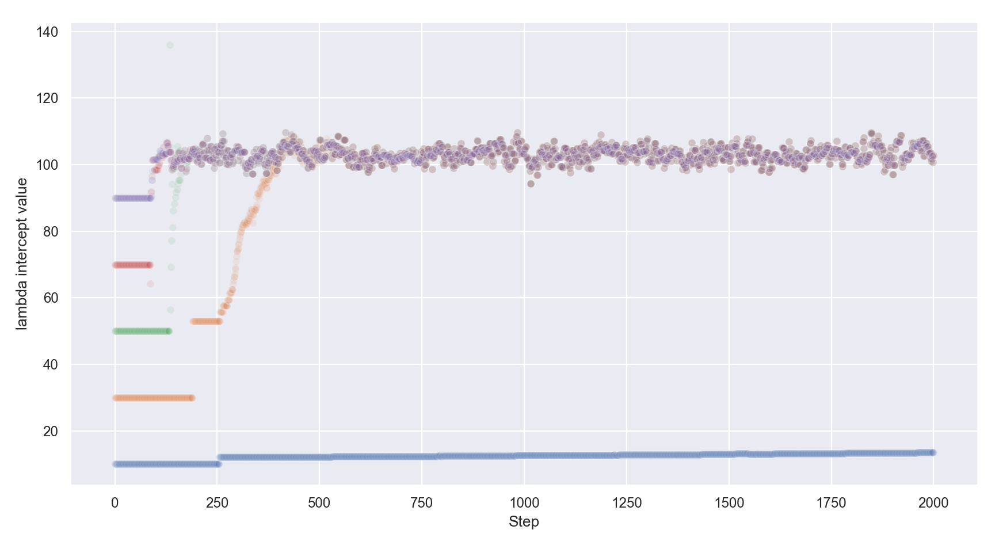

In [627]:
fig, ax = plt.subplots(figsize=(11,6))

for d in all_data:

    y_vals,_= d
    y_vals = y_vals.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)
    
plt.xlabel('Step')
plt.ylabel('lambda intercept value')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


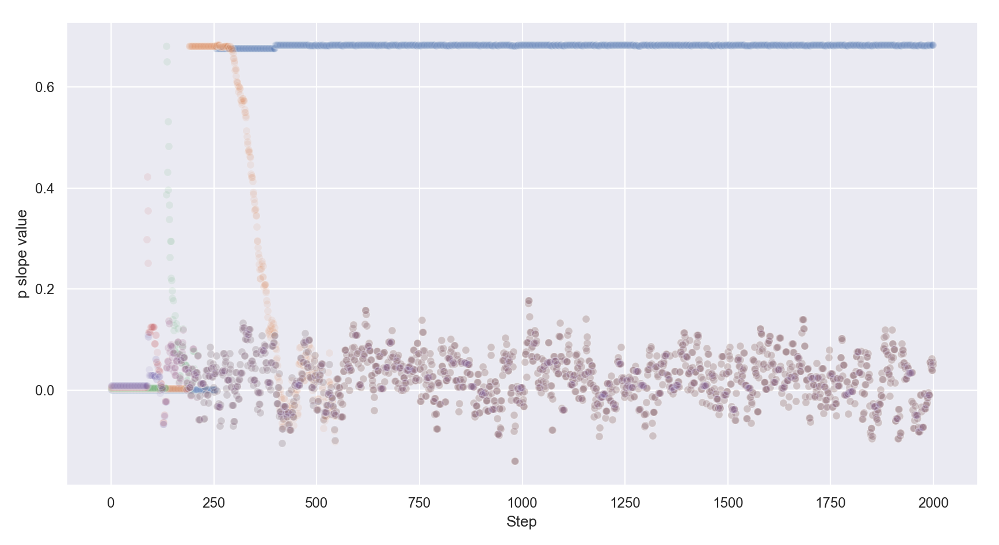

In [628]:
fig, ax = plt.subplots(figsize=(11,6))

for d in all_data:

    _,y_vals= d
    y_vals = y_vals.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)
    
plt.xlabel('Step')
plt.ylabel('p slope value')
plt.tight_layout()

### posterior gradient descent

In [269]:
def Nonconstant_Poisson_posterior_for_gradient(vars_in):

    data_in = BOS_pts

    intrcpt_dist = tfd.Normal(loc = 100, scale = 20)

    max_slope = (max(data_in) -  min(data_in))/len(data_in)
    max_slope = max_slope.astype("float32")
    slope_dist = tfd.Uniform(low = -max_slope, high = +max_slope)  
        
    lambda_intrcpt_obs = vars_in[0]
    lambda_slope_obs = vars_in[1]
        
    lambda_final = [lambda_intrcpt_obs + lambda_slope_obs*i for i,_ in enumerate(data_in)]

    rv_observation = tfd.Poisson(rate = lambda_final)

    final_log_prob = tf.cast(intrcpt_dist.log_prob(lambda_intrcpt_obs),"float32") \
                     + tf.cast(slope_dist.log_prob(lambda_slope_obs),"float32") \
                     + tf.cast(tf.reduce_sum(rv_observation.log_prob(data_in)),"float32")


    final_log_prob = -final_log_prob
    
    return final_log_prob

    
def Nonconstant_Poisson_with_Gradient(vars_in):
    
    vars_in = tf.Variable(vars_in, dtype = tf.float32)
    
    with tf.GradientTape() as tape:
        loss = Nonconstant_Poisson_posterior_for_gradient(vars_in)
        
    grad = tape.gradient(target = loss, sources = vars_in)

    return loss, grad

In [270]:
start = tf.constant([100, .01], dtype = tf.float32)
            
optim_results = tfp.optimizer.bfgs_minimize(Nonconstant_Poisson_with_Gradient, 
                                            initial_position = start, 
                                            tolerance = 1e-8)


optim_results, optim_results.position

(BfgsOptimizerResults(converged=<tf.Tensor: id=61795761, shape=(), dtype=bool, numpy=True>, failed=<tf.Tensor: id=61795741, shape=(), dtype=bool, numpy=False>, num_iterations=<tf.Tensor: id=61795764, shape=(), dtype=int32, numpy=41>, num_objective_evaluations=<tf.Tensor: id=61795766, shape=(), dtype=int32, numpy=168>, position=<tf.Tensor: id=61795117, shape=(2,), dtype=float32, numpy=array([1.0289549e+02, 2.7348625e-02], dtype=float32)>, objective_value=<tf.Tensor: id=61795433, shape=(), dtype=float32, numpy=312.0079>, objective_gradient=<tf.Tensor: id=61795732, shape=(2,), dtype=float32, numpy=array([ 2.2351742e-07, -1.4901161e-05], dtype=float32)>, inverse_hessian_estimate=<tf.Tensor: id=61791973, shape=(2, 2), dtype=float32, numpy=
 array([[ 0.9996353 , -0.01916578],
        [-0.01916578,  0.00100219]], dtype=float32)>),
 <tf.Tensor: id=61795117, shape=(2,), dtype=float32, numpy=array([1.0289549e+02, 2.7348625e-02], dtype=float32)>)

In [271]:
start = tf.constant([110, .1], dtype = tf.float32)
            
optim_results = tfp.optimizer.bfgs_minimize(Nonconstant_Poisson_with_Gradient, 
                                            initial_position = start, 
                                            tolerance = 1e-8)


optim_results, optim_results.position

(BfgsOptimizerResults(converged=<tf.Tensor: id=61836281, shape=(), dtype=bool, numpy=True>, failed=<tf.Tensor: id=61836261, shape=(), dtype=bool, numpy=False>, num_iterations=<tf.Tensor: id=61836284, shape=(), dtype=int32, numpy=12>, num_objective_evaluations=<tf.Tensor: id=61836286, shape=(), dtype=int32, numpy=49>, position=<tf.Tensor: id=61835637, shape=(2,), dtype=float32, numpy=array([1.0289549e+02, 2.7348703e-02], dtype=float32)>, objective_value=<tf.Tensor: id=61835953, shape=(), dtype=float32, numpy=312.00793>, objective_gradient=<tf.Tensor: id=61836252, shape=(2,), dtype=float32, numpy=array([2.6077032e-06, 1.1372566e-04], dtype=float32)>, inverse_hessian_estimate=<tf.Tensor: id=61833125, shape=(2, 2), dtype=float32, numpy=
 array([[ 3.3288918e+00, -6.6704035e-02],
        [-6.6704035e-02,  1.3877735e-03]], dtype=float32)>),
 <tf.Tensor: id=61835637, shape=(2,), dtype=float32, numpy=array([1.0289549e+02, 2.7348703e-02], dtype=float32)>)

In [272]:
start = tf.constant([90, .0001], dtype = tf.float32)
            
optim_results = tfp.optimizer.bfgs_minimize(Nonconstant_Poisson_with_Gradient, 
                                            initial_position = start, 
                                            tolerance = 1e-8)


optim_results, optim_results.position

(BfgsOptimizerResults(converged=<tf.Tensor: id=61907231, shape=(), dtype=bool, numpy=True>, failed=<tf.Tensor: id=61907211, shape=(), dtype=bool, numpy=False>, num_iterations=<tf.Tensor: id=61907234, shape=(), dtype=int32, numpy=20>, num_objective_evaluations=<tf.Tensor: id=61907236, shape=(), dtype=int32, numpy=86>, position=<tf.Tensor: id=61906587, shape=(2,), dtype=float32, numpy=array([1.0289549e+02, 2.7348677e-02], dtype=float32)>, objective_value=<tf.Tensor: id=61906903, shape=(), dtype=float32, numpy=312.00784>, objective_gradient=<tf.Tensor: id=61907202, shape=(2,), dtype=float32, numpy=array([1.4752150e-06, 4.6014786e-05], dtype=float32)>, inverse_hessian_estimate=<tf.Tensor: id=61904075, shape=(2, 2), dtype=float32, numpy=
 array([[ 5.2230616e+00, -1.1004637e-01],
        [-1.1004637e-01,  2.9321879e-03]], dtype=float32)>),
 <tf.Tensor: id=61906587, shape=(2,), dtype=float32, numpy=array([1.0289549e+02, 2.7348677e-02], dtype=float32)>)

In [273]:
start = tf.constant([105, .01], dtype = tf.float32)
            
optim_results = tfp.optimizer.bfgs_minimize(Nonconstant_Poisson_with_Gradient, 
                                            initial_position = start, 
                                            tolerance = 1e-8)


optim_results, optim_results.position

(BfgsOptimizerResults(converged=<tf.Tensor: id=61943770, shape=(), dtype=bool, numpy=True>, failed=<tf.Tensor: id=61943750, shape=(), dtype=bool, numpy=False>, num_iterations=<tf.Tensor: id=61943773, shape=(), dtype=int32, numpy=11>, num_objective_evaluations=<tf.Tensor: id=61943775, shape=(), dtype=int32, numpy=44>, position=<tf.Tensor: id=61943126, shape=(2,), dtype=float32, numpy=array([1.0289549e+02, 2.7348699e-02], dtype=float32)>, objective_value=<tf.Tensor: id=61943442, shape=(), dtype=float32, numpy=312.0079>, objective_gradient=<tf.Tensor: id=61943741, shape=(2,), dtype=float32, numpy=array([2.6077032e-06, 1.1372566e-04], dtype=float32)>, inverse_hessian_estimate=<tf.Tensor: id=61940614, shape=(2, 2), dtype=float32, numpy=
 array([[ 3.1558514e+00, -6.3259929e-02],
        [-6.3259929e-02,  1.3196757e-03]], dtype=float32)>),
 <tf.Tensor: id=61943126, shape=(2,), dtype=float32, numpy=array([1.0289549e+02, 2.7348699e-02], dtype=float32)>)

### sample posterior

In [274]:
nonconst_Pois_samps = Poisson_nonconstant_chain(data_in = BOS_pts, 
                                                  num_results = 10000, 
                                                  burn_in_steps = 2000, 
                                                  start_pnt = [102, .003],
                                                  initial_chain_mean_shift = 1, 
                                                  seed_in = 0, 
                                                  step_size_in = .05)

completed


In [275]:
pos_lam_int_samps, pos_lam_slp_samps = nonconst_Pois_samps

pos_lam_int_samps = pos_lam_int_samps.numpy()
pos_lam_slp_samps = pos_lam_slp_samps.numpy()

In [276]:
some_lam_samps = []

some_p_int_samps =   pos_lam_int_samps[:20]
some_p_slope_samps =   pos_lam_slp_samps[:20]

for p0, ps in zip(some_p_int_samps, some_p_slope_samps):
    
    curr_lams = [(i,p0 + ps*i) for i in range(0,82) ]
    
    some_lam_samps = some_lam_samps + curr_lams

<IPython.core.display.Javascript object>


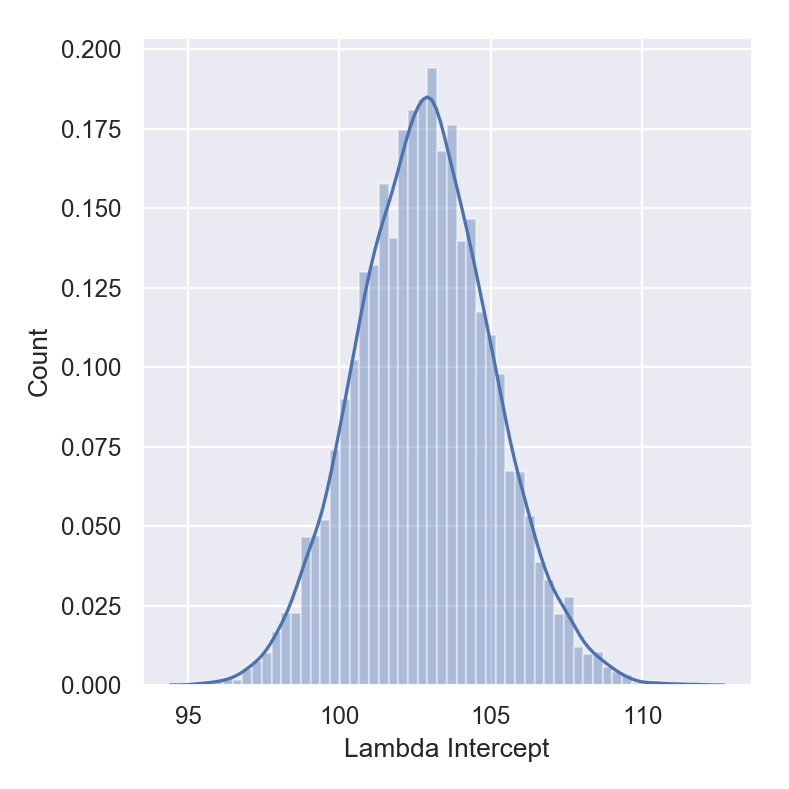

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [293]:
plt.subplots(figsize = (5,5))

sns.distplot(pos_lam_int_samps)

plt.ylabel('Count')
plt.xlabel('Lambda Intercept')
plt.tight_layout()

<IPython.core.display.Javascript object>


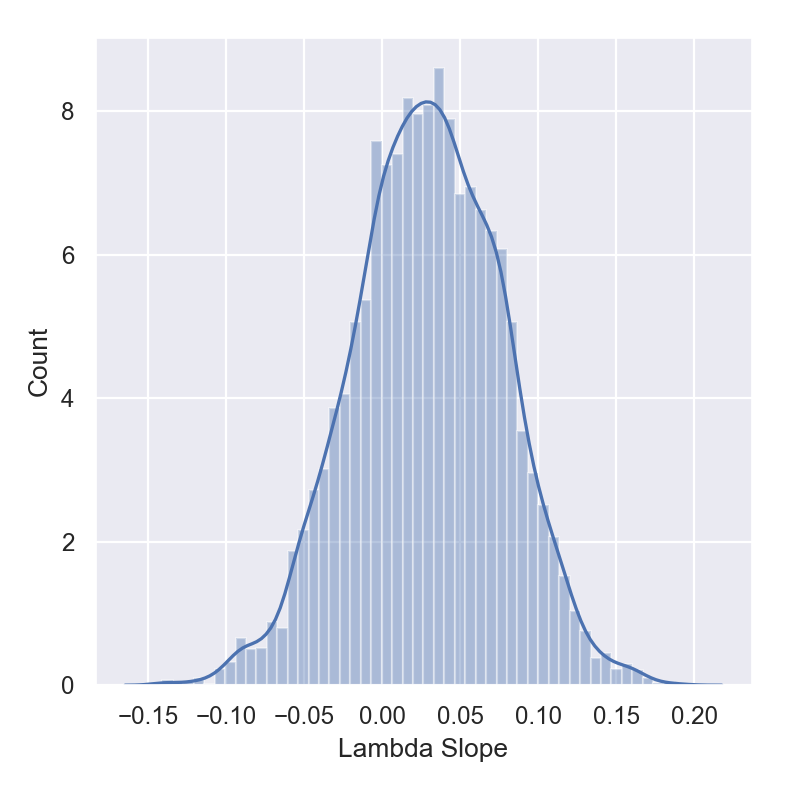

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [294]:
plt.subplots(figsize = (5,5))

sns.distplot(pos_lam_slp_samps)

plt.ylabel('Count')
plt.xlabel('Lambda Slope')
plt.tight_layout()

In [282]:
count_negs = [s<0 for s in pos_lam_slp_samps]

sum(count_negs)/len(count_negs)*100

26.900000000000002

## 17-18 Boston game points, Negative Binomial with linear parameters

### MCMC chain definition

In [408]:
def Test_NegBI_chain(data_in, num_results, burn_in_steps, 
                              start_pnt = [100,.1],
                              initial_chain_mean_shift = 1, seed_in = 0, step_size_in = .05):

    data_in = np.array(data_in).astype("float32")
    
    # There are many ways to make a prior for this, I was trying to be as agnostic as possible. 
#     r_intrcpt_dist = tfd.Normal(loc = 100, scale = 20)
#     r_slope_dist = tfd.Uniform(low = -10, high = +10)  
    
    
#     p_intrcpt_dist = tfd.Normal(loc = .5, scale = .01)
# #    p_slope_dist = tfd.Uniform(low = -.001, high = +.001)  
#     p_slope_dist = tfd.Normal(loc = .1, scale = +.01)  

    r_intrcpt_dist = tfd.Uniform(low = 0, high = +1000) #tfd.Normal(loc = 150, scale = 100)
    r_slope_dist = tfd.Uniform(low = -10, high = +10)  
    
    
    p_intrcpt_dist = tfd.Uniform(low = 0, high = +1)  #tfd.Normal(loc = .5, scale = .1)
    p_slope_dist = tfd.Uniform(low = -1/81, high = +.1/81)  #tfd.Normal(loc = 0, scale = +.1)   #this was loc = .1 for awhile
    
    
    def joint_log_proba(data_in, r_intrcpt_obs, r_slope_obs, p_intrcpt_obs, p_slope_obs):
        
        
#         print(r_intrcpt_obs, r_slope_obs, p_intrcpt_obs, p_slope_obs)
        
        
        r_final = [r_intrcpt_obs + r_slope_obs*i for i,_ in enumerate(data_in)]
        p_final = [p_intrcpt_obs + p_slope_obs*i for i,_ in enumerate(data_in)]

        
        rv_observation = tfd.NegativeBinomial(total_count = r_final, probs = p_final)
        
#         print(r_intrcpt_obs.numpy(), r_slope_obs.numpy(), p_intrcpt_obs.numpy(), p_slope_obs.numpy())
#         print([rf.numpy() for rf in r_final])
#         print([pf.numpy() for pf in p_final])
        
#         print([tf.cast(r_intrcpt_dist.log_prob(r_intrcpt_obs),"float32").numpy(),
#                tf.cast(r_slope_dist.log_prob(r_slope_obs),"float32").numpy(),
#                tf.cast(p_intrcpt_dist.log_prob(p_intrcpt_obs),"float32").numpy(),
#                tf.cast(p_slope_dist.log_prob(p_slope_obs),"float32").numpy(),
#                tf.cast(tf.reduce_sum(rv_observation.log_prob(data_in)),"float32").numpy()]
#              )    
#         print("\n")
    
    
        final_log_prob = tf.cast(r_intrcpt_dist.log_prob(r_intrcpt_obs),"float32") \
                         + tf.cast(r_slope_dist.log_prob(r_slope_obs),"float32") \
                         + tf.cast(p_intrcpt_dist.log_prob(p_intrcpt_obs),"float32") \
                         + tf.cast(p_slope_dist.log_prob(p_slope_obs),"float32") \
                         + tf.cast(tf.reduce_sum(rv_observation.log_prob(data_in)),"float32")
    
#         print(final_log_prob)
    
        return final_log_prob
    
    # just an argument reduction for later calls. 
    def unnormalized_log_posterior(r_intrcpt_obs, r_slope_obs, p_intrcpt_obs, p_slope_obs):
        return joint_log_proba(data_in, r_intrcpt_obs, r_slope_obs, p_intrcpt_obs, p_slope_obs) 
    
    initial_chain_state = [tf.to_float(initial_chain_mean_shift*start_pnt[0]) * tf.ones([], dtype=tf.float32, name="init_inctp"),
                           tf.to_float(initial_chain_mean_shift*start_pnt[1]) * tf.ones([], dtype=tf.float32, name="init_slope"),
                           tf.to_float(initial_chain_mean_shift*start_pnt[2]) * tf.ones([], dtype=tf.float32, name="p_init_inctp"),
                           tf.to_float(initial_chain_mean_shift*start_pnt[3]) * tf.ones([], dtype=tf.float32, name="p_init_slope"),
                           ]


    unconstrained_bijectors = [tfp.bijectors.Exp(),
                               tfp.bijectors.Identity(),
                               tfp.bijectors.Sigmoid(),
                               tfp.bijectors.AffineScalar(scale=.01)#tfp.bijectors.Identity(),
                               ]
    
    my_step_size = tf.get_variable(name = 'step_size',
                                    initializer = tf.constant(step_size_in, dtype = tf.float32),
                                    trainable = False,
                                    use_resource = True,
                                    )
    
    tf.set_random_seed(seed_in)
    
    my_hmc = tfp.mcmc.HamiltonianMonteCarlo(target_log_prob_fn = unnormalized_log_posterior, 
                                            step_size = my_step_size, 
                                            num_leapfrog_steps = 2, #?
                                            state_gradients_are_stopped = True, 
                                            step_size_update_fn = tfp.mcmc.make_simple_step_size_update_policy(),
                                            name = None, #default
                                            )
       
    [r_intrcpt_samples,
     r_slope_samples,
     p_intrcpt_samples,
     p_slope_samples,
    ], kernel_results = tfp.mcmc.sample_chain(num_results = num_results, 
                          num_burnin_steps = burn_in_steps, 
                          current_state = initial_chain_state,                     
                          previous_kernel_results = None, 
                          kernel = tfp.mcmc.TransformedTransitionKernel(inner_kernel = my_hmc, 
                                                                        bijector = unconstrained_bijectors, 
                                                                        name = None,
                                                                        ),
                          num_steps_between_results = 0, #default
                          parallel_iterations = 10, #default
                          name = None, 
                          )
    
    print("completed")
    
    return r_intrcpt_samples, r_slope_samples, p_intrcpt_samples, p_slope_samples

In [1484]:
Test_NegBI_chain(data_in = BOS_pts, 
                      num_results = 5, 
                      burn_in_steps = 0, 
                      start_pnt = [100,.1,.5,.01],
                      initial_chain_mean_shift = 1, seed_in = 0, step_size_in = .05)

completed


(<tf.Tensor: id=852001987, shape=(5,), dtype=float32, numpy=
 array([100.00001, 100.00001, 100.00001, 100.00001, 100.00001],
       dtype=float32)>,
 <tf.Tensor: id=852001988, shape=(5,), dtype=float32, numpy=array([0.1, 0.1, 0.1, 0.1, 0.1], dtype=float32)>,
 <tf.Tensor: id=852001989, shape=(5,), dtype=float32, numpy=array([0.5, 0.5, 0.5, 0.5, 0.5], dtype=float32)>,
 <tf.Tensor: id=852001990, shape=(5,), dtype=float32, numpy=array([0.01, 0.01, 0.01, 0.01, 0.01], dtype=float32)>)

In [407]:
Test_NegBI_chain(data_in = BOS_pts, 
                      num_results = 5, 
                      burn_in_steps = 0, 
                      start_pnt = [500, -.5, .2, 0.005],
                      initial_chain_mean_shift = 1, seed_in = 0, step_size_in = .05)

tf.Tensor(500.00006, shape=(), dtype=float32) tf.Tensor(-0.5, shape=(), dtype=float32) tf.Tensor(0.2, shape=(), dtype=float32) tf.Tensor(0.005, shape=(), dtype=float32)
tf.Tensor(-inf, shape=(), dtype=float32)
tf.Tensor(500.00006, shape=(), dtype=float32) tf.Tensor(-0.5, shape=(), dtype=float32) tf.Tensor(0.2, shape=(), dtype=float32) tf.Tensor(0.005, shape=(), dtype=float32)
tf.Tensor(-inf, shape=(), dtype=float32)
tf.Tensor(1.5401258e-05, shape=(), dtype=float32) tf.Tensor(-2.3331208, shape=(), dtype=float32) tf.Tensor(2.8482526e-05, shape=(), dtype=float32) tf.Tensor(-0.27957642, shape=(), dtype=float32)
tf.Tensor(nan, shape=(), dtype=float32)
tf.Tensor(1.5401258e-05, shape=(), dtype=float32) tf.Tensor(-2.3331208, shape=(), dtype=float32) tf.Tensor(2.8482526e-05, shape=(), dtype=float32) tf.Tensor(-0.27957642, shape=(), dtype=float32)
tf.Tensor(nan, shape=(), dtype=float32)
tf.Tensor(nan, shape=(), dtype=float32) tf.Tensor(nan, shape=(), dtype=float32) tf.Tensor(nan, shape=(), dtype

(<tf.Tensor: id=1693059500, shape=(5,), dtype=float32, numpy=
 array([500.00006, 500.00006, 500.00006, 500.00006, 500.00006],
       dtype=float32)>,
 <tf.Tensor: id=1693059501, shape=(5,), dtype=float32, numpy=array([-0.5, -0.5, -0.5, -0.5, -0.5], dtype=float32)>,
 <tf.Tensor: id=1693059502, shape=(5,), dtype=float32, numpy=array([0.2, 0.2, 0.2, 0.2, 0.2], dtype=float32)>,
 <tf.Tensor: id=1693059503, shape=(5,), dtype=float32, numpy=array([0.005, 0.005, 0.005, 0.005, 0.005], dtype=float32)>)

### check starting points 

In [1501]:
all_data = []
for shift in np.linspace(.6,1,5):
    curr = Test_NegBI_chain(data_in = BOS_pts, 
                              num_results = 2000, 
                              burn_in_steps = 0, 
                              start_pnt = [600, -.8, .25, .001],#[100, .1, .5, .01],
                              initial_chain_mean_shift = shift, 
                              seed_in = 0, 
                              step_size_in = .05) 

    all_data.append(curr)

completed
completed
completed
completed
completed


In [ ]:
left above running 4:30pm friday

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


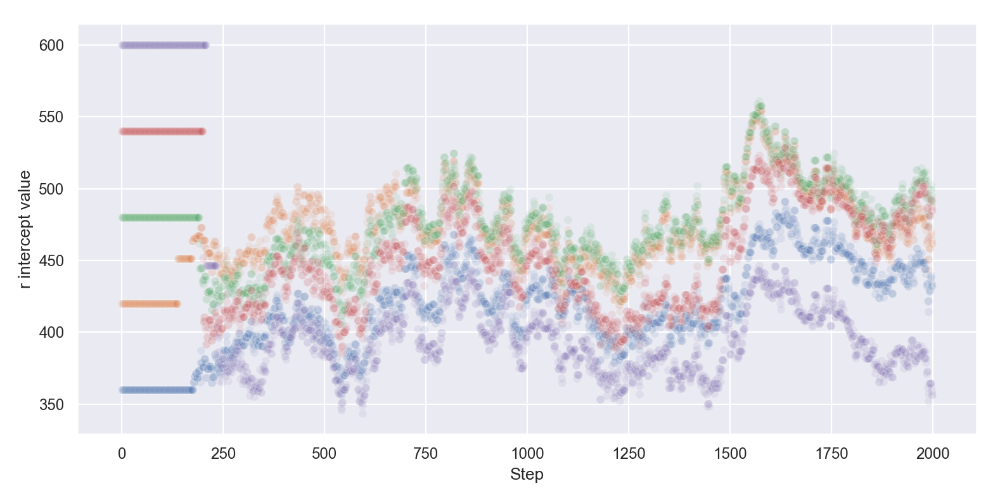

In [1502]:
fig, ax = plt.subplots(figsize=(10,5))

for d in all_data:

    y_vals,_,_, _ = d
    y_vals = y_vals.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)
    
plt.xlabel('Step')
plt.ylabel('r intercept value')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


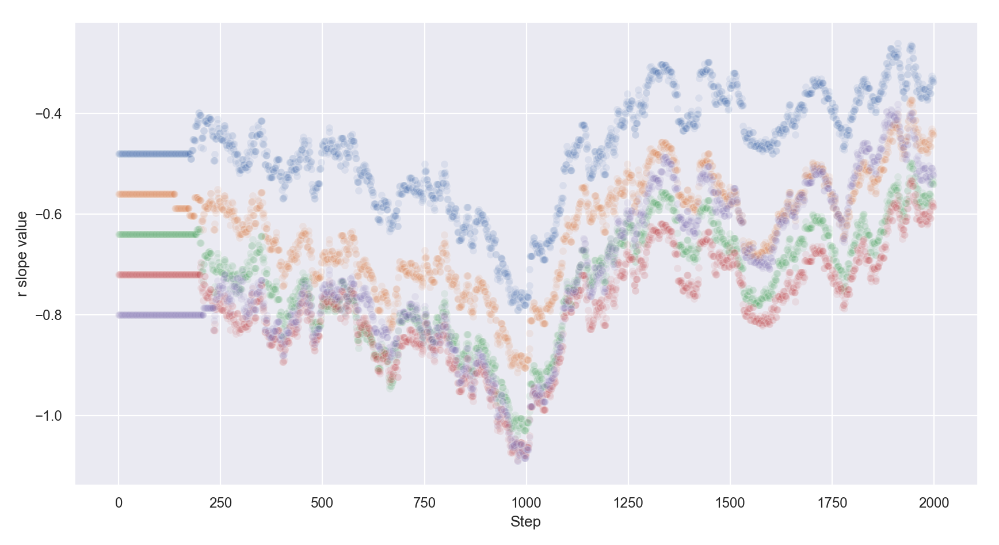

In [1503]:
fig, ax = plt.subplots(figsize=(11,6))

for d in all_data:

    _, y_vals, _, _ = d
    y_vals = y_vals.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)
    
plt.xlabel('Step')
plt.ylabel('r slope value')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


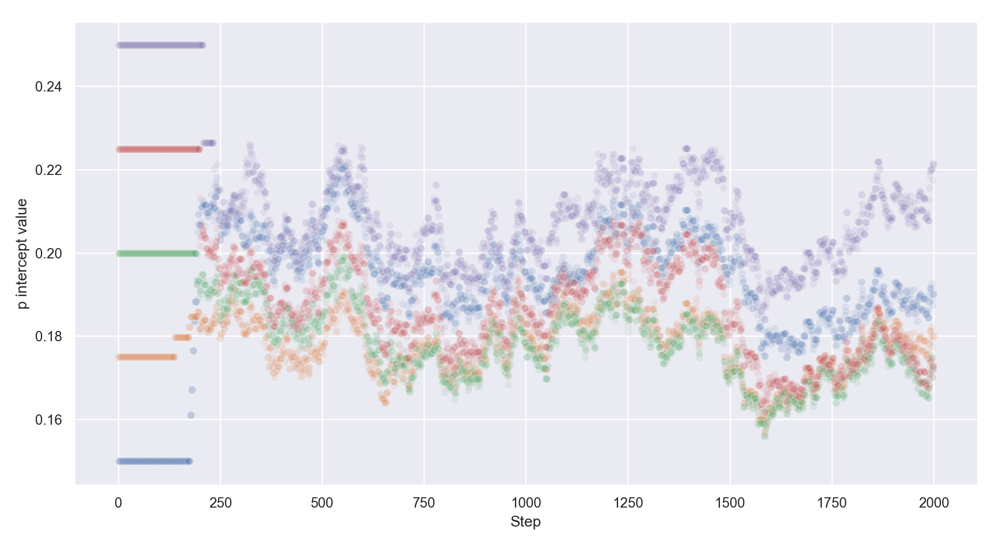

In [1504]:
fig, ax = plt.subplots(figsize=(11,6))

for d in all_data:

    _, _, y_vals, _ = d
    y_vals = y_vals.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)

plt.xlabel('Step')
plt.ylabel('p intercept value')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


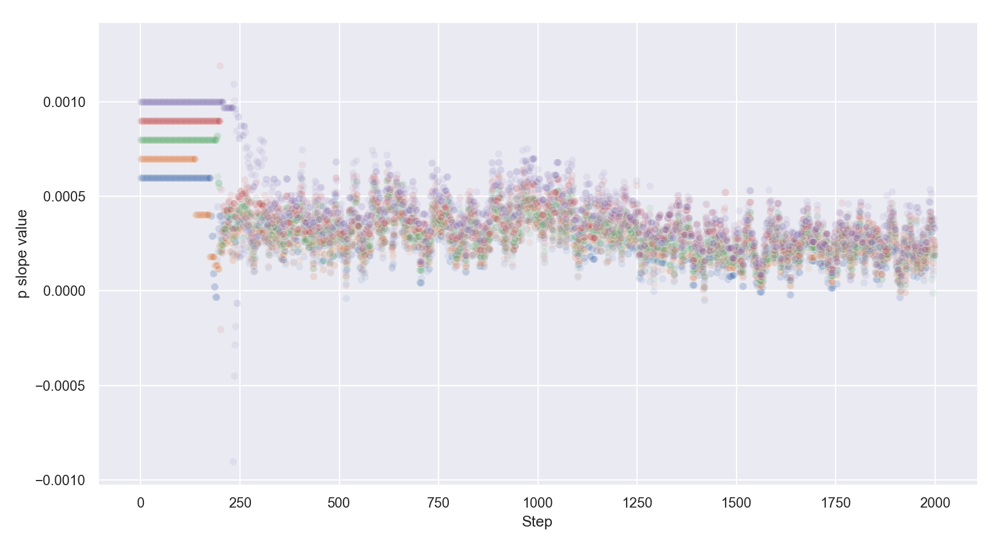

In [1505]:
fig, ax = plt.subplots(figsize=(11,6))

for d in all_data:

    _, _, _, y_vals = d
    y_vals = y_vals.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)
    
#plt.ylim(0,)
plt.xlabel('Step')
plt.ylabel('p slope value')
plt.tight_layout()

### posterior gradient optimization

In [646]:
def TimeDep_Negative_Binomial_for_GradientTape(vars_in):

    data_in = np.array(BOS_pts).astype("float32")
    
    # There are many ways to make a prior for this, I was trying to be as agnostic as possible. 
    r_intrcpt_dist = tfd.Uniform(low = 0, high = +1000) #tfd.Normal(loc = 150, scale = 100)
    r_slope_dist = tfd.Uniform(low = -10, high = +10)  
    
    
    p_intrcpt_dist = tfd.Uniform(low = 0, high = +1)  #tfd.Normal(loc = .5, scale = .1)
    p_slope_dist = tfd.Uniform(low = -1/81, high = +.1/81)  #tfd.Normal(loc = 0, scale = +.1)   #this was loc = .1 for awhile
    
    
    r_intrcpt_obs = vars_in[0]
    r_slope_obs = vars_in[1]
    p_intrcpt_obs = vars_in[2]
    p_slope_obs = vars_in[3]
    

    r_final = [r_intrcpt_obs + r_slope_obs*i for i,_ in enumerate(data_in)]
    p_final = [p_intrcpt_obs + p_slope_obs*i for i,_ in enumerate(data_in)]


    rv_observation = tfd.NegativeBinomial(total_count = r_final, probs = p_final)

    
    
#     print(r_intrcpt_obs.numpy(), r_slope_obs.numpy(), p_intrcpt_obs.numpy(), p_slope_obs.numpy())
#     print([rf.numpy() for rf in r_final])
#     print([pf.numpy() for pf in p_final])

  #   print([tf.cast(r_intrcpt_dist.log_prob(r_intrcpt_obs),"float32").numpy(),
#            tf.cast(r_slope_dist.log_prob(r_slope_obs),"float32").numpy(),
#            tf.cast(p_intrcpt_dist.log_prob(p_intrcpt_obs),"float32").numpy(),
#            tf.cast(p_slope_dist.log_prob(p_slope_obs),"float32").numpy(),
#            tf.cast(tf.reduce_sum(rv_observation.log_prob(data_in)),"float32").numpy()]
#          )  


#     print(rv_observation.log_prob(data_in))
#     print("\n")    



    final_log_prob = tf.cast(r_intrcpt_dist.log_prob(r_intrcpt_obs),"float32") \
                     + tf.cast(r_slope_dist.log_prob(r_slope_obs),"float32") \
                     + tf.cast(p_intrcpt_dist.log_prob(p_intrcpt_obs),"float32") \
                     + tf.cast(p_slope_dist.log_prob(p_slope_obs),"float32") \
                     + tf.cast(tf.reduce_sum(rv_observation.log_prob(data_in)),"float32")
    
#     print(final_log_prob)
    
    final_log_prob = -final_log_prob
    
    return final_log_prob

    
def TimeDep_Negative_Binomial_with_Gradient(vars_in):
    
    vars_in = tf.Variable(vars_in, dtype = tf.float32)
    
    with tf.GradientTape() as tape:
        loss = TimeDep_Negative_Binomial_for_GradientTape(vars_in)
        
    grad = tape.gradient(target = loss, sources = vars_in)

    return loss, grad

In [654]:
TimeDep_Negative_Binomial_for_GradientTape(start)

<tf.Tensor: id=11797220042, shape=(), dtype=float32, numpy=353.97375>

In [655]:
TimeDep_Negative_Binomial_with_Gradient(start)

(<tf.Tensor: id=11797250978, shape=(), dtype=float32, numpy=353.97375>,
 <tf.Tensor: id=11797251566, shape=(4,), dtype=float32, numpy=
 array([-4.21284819e+00, -1.82220642e+02, -2.40364600e+03, -1.03405016e+05],
       dtype=float32)>)

In [653]:
start = tf.constant([140.0, -.1, .4, +.0001], dtype = tf.float32)
            
optim_results = tfp.optimizer.bfgs_minimize(TimeDep_Negative_Binomial_with_Gradient, 
                                            initial_position = start, 
                                            tolerance = 1e-8)

print(optim_results)
pos = optim_results.position.numpy()
TimeDep_Negative_Binomial_for_GradientTape(pos).numpy(), pos

BfgsOptimizerResults(converged=<tf.Tensor: id=11797188868, shape=(), dtype=bool, numpy=False>, failed=<tf.Tensor: id=11797188848, shape=(), dtype=bool, numpy=False>, num_iterations=<tf.Tensor: id=11797188984, shape=(), dtype=int32, numpy=50>, num_objective_evaluations=<tf.Tensor: id=11797188986, shape=(), dtype=int32, numpy=198>, position=<tf.Tensor: id=11797187621, shape=(4,), dtype=float32, numpy=
array([ 4.9574979e+02, -8.2386953e-01,  1.7088489e-01,  3.1373985e-04],
      dtype=float32)>, objective_value=<tf.Tensor: id=11797188251, shape=(), dtype=float32, numpy=313.9124>, objective_gradient=<tf.Tensor: id=11797188839, shape=(4,), dtype=float32, numpy=
array([-3.1259537e-02, -7.3384118e-01, -9.3324272e+01, -2.3320608e+03],
      dtype=float32)>, inverse_hessian_estimate=<tf.Tensor: id=11797188982, shape=(4, 4), dtype=float32, numpy=
array([[ 8.1962803e+03, -1.1366733e+01, -2.4814911e+00, -2.7152414e-03],
       [-1.1366733e+01,  3.6217657e-01,  4.7812015e-03, -1.5736109e-04],
     

(313.91342,
 array([ 4.9574979e+02, -8.2386953e-01,  1.7088489e-01,  3.1373985e-04],
       dtype=float32))

### sample and plot posterior

In [1518]:
NB_TimeDep_samps = Test_NegBI_chain(data_in = BOS_pts, 
                                              num_results = 10000, 
                                              burn_in_steps = 2000, 
                                              start_pnt = [496, -0.82, 0.17, 0.00031],
                                              initial_chain_mean_shift = 1, 
                                              seed_in = 0, 
                                              step_size_in = .05)

completed


In [1519]:
NB_r_int_samps, NB_r_slp_samps, NB_p_int_samps, NB_p_slp_samps = NB_TimeDep_samps

NB_p_int_samps = NB_p_int_samps.numpy()
NB_p_slp_samps = NB_p_slp_samps.numpy()
NB_r_int_samps = NB_r_int_samps.numpy()
NB_r_slp_samps =NB_r_slp_samps.numpy()

full_p_samps = []

for p0,ps in zip(NB_p_int_samps, NB_p_slp_samps):
    curr_season = [p0 + ps*i for i in range(0,82)]
    full_p_samps.append(curr_season)

full_r_samps = []

for r0,rs in zip(NB_r_int_samps, NB_r_slp_samps):
    curr_season = [r0 + rs*i for i in range(0,82)]
    full_r_samps.append(curr_season)

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


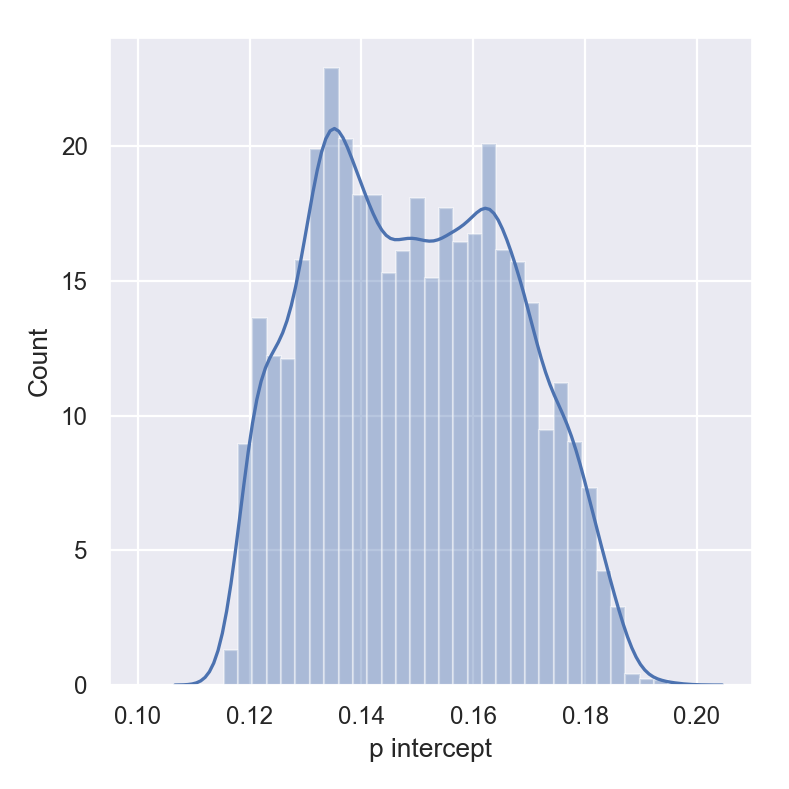

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [1521]:
plt.subplots(figsize = (5,5))

sns.distplot(NB_p_int_samps, bins = np.linspace(.1,.2, 40))

plt.ylabel('Count')
plt.xlabel('p intercept')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


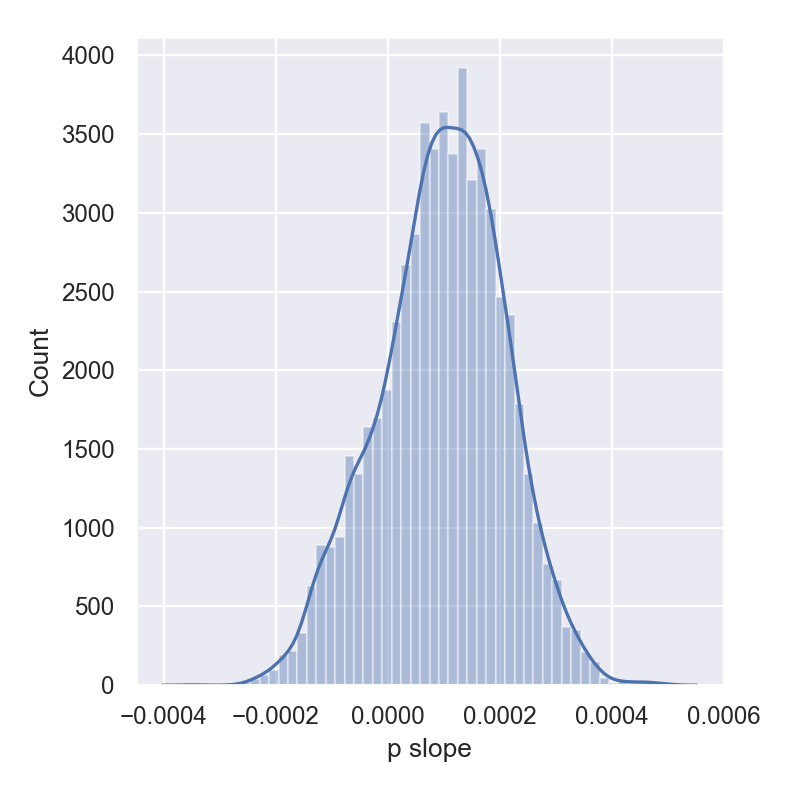

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [1522]:
plt.subplots(figsize = (5,5))

sns.distplot(NB_p_slp_samps)

plt.ylabel('Count')
plt.xlabel('p slope')
plt.tight_layout()

In [1523]:
full_p_samps_flattened = []

for s in full_p_samps:

    full_p_samps_flattened = full_p_samps_flattened + s

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


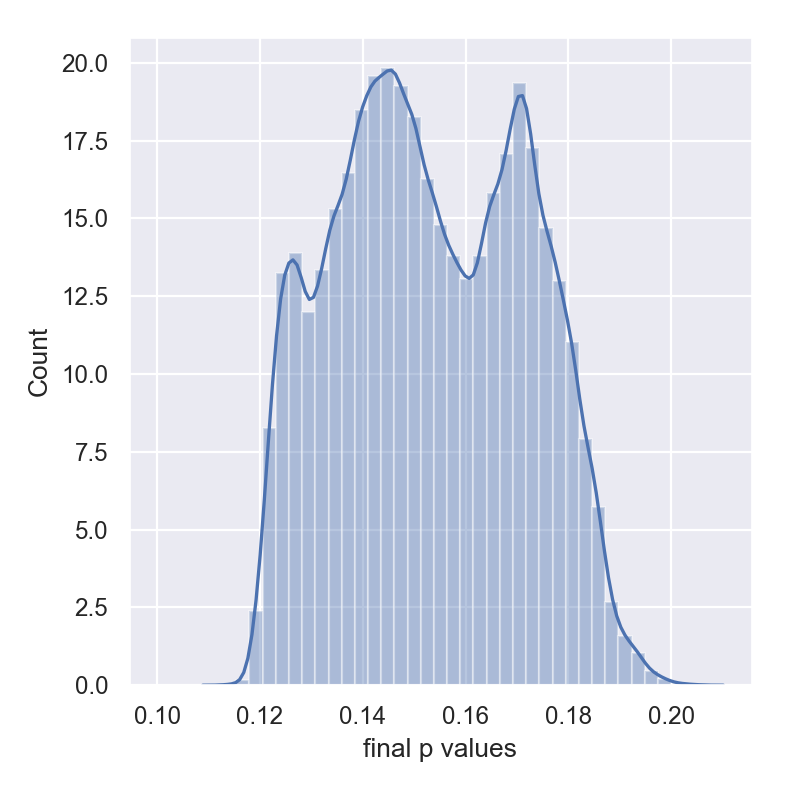

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [1525]:
plt.subplots(figsize = (5,5))

sns.distplot(full_p_samps_flattened, bins = np.linspace(.1,.2, 40))

plt.ylabel('Count')
plt.xlabel('final p values')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


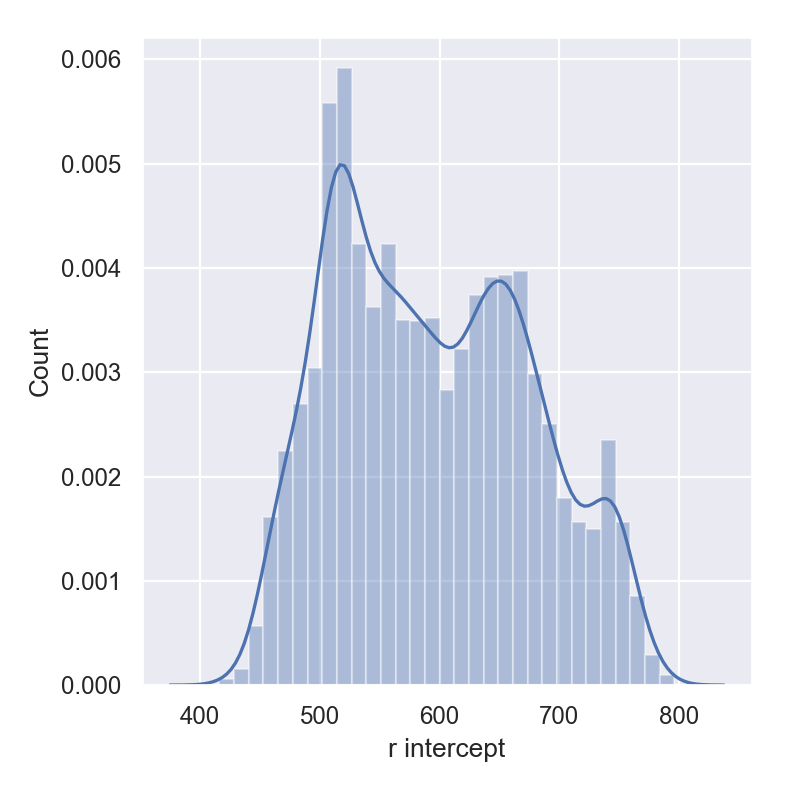

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [1526]:
plt.subplots(figsize = (5,5))
sns.distplot(NB_r_int_samps)

plt.ylabel('Count')
plt.xlabel('r intercept')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


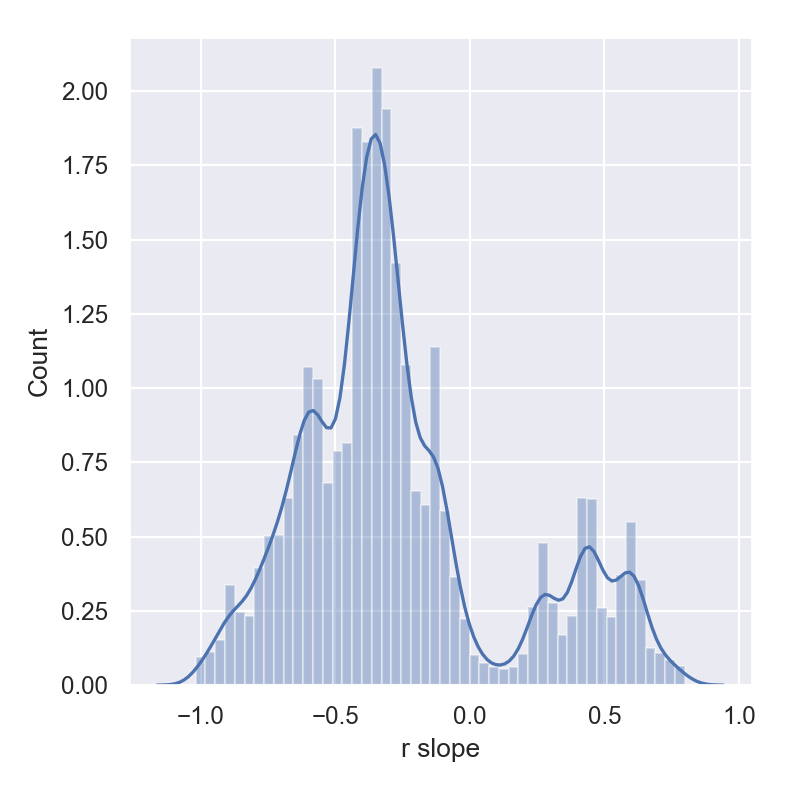

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [1527]:
plt.subplots(figsize = (5,5))
sns.distplot(NB_r_slope_samps)

plt.ylabel('Count')
plt.xlabel('r slope')
plt.tight_layout()

In [1528]:
full_r_samps_flattened = []

for s in full_r_samps:

    full_r_samps_flattened = full_r_samps_flattened + s

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


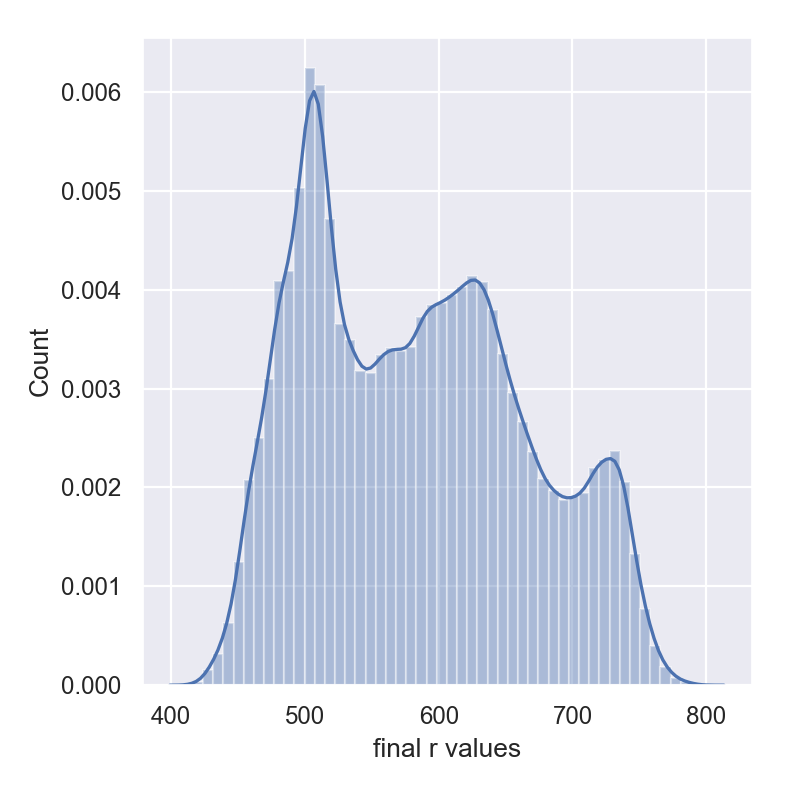

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [1529]:
plt.subplots(figsize = (5,5))
sns.distplot(full_r_samps_flattened)

plt.ylabel('Count')
plt.xlabel('final r values')
plt.tight_layout()

In [1530]:
NB_mean_sampls = []
NB_var_sampls = []

for r_season, p_season in zip(full_r_samps, full_p_samps):
  
    this_season_mean = [r*p/(1-p) for r, p in zip(r_season, p_season)]
    NB_mean_sampls.append(this_season_mean)
    
    this_season_var = [r*p/(1-p)**2 for r, p in zip(r_season, p_season)]
    NB_var_sampls.append(this_season_var)

In [1531]:
full_mean_samps_flattened = []

for s in NB_mean_sampls:

    full_mean_samps_flattened = full_mean_samps_flattened + s

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


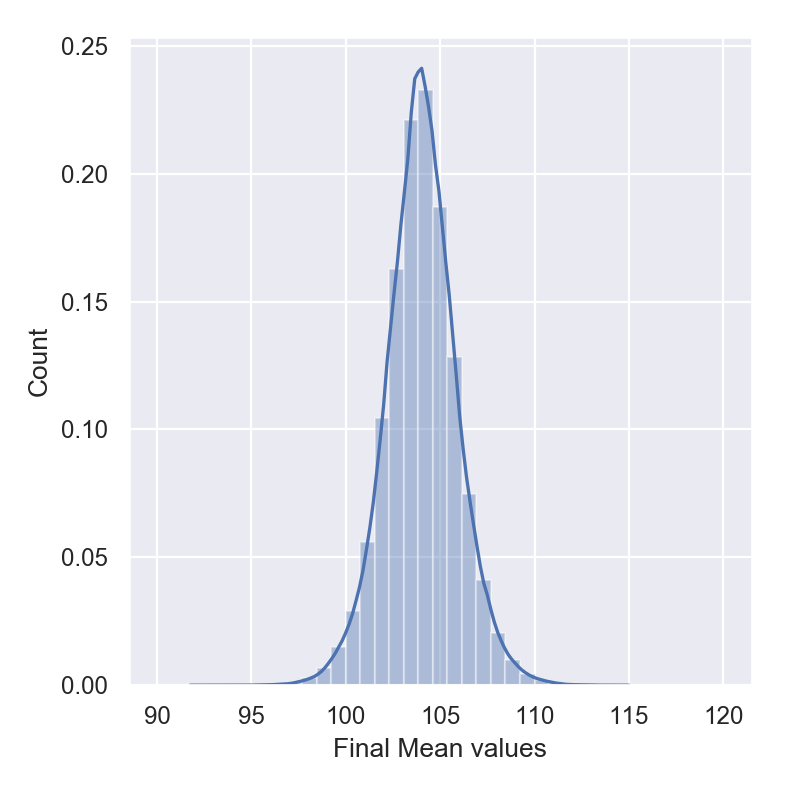

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [1532]:
plt.subplots(figsize = (5,5))
sns.distplot(full_mean_samps_flattened, np.linspace(90,120,40))

plt.ylabel('Count')
plt.xlabel('Final Mean values')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


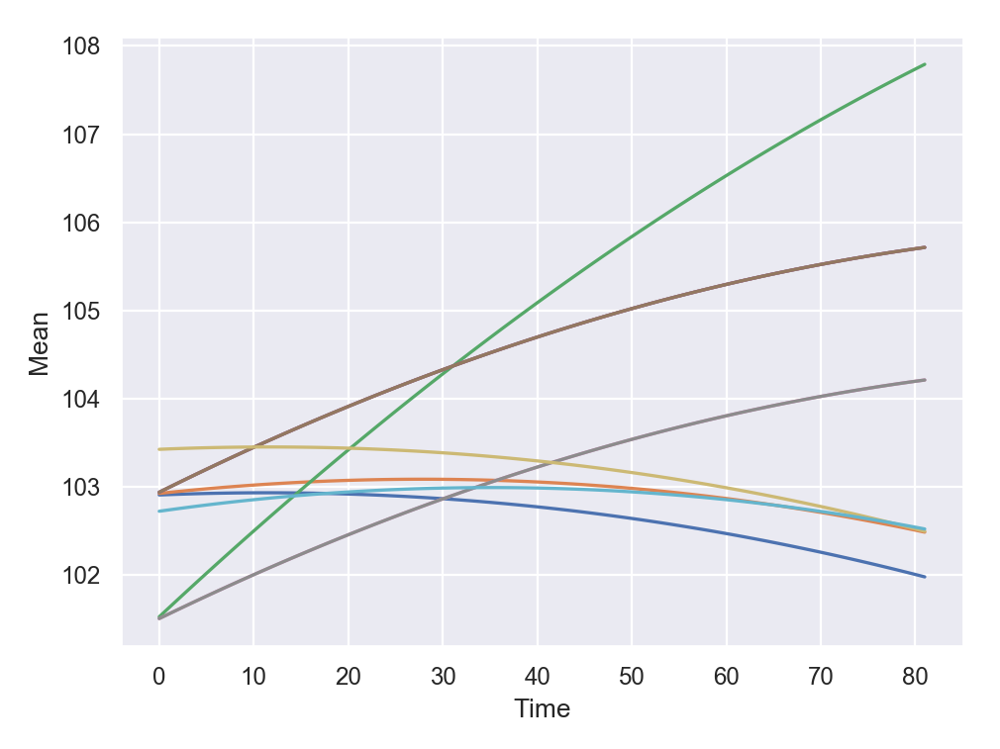

In [1534]:
plt.subplots()

x_vals = range(0,82)

for m in NB_mean_sampls[:10]:
    sns.lineplot(x = x_vals, y = m )
    
plt.xlabel('Time')
plt.ylabel('Mean')
#plt.ylim(80,110)
plt.tight_layout()

In [1535]:
full_var_samps_flattened = []

for s in NB_var_sampls:

    full_var_samps_flattened = full_var_samps_flattened + s

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


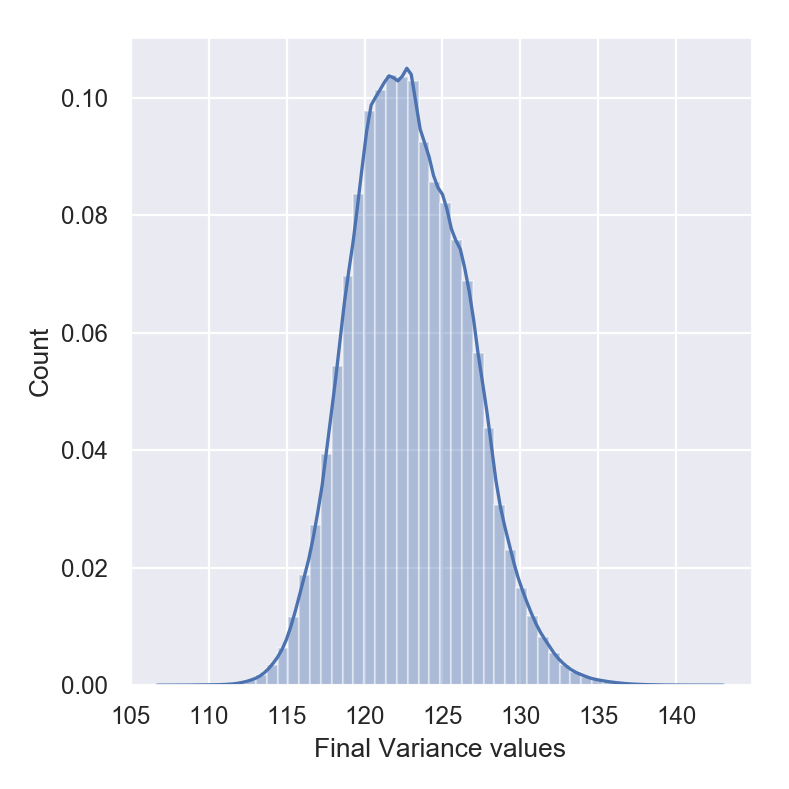

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [1536]:
plt.subplots(figsize = (5,5))
sns.distplot(full_var_samps_flattened)

plt.ylabel('Count')
plt.xlabel('Final Variance values')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


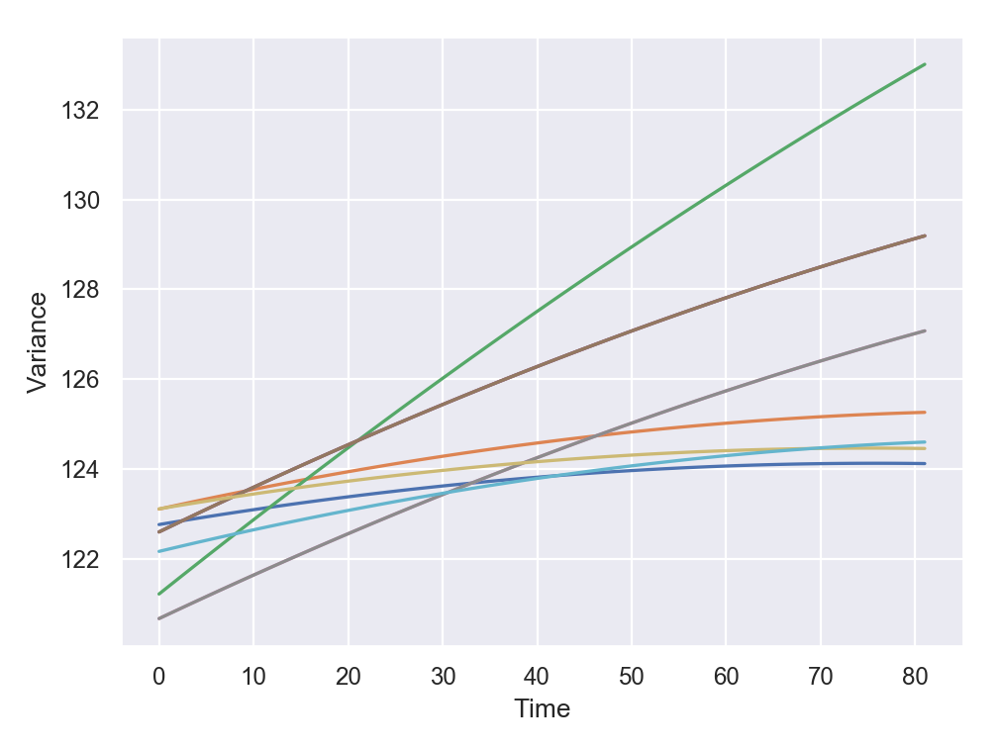

In [1539]:
plt.subplots()

x_vals = range(0,82)

for m in NB_var_sampls[:10]:
    sns.lineplot(x = x_vals, y = m )
    
plt.xlabel('Time')
plt.ylabel('Variance')
#plt.ylim(0,)
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


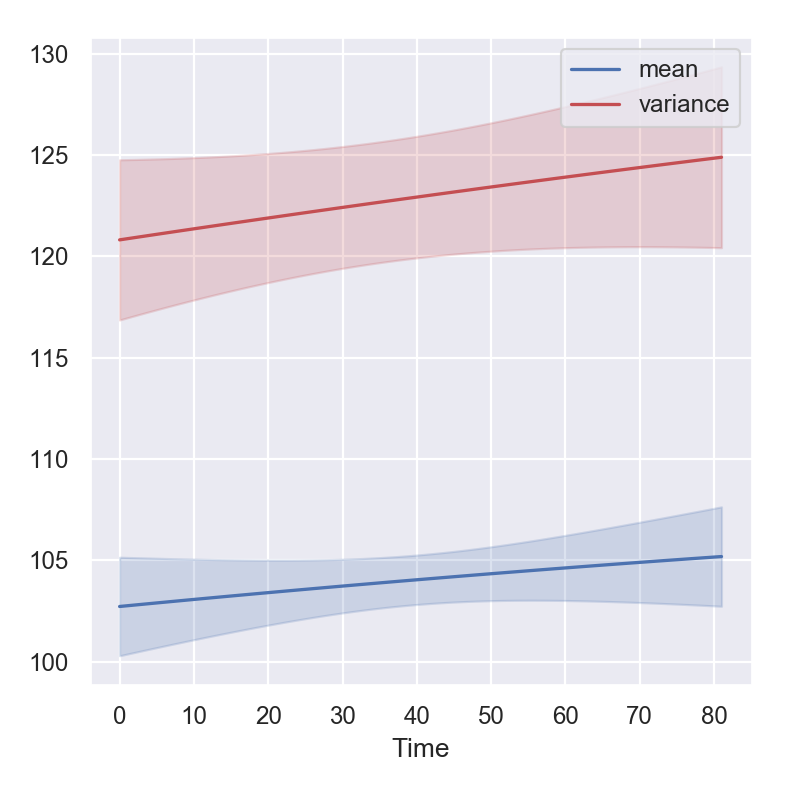

In [1540]:
x_vals = list(range(0,82))*10000

plt.subplots(figsize = (5,5))
sns.lineplot(x = x_vals, y = full_mean_samps_flattened, ci = 'sd', color = 'b', label = 'mean')
sns.lineplot(x = x_vals, y = full_var_samps_flattened, ci = 'sd', color = 'r', label = 'variance')

plt.xlabel('Time')

plt.legend()
plt.tight_layout()

### test statistics and plots

In [1541]:
# generate samples, bins them, and them get confidence bands on the bins

tf.set_random_seed(0)

bins = np.linspace(64,144,21)

bin_mid_pts = [(bins[i]+bins[i+1])/2 for i,_ in enumerate(bins[:-1])]

neg_bi_score_samps = []

all_scores_bined = []

# generate 80 games for each lambda sample
for r,p in zip(full_r_samps, full_p_samps):
    
    this_NegBin_dist = tfd.NegativeBinomial(total_count = r, probs = p)

    score_samps = this_NegBin_dist.sample(sample_shape = 1).numpy().astype(int)
    
    neg_bi_score_samps.append(score_samps[0]) # [0] to get rid of redundant [[]]
    
    scores_binned, _ = np.histogram(score_samps, bins = bins, density=True)
    all_scores_bined.append(scores_binned)

#  transpose so that now we have an array, with each entry is a list of bin counts 
all_scores_bined = np.array(all_scores_bined)    
all_scores_bined = all_scores_bined.T

# find the confidence intervals for each bin
p025_bin_vals, p1_bin_vals, median_bin_vals, p9_bin_vals, p975_bin_vals = \
    zip(*[(np.quantile(b,.025), np.quantile(b,.1), np.median(b), np.quantile(b,.9), np.quantile(b,.975)) for b in all_scores_bined])

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


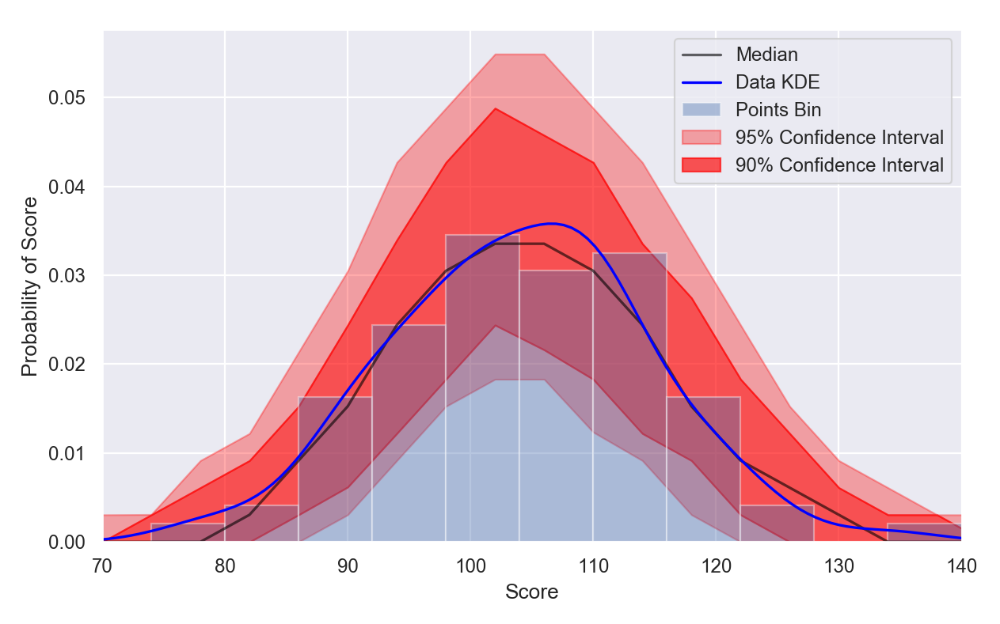

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [1542]:
fig, ax = plt.subplots(figsize = (8,5))

# break the 95 confidence band into two pieces, above and below 90 band for easier legend
band_95 = ax.fill_between(x = bin_mid_pts, y1 = p025_bin_vals, y2 = p1_bin_vals, **{'alpha':.33, 'color':'red'},label='95% Confidence Interval')
band_90 = ax.fill_between(x = bin_mid_pts, y1 = p1_bin_vals, y2 = p9_bin_vals, **{'alpha':.66, 'color':'red'},label='90% Confidence Interval')
ax.fill_between(x = bin_mid_pts, y1 = p9_bin_vals, y2 = p975_bin_vals, **{'alpha':.33, 'color':'red'} )

median_line = ax.plot(bin_mid_pts, median_bin_vals, alpha = .6, color = 'black', label = 'Median')

data_line = sns.kdeplot(BOS_pts.astype(int), color = 'blue', label = 'Data KDE')

bins = np.arange(50,150,6) #np.linspace(50,150,101)

bined_plot = sns.distplot(BOS_pts, kde = False, norm_hist=True, bins = bins, label = 'Points Bin')

plt.xlabel('Score')
plt.ylabel('Probability of Score')
#plt.ylim(0,.062)
plt.xlim(70,140)
plt.legend()
plt.tight_layout()

In [1543]:
max_of_data = max(BOS_pts)

TF_max = [max(s)>=max_of_data for s in neg_bi_score_samps]

sum(TF_max)/len(TF_max)*100

38.57

In [1544]:
min_of_data = min(BOS_pts)

TF_min = [min(s)<=min_of_data for s in neg_bi_score_samps]

sum(TF_min)/len(TF_min)*100

51.61

In [1545]:
lowest_4 = []
highest_4 = []

for s in neg_bi_score_samps:
    srtd = sorted(s)

    lowest_4.append(my_jitter(srtd[0], jiggle=.2))
    highest_4.append(my_jitter(srtd[-1], jiggle=.2))

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


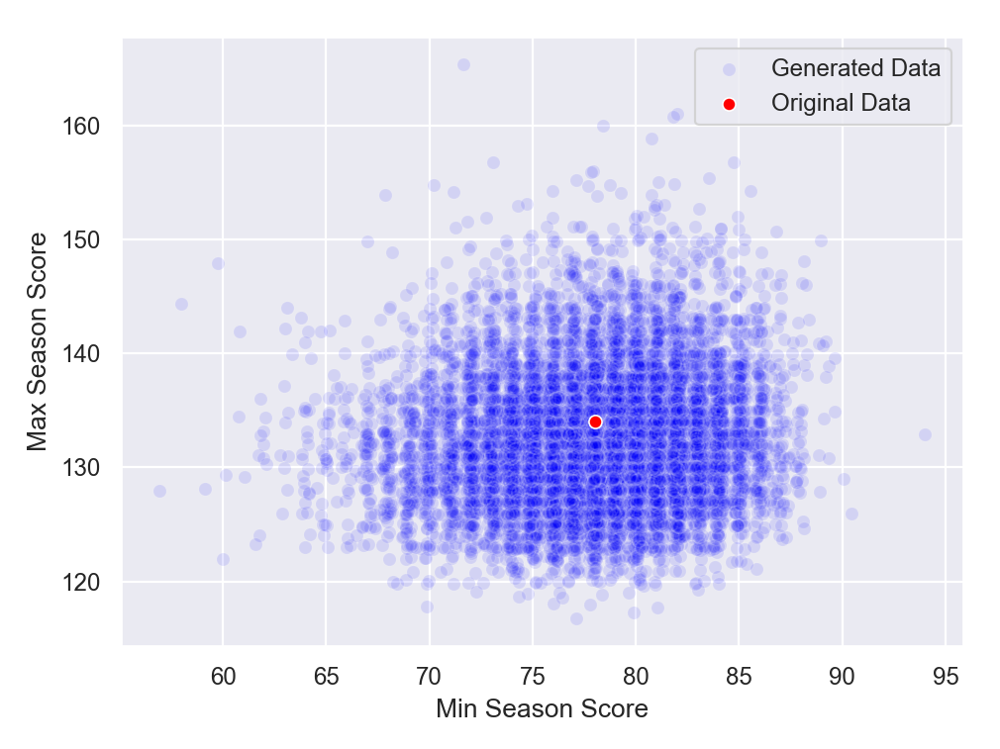

In [1546]:
plt.subplots()

sns.scatterplot(x = lowest_4, y = highest_4, alpha = .1, color = 'blue', label = 'Generated Data')

sns.scatterplot(x = [min(BOS_pts)], y = [max(BOS_pts)], color = 'red', label = 'Original Data')

plt.xlabel('Min Season Score')
plt.ylabel('Max Season Score')
plt.legend()
plt.tight_layout()

In [1547]:
np.var(BOS_pts)

106.84131469363473

In [1548]:
BOS_var = np.var(BOS_pts)

neg_bi_vars = [np.var(s) for s in neg_bi_score_samps]

test_vars = [v>BOS_var for v in neg_bi_vars]

sum(test_vars)/len(test_vars)*100

80.07

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


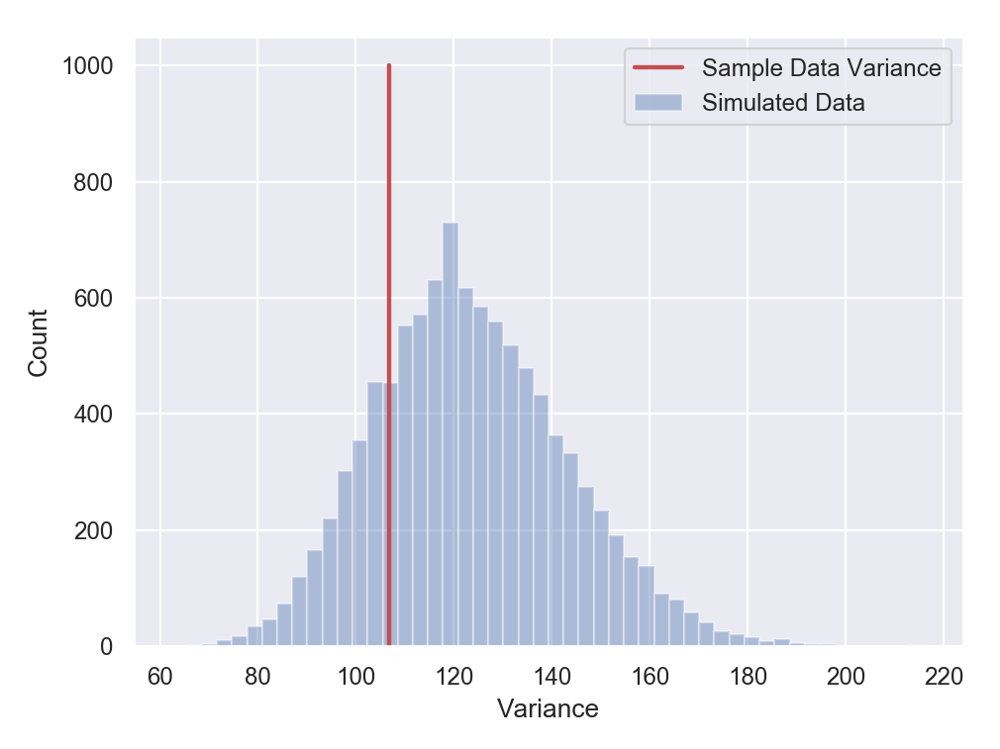

In [1549]:
plt.subplots()

sns.distplot(neg_bi_vars, kde = False, label = 'Simulated Data')

BOS_var = np.var(BOS_pts)

plt.plot((BOS_var, BOS_var), (0, 1000) , linewidth = 2, color = 'r', label = 'Sample Data Variance')

plt.ylabel('Count')
plt.xlabel('Variance')
plt.legend()
plt.tight_layout()

In [1550]:
BOS_skew = stats.skew(BOS_pts)
BOS_skew

0.030262395363889794

In [1551]:
BOS_skew = stats.skew(BOS_pts)

neg_bi_skews = [stats.skew(s) for s in neg_bi_score_samps]

test_skews = [s>BOS_skew for s in neg_bi_skews]

sum(test_skews)/len(test_skews)*100

62.43

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


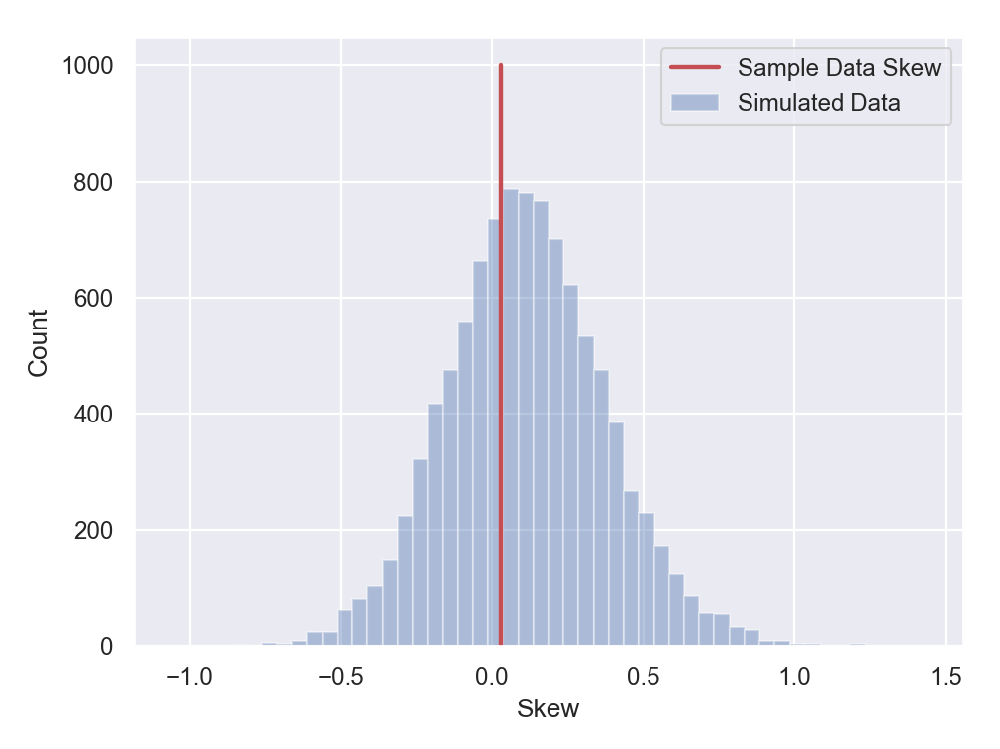

In [1552]:
plt.subplots()

sns.distplot(neg_bi_skews, kde = False, label = 'Simulated Data')

BOS_var = np.var(BOS_pts)

plt.plot((BOS_skew, BOS_skew), (0, 1000) , linewidth = 2, color = 'r', label = 'Sample Data Skew')

plt.ylabel('Count')
plt.xlabel('Skew')
plt.legend()
plt.tight_layout()

In [1553]:
neg_bi_kurt = [stats.kurtosis(s) for s in neg_bi_score_samps]

In [1554]:
BOS_kurt = stats.kurtosis(BOS_pts)
BOS_kurt

0.1030400449052995

In [1555]:
lt_kurts = [k>=BOS_kurt for k in neg_bi_kurt]

sum(lt_kurts)/len(lt_kurts)*100

30.349999999999998

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


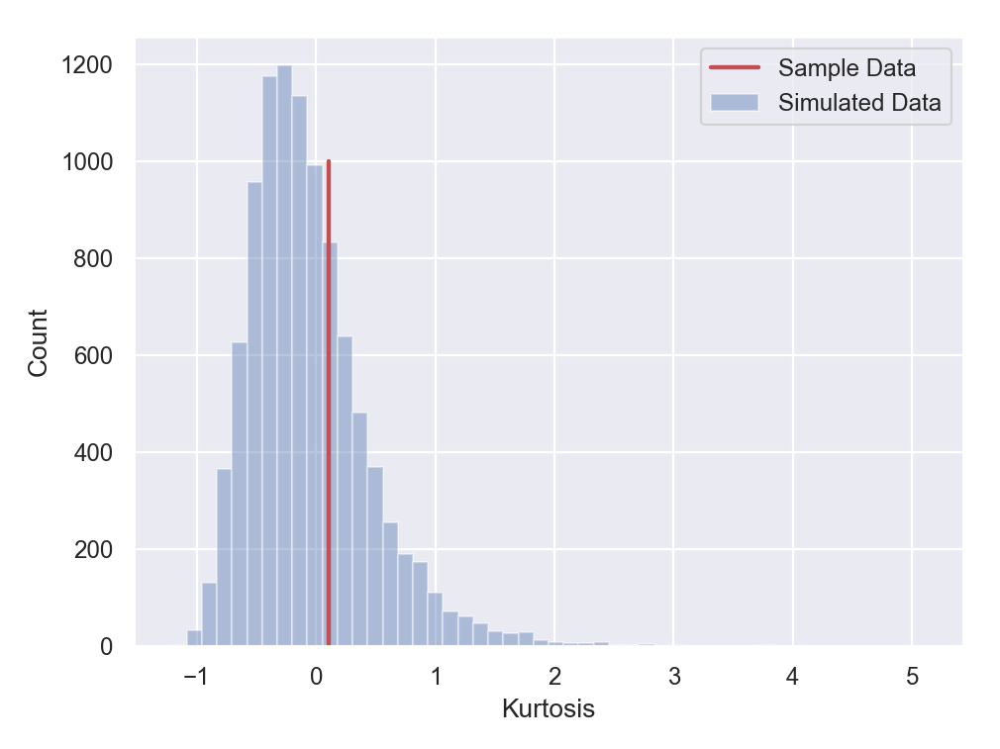

In [1556]:
plt.subplots()

sns.distplot(neg_bi_kurt, kde = False, label = 'Simulated Data')

BOS_var = np.var(BOS_pts)

plt.plot((BOS_kurt, BOS_kurt), (0, 1000) , linewidth = 2, color = 'r', label = 'Sample Data')

plt.ylabel('Count')
plt.xlabel('Kurtosis')
plt.legend()
plt.tight_layout()

In [1557]:
bins = np.linspace(89,120,32)

neg_bi_binned_arr = [np.histogram(a = s, bins = bins)[0] for s in neg_bi_score_samps]

# count_0_bins = np.count_nonzero(np.array(pos_binned_arr)==0, axis = 1)
# count_gt6_bins = np.count_nonzero(np.array(pos_binned_arr)>6, axis = 1)
#possibles = np.logical_and(count_0_bins>=2, count_gt6_bins>=2)


count_0_bins = np.count_nonzero(np.array(neg_bi_binned_arr)==0, axis = 1)
final_count_0_bins = [b>=2 for b in count_0_bins]
count_gt6_bins = np.count_nonzero(np.array(neg_bi_binned_arr)>6, axis = 1)
final_count_gt6_bins = [b>=2 for b in count_gt6_bins]

In [1558]:
sum(final_count_0_bins)/len(final_count_0_bins)*100

93.75

In [1559]:
sum(final_count_gt6_bins)/len(final_count_gt6_bins)*100

3.82

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


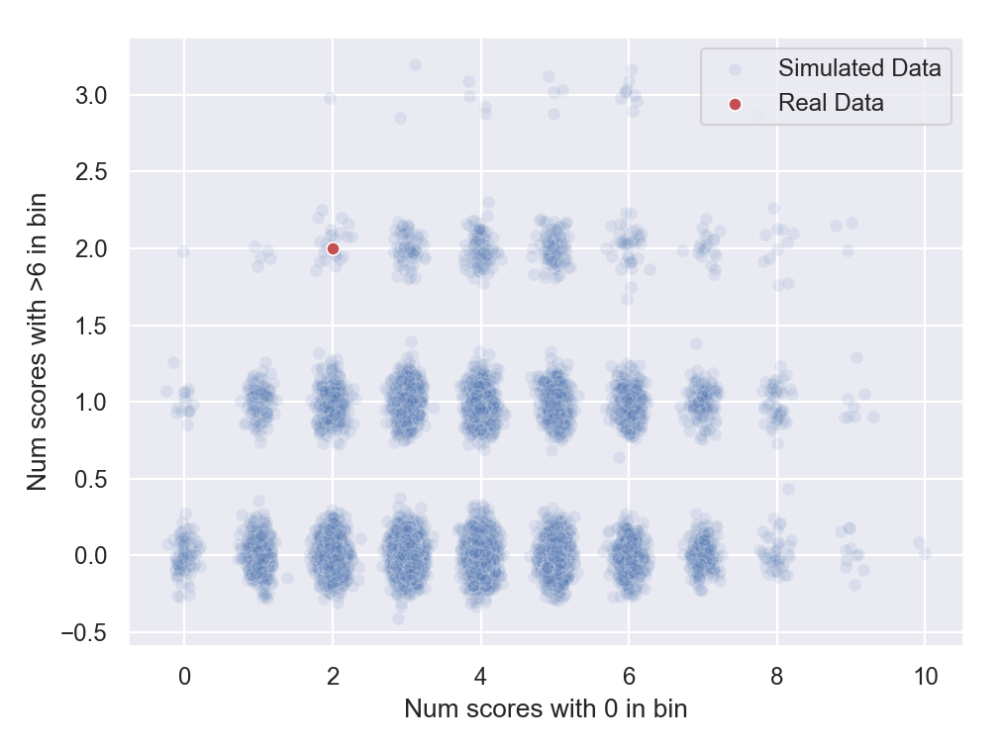

In [1560]:
plt.subplots()

# add some jitter to see all the points
new_count_0s = [my_jitter(i) for i in count_0_bins]
new_count_gt6 = [my_jitter(i) for i in count_gt6_bins]

sns.scatterplot(x = new_count_0s, y = new_count_gt6, color = 'b', alpha = .1, label = 'Simulated Data')

sns.scatterplot(x = [2], y = [2], color = 'r', label = 'Real Data') # the data 

plt.xlabel('Num scores with 0 in bin')
plt.ylabel('Num scores with >6 in bin')
plt.legend(loc = 1)
plt.tight_layout()

In [1561]:
just_neg_bi_samps = []

just_neg_bi_sampls_over_time = []

for r,p in zip(full_r_samps, full_p_samps):
    
    this_NegBin_dist = tfd.NegativeBinomial(total_count = r, probs = p)
    curr_samps = this_NegBin_dist.sample(sample_shape = 1).numpy()[0] # gives[[...]] array, so just take [0] comp
    
    just_neg_bi_samps.append(curr_samps)
    just_neg_bi_sampls_over_time.append(curr_samps)
    
just_neg_bi_samps = np.array(just_neg_bi_samps).T # now each entry is for a given time. 

In [1562]:
p025_quart, p1_quart, p5_quart, p9_quart, p975_quart = np.quantile(a = just_neg_bi_samps, q = [.025, .1, .5, .9, .975], axis = 1) 

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


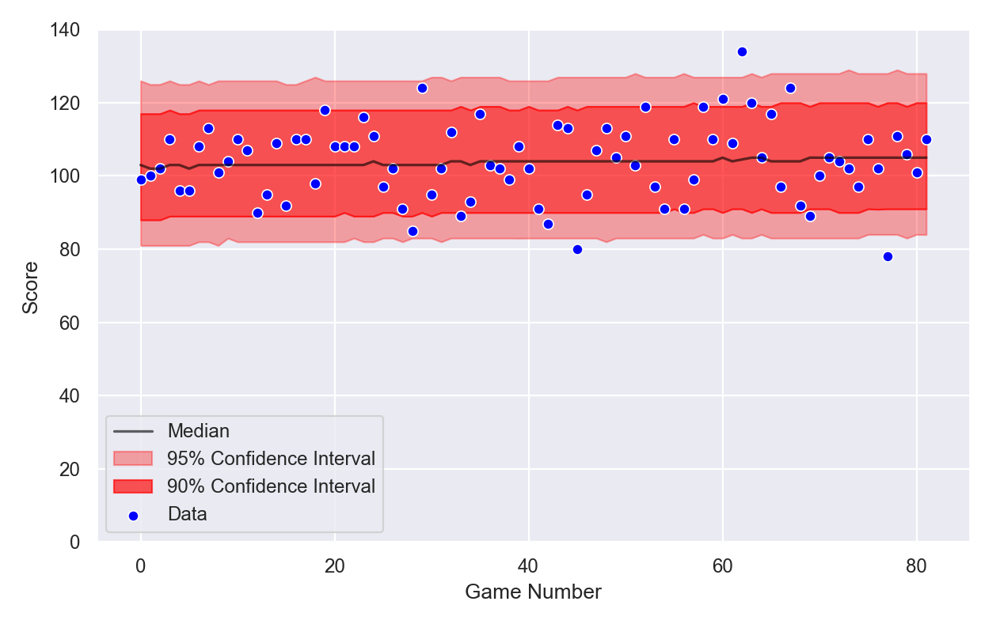

In [1563]:
fig, ax = plt.subplots(figsize = (8,5))

t_vals = range(0,82)

# break the 95 confidence band into two pieces, above and below 90 band for easier legend
band_95 = ax.fill_between(x = t_vals, y1 = p025_quart, y2 = p1_quart, **{'alpha':.33, 'color':'red'},label='95% Confidence Interval')
band_90 = ax.fill_between(x = t_vals, y1 = p1_quart, y2 = p9_quart, **{'alpha':.66, 'color':'red'},label='90% Confidence Interval')
ax.fill_between(x = t_vals, y1 = p9_quart, y2 = p975_quart, **{'alpha':.33, 'color':'red'} )
median_line = ax.plot(t_vals, p5_quart, alpha = .6, color = 'black', label = 'Median')

data_line = sns.scatterplot(x = t_vals, y = BOS_pts, color = 'blue', label = 'Data')

plt.xlabel('Game Number')
plt.ylabel('Score')
plt.ylim(0,140)
plt.tight_layout()

In [1564]:
np.var(BOS_pts)

106.84131469363473

In [1565]:
np.var(BOS_pts[0:41]), np.var(BOS_pts[41:])

(73.99881023200476, 138.96966091612137)

In [1566]:
first_half = [np.var(pts[:41]) for pts in just_neg_bi_sampls_over_time]
second_half = [np.var(pts[41:]) for pts in just_neg_bi_sampls_over_time]

BOS_first_half = np.var(BOS_pts[0:41])
BOS_second_half = np.var(BOS_pts[41:])

possibles = np.logical_and(first_half<=BOS_first_half, second_half>=BOS_second_half)

In [1567]:
sum(possibles)/len(possibles)*100

0.62

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


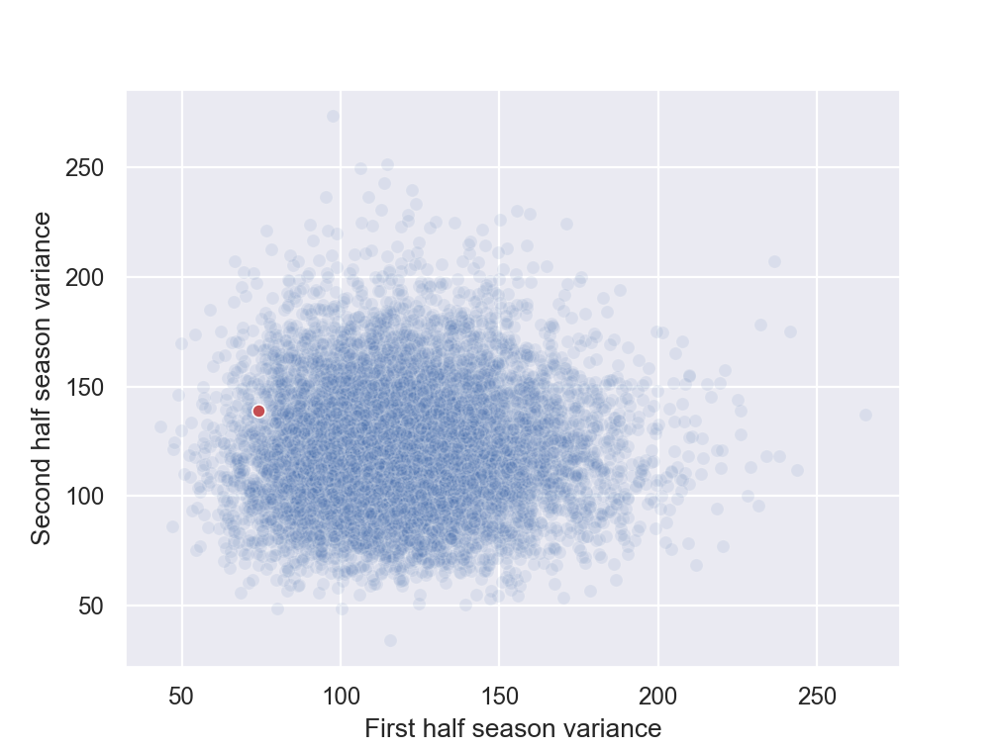

Text(0,0.5,'Second half season variance')

In [1568]:
plt.subplots()

sns.scatterplot(x = first_half, y = second_half, color = 'b', alpha = .1)

sns.scatterplot(x = [BOS_first_half], y = [BOS_second_half], color = 'r')

plt.xlabel('First half season variance')
plt.ylabel('Second half season variance')

In [1569]:
np.mean(first_half), np.mean(second_half)

(119.9498484235574, 121.71778941106484)

## 17-18 Boston game points, Conway-Maxwell-Poisson (CMP) Distribution

### definitions for approximate distribution

In [10]:
from scipy.special import factorial

In [42]:
def log10_CMP_normalization(lam, nu):
    """An approximation for the CMP normalization constant from http://www.doiserbia.nb.rs/img/doi/0354-5180/2016/0354-51801604953S.pdf"""
    
    alp = lam**(1/nu)

    return nu*alp*np.log10(np.e) - ((nu-1)/2)*np.log10(2*np.pi*alp)
        
def log_P_NoNorm(x, lam, nu):
    """Log probability with Stirlings approximation when x>10. """
    
    if x<=10:
        return np.log10((lam**x)/(factorial(x)**nu))
    elif x>10:
        return x*np.log10(lam) - (nu/2)*np.log10(2*np.pi*x)-x*nu*np.log10(x/np.e)

In [43]:
class Conway_Maxwell_Poisson_distribution(object):
    r"""my own Conway_Maxwell_Poisson_distribution class"""
    def __init__(self, lam, nu):
        self.lam = lam
        self.nu = nu
        self.lognorm = log10_CMP_normalization(lam, nu)
    
    def log_prob(self, x):
        
        lam = self.lam
        nu = self.nu
        lognorm = self.lognorm  

        return log_P_NoNorm(x, lam, nu) - lognorm
      
    def prob(self, x):
    
        return 10**(self.log_prob(x))
   
    def sample(self, sample_size):
    
        probs = [self.prob(i) for i in range(1000)]
        
        # have to renormalize due to error from approximation
        probs = np.array(probs)/sum(probs)
    
        samps = np.random.choice(a = 1000, 
                                 size = sample_size, 
                                 replace = True, 
                                 p = probs,
                                )
        
        return samps

### CMP MCMC code, and Log(Probability) for testing chains

In [588]:
def nonconstant_CMP(data_in, num_results, burn_in_steps, 
                              start_pnt = [ 160, .01, .5, .01,],
                              initial_chain_mean_shift = 1, seed_in = 0, step_size_in = .05):

    data_in = np.array(data_in).astype("float32")
    
    # There are many ways to make a prior for this, I was trying to be as agnostic as possible. 
    lam_intrcpt_dist = tfd.Uniform(low = 0, high = +2000) 
    lam_slope_dist = tfd.Uniform(low = -10, high = +10)  
    
    
    nu_intrcpt_dist = tfd.Uniform(low = 0, high = +10) 
    nu_slope_dist = tfd.Uniform(low = -1, high = +1)  
    
    
    def joint_log_proba(data_in, lam_intrcpt_obs, lam_slope_obs, nu_intrcpt_obs, nu_slope_obs):
        
        lam_final = [lam_intrcpt_obs + lam_slope_obs*i for i,_ in enumerate(data_in)]
        nu_final = [nu_intrcpt_obs + nu_slope_obs*i for i,_ in enumerate(data_in)]

        
        rv_observation_instances = [Conway_Maxwell_Poisson_distribution(nu = nu, lam = lam) for nu,lam in zip(nu_final, lam_final)]
        rv_observation_on_data_summed = sum([instance.log_prob(d) for instance,d in zip(rv_observation_instances, data_in)])    
    
        final_log_prob = tf.cast(lam_intrcpt_dist.log_prob(lam_intrcpt_obs),"float32") \
                         + tf.cast(lam_slope_dist.log_prob(lam_slope_obs),"float32") \
                         + tf.cast(nu_intrcpt_dist.log_prob(nu_intrcpt_obs),"float32") \
                         + tf.cast(nu_slope_dist.log_prob(nu_slope_obs),"float32") \
                         + tf.cast(rv_observation_on_data_summed,"float32")
    
        return final_log_prob
    
    # just an argument reduction for later calls. 
    def unnormalized_log_posterior(lam_intrcpt_obs, lam_slope_obs, nu_intrcpt_obs, nu_slope_obs):
        return joint_log_proba(data_in, lam_intrcpt_obs, lam_slope_obs, nu_intrcpt_obs, nu_slope_obs) 
    
    initial_chain_state = [tf.to_float(initial_chain_mean_shift*start_pnt[0]) * tf.ones([], dtype=tf.float32, name="lam_init_inctp"),
                           tf.to_float(initial_chain_mean_shift*start_pnt[1]) * tf.ones([], dtype=tf.float32, name="lam_init_slope"),
                           tf.to_float(initial_chain_mean_shift*start_pnt[2]) * tf.ones([], dtype=tf.float32, name="nu_init_inctp"),
                           tf.to_float(initial_chain_mean_shift*start_pnt[3]) * tf.ones([], dtype=tf.float32, name="nu_init_slope"),
                           ]

    
    # the intercepts are both mapped to the positive real numbers. 
    # all parameters get a rough order of magnitude to make sampling quicker
    unconstrained_bijectors = [tfp.bijectors.Chain([tfp.bijectors.AffineScalar(scale = 1.0),tfp.bijectors.Exp()]),
                               tfp.bijectors.AffineScalar(scale=0.01), 
                               tfp.bijectors.Chain([tfp.bijectors.AffineScalar(scale = 0.1),tfp.bijectors.Exp()]),
                               tfp.bijectors.AffineScalar(scale=0.0001), 
                              ]
    
    my_step_size_0 = tf.get_variable(name = 'step_size',
                                    initializer = tf.constant(step_size_in*3, dtype = tf.float32), #2
                                    trainable = False,
                                    use_resource = True,
                                    )
    
    my_step_size_1 = tf.get_variable(name = 'step_size',
                                    initializer = tf.constant(step_size_in*80, dtype = tf.float32), #80
                                    trainable = False,
                                    use_resource = True,
                                    )
    
    my_step_size_2 = tf.get_variable(name = 'step_size',
                                    initializer = tf.constant(step_size_in*1, dtype = tf.float32), #1
                                    trainable = False,
                                    use_resource = True,
                                    )
    
    my_step_size_3 = tf.get_variable(name = 'step_size',
                                    initializer = tf.constant(step_size_in*100, dtype = tf.float32),#1000
                                    trainable = False,
                                    use_resource = True,
                                    )
    
    tf.set_random_seed(seed_in)
    
    my_hmc = tfp.mcmc.HamiltonianMonteCarlo(target_log_prob_fn = unnormalized_log_posterior, 
                                            step_size = [my_step_size_0, my_step_size_1, my_step_size_2, my_step_size_3], #my_step_size,
                                            num_leapfrog_steps = 2, #?
                                            state_gradients_are_stopped = True, 
                                            step_size_update_fn = tfp.mcmc.make_simple_step_size_update_policy(),
                                            name = None, #default
                                            )
       
    [lam_intrcpt_samples,
     lam_slope_samples,
     nu_intrcpt_samples,
     nu_slope_samples,
    ], kernel_results = tfp.mcmc.sample_chain(num_results = num_results, 
                          num_burnin_steps = burn_in_steps, 
                          current_state = initial_chain_state,                     
                          previous_kernel_results = None, 
                          kernel = tfp.mcmc.TransformedTransitionKernel(inner_kernel = my_hmc, 
                                                                        bijector = unconstrained_bijectors, 
                                                                        name = None,
                                                                        ),
                          num_steps_between_results = 0, #default
                          parallel_iterations = 10, #default
                          name = None, 
                          )
    
    print("completed")
    
    return lam_intrcpt_samples, lam_slope_samples, nu_intrcpt_samples, nu_slope_samples

In [572]:
nonconstant_CMP(data_in = BOS_pts, 
                  num_results = 10, 
                  burn_in_steps = 0, 
                  start_pnt = [100.7, -.34, .986, -.00058],
                  initial_chain_mean_shift = 1, 
                  seed_in = 0, 
                  step_size_in = .0005)  #.05

100.70001 -0.34 0.98600006 -0.00058
-148.98694


100.70001 -0.34 0.98600006 -0.00058
-148.98694


100.444595 -0.33971572 0.98508865 -0.0005717854
-149.1314


100.444595 -0.33971572 0.98508865 -0.0005717854
-149.1314


99.23136 -0.33971706 0.98413247 -0.00056414475
-150.07692


99.23136 -0.33971706 0.98413247 -0.00056414475
-150.07692


100.051994 -0.3392492 0.98569965 -0.0005761518
-149.41896


100.051994 -0.3392492 0.98569965 -0.0005761518
-149.41896


98.48148 -0.33877775 0.985328 -0.00057297375
-151.27948


98.48148 -0.33877775 0.985328 -0.00057297375
-151.27948


99.92288 -0.3407225 0.98590463 -0.00057711767
-149.69185


99.92288 -0.3407225 0.98590463 -0.00057711767
-149.69185


98.24753 -0.3417186 0.98572725 -0.0005749477
-152.21437


98.24753 -0.3417186 0.98572725 -0.0005749477
-152.21437


100.06936 -0.34026504 0.98524505 -0.00058003614
-149.251


100.06936 -0.34026504 0.98524505 -0.00058003614
-149.251


98.5489 -0.34079945 0.98443216 -0.00058067363
-150.60634


98.5489 -0.3407

(<tf.Tensor: id=8268507698, shape=(10,), dtype=float32, numpy=
 array([100.70001, 100.70001, 100.70001, 100.70001, 100.70001, 100.70001,
        100.70001, 100.70001, 100.70001, 100.70001], dtype=float32)>,
 <tf.Tensor: id=8268507699, shape=(10,), dtype=float32, numpy=
 array([-0.34, -0.34, -0.34, -0.34, -0.34, -0.34, -0.34, -0.34, -0.34,
        -0.34], dtype=float32)>,
 <tf.Tensor: id=8268507700, shape=(10,), dtype=float32, numpy=
 array([0.98600006, 0.98600006, 0.98600006, 0.98600006, 0.98600006,
        0.98600006, 0.98600006, 0.98600006, 0.98600006, 0.98600006],
       dtype=float32)>,
 <tf.Tensor: id=8268507701, shape=(10,), dtype=float32, numpy=
 array([-0.00058, -0.00058, -0.00058, -0.00058, -0.00058, -0.00058,
        -0.00058, -0.00058, -0.00058, -0.00058], dtype=float32)>)

In [599]:
lam_intrcpt_dist_TEST = tfd.Uniform(low = 0, high = +2000) 
lam_slope_dist_TEST = tfd.Uniform(low = -10, high = +10)   

nu_intrcpt_dist_TEST = tfd.Uniform(low = 0, high = +10) 
nu_slope_dist_TEST = tfd.Uniform(low = -1, high = +1)  

def log_proba_TESTING(data_in, lam_intrcpt_obs, lam_slope_obs, nu_intrcpt_obs, nu_slope_obs):

    data_in = np.array(data_in).astype("float32")    
    
    lam_final = [lam_intrcpt_obs + lam_slope_obs*i for i,_ in enumerate(data_in)]
    nu_final = [nu_intrcpt_obs + nu_slope_obs*i for i,_ in enumerate(data_in)]

    rv_observation_instances = [Conway_Maxwell_Poisson_distribution(nu = nu, lam = lam) for nu,lam in zip(nu_final, lam_final)]
    rv_observation_on_data_summed = sum([instance.log_prob(d) for instance,d in zip(rv_observation_instances, data_in)])    

    final_log_prob = tf.cast(lam_intrcpt_dist_TEST.log_prob(lam_intrcpt_obs),"float32") \
                     + tf.cast(lam_slope_dist_TEST.log_prob(lam_slope_obs),"float32") \
                     + tf.cast(nu_intrcpt_dist_TEST.log_prob(nu_intrcpt_obs),"float32") \
                     + tf.cast(nu_slope_dist_TEST.log_prob(nu_slope_obs),"float32") \
                     + tf.cast(rv_observation_on_data_summed,"float32")


    return final_log_prob

### try different starting points

In [702]:
#original searches: #[400, -.02, 1.2, -.002],
#[400, -.02, 2, -.002]
#[500, .01, 5, .001],

# current series of searches:
# [400, -.5, 1.0, -.0005],
# [300, -.4, 1.5, -.0001],
#[400, -.350, 1.2, -.0008],
# better runs:
#[102, -.335, .990, -.00058],
#[104.1, -.330, .995, -.0006], 
#[106.0, -.325, .998, -.00062],  best so far
# [200.0, -.325, 3, -.00062],  this was a random check, didn't yield anything new

all_data = []
for shift in np.linspace(.99,1.01,6):
    curr = nonconstant_CMP(data_in = BOS_pts, 
                                          num_results = 4000, 
                                          burn_in_steps = 0, 
                                          start_pnt = [106.0, -.325, .998, -.00062], 
                                          initial_chain_mean_shift = shift, 
                                          seed_in = 0, 
                                          step_size_in = .01)#.001 #.05
    
    all_data.append(curr)

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

limit_output extension: Maximum message size of 200000 exceeded with 205160 characters

In [ ]:
left running ~ 4:45 Mon

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


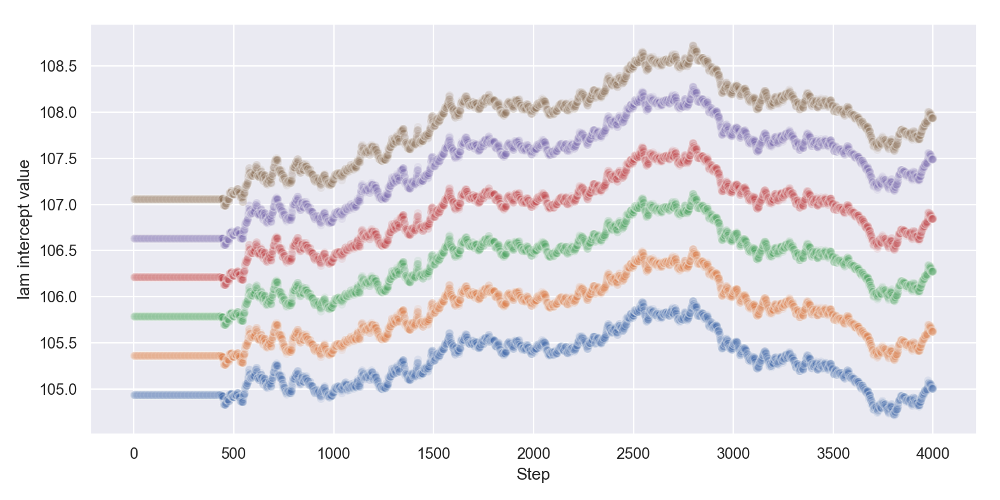

In [703]:
fig, ax = plt.subplots(figsize=(10,5))

for d in all_data:

    y_vals,_,_, _ = d
    y_vals = y_vals.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)
    
plt.xlabel('Step')
plt.ylabel('lam intercept value')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


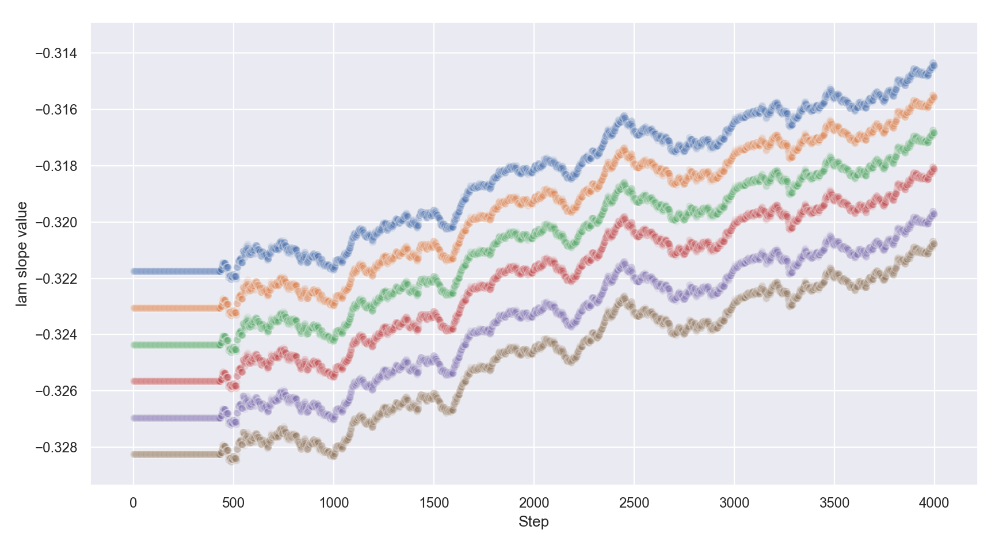

In [704]:
fig, ax = plt.subplots(figsize=(11,6))

for d in all_data:

    _, y_vals, _, _ = d
    y_vals = y_vals.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)
    
plt.xlabel('Step')
plt.ylabel('lam slope value')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


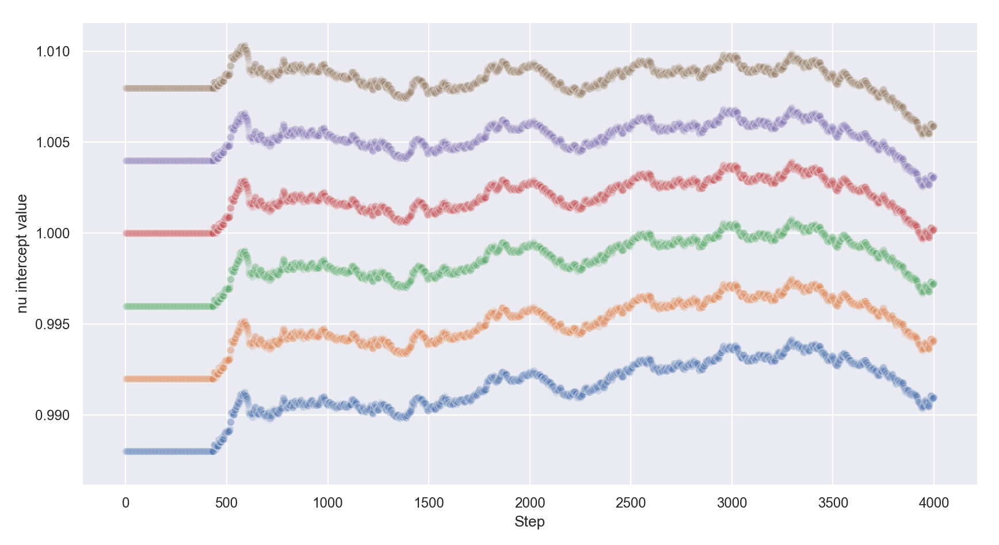

In [705]:
fig, ax = plt.subplots(figsize=(11,6))

for d in all_data:

    _, _, y_vals, _ = d
    y_vals = y_vals.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)

plt.xlabel('Step')
plt.ylabel('nu intercept value')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


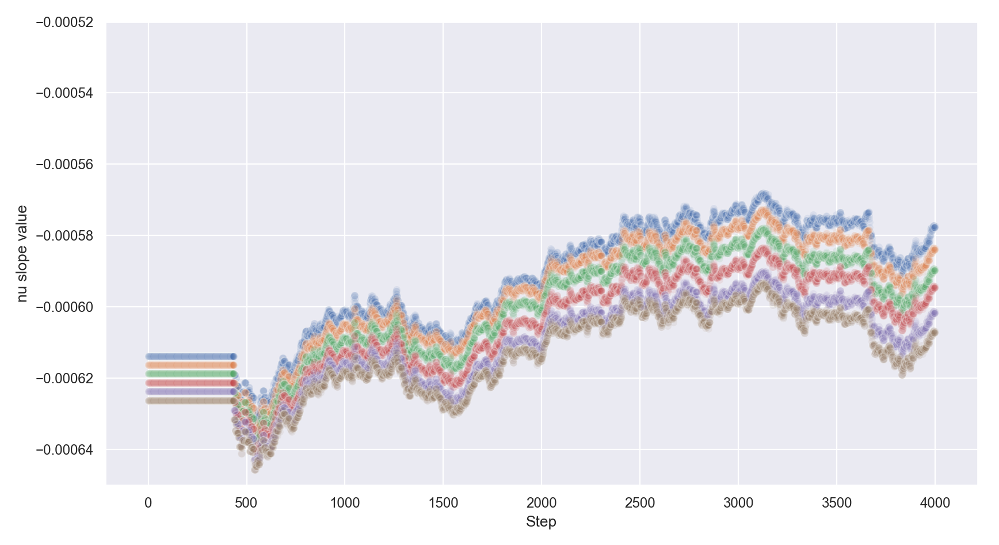

In [707]:
fig, ax = plt.subplots(figsize=(11,6))

for d in all_data:

    _, _, _, y_vals = d
    y_vals = y_vals.numpy()
    x_vals = list(range(len(y_vals)))

    sns.scatterplot(x = x_vals, y = y_vals, alpha=.1)
    
plt.ylim(-.00065,-.00052,)
plt.xlabel('Step')
plt.ylabel('nu slope value')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


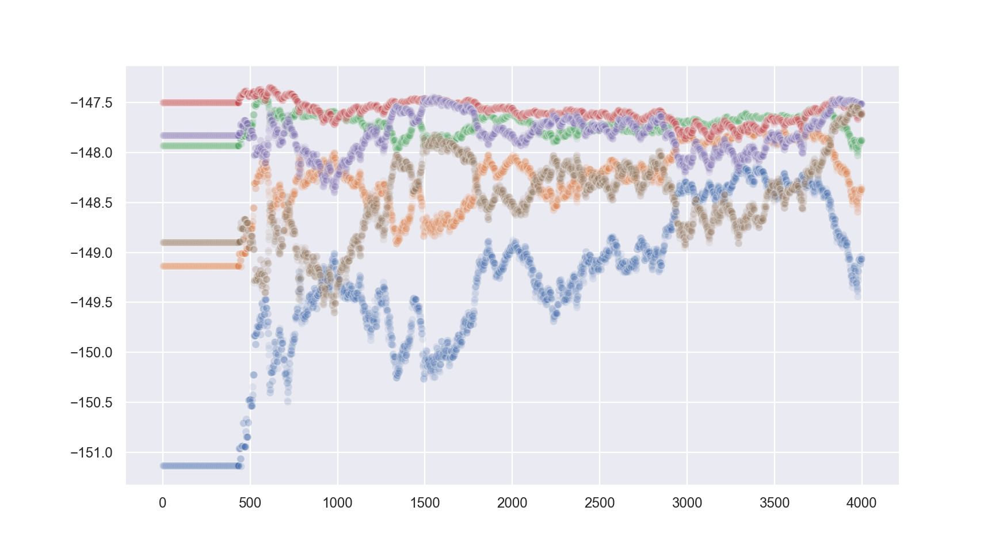

In [708]:
fig, ax = plt.subplots(figsize=(11,6))

for d in all_data:

    lam_0, lam_s, nu_0, nu_s = d
    
    log_probs = [log_proba_TESTING(BOS_pts, L0,LS,n0,ns) for L0,LS,n0,ns in zip(lam_0.numpy(), lam_s.numpy(), nu_0.numpy(), nu_s.numpy())]
         
    x_vals = list(range(len(log_probs)))
    
    sns.scatterplot(x = x_vals, y = log_probs, alpha=.1)
    
    #plt.ylim(-1000,0)

### posterior gradient optimization- I couldn't get this to work

In [664]:
def TimeDep_CMP_for_GradientTape(vars_in):

    data_in = np.array(BOS_pts).astype("float32")
    
    lam_intrcpt_dist = tfd.Uniform(low = 0, high = +2000) 
    lam_slope_dist = tfd.Uniform(low = -10, high = +10)   

    nu_intrcpt_dist = tfd.Uniform(low = 0, high = +10) 
    nu_slope_dist = tfd.Uniform(low = -1, high = +1)  
       
    lam_intrcpt_obs = vars_in[0]
    lam_slope_obs = vars_in[1]
    nu_intrcpt_obs = vars_in[2]
    nu_slope_obs = vars_in[3]
    
    lam_final = [lam_intrcpt_obs + lam_slope_obs*i for i,_ in enumerate(data_in)]
    nu_final = [nu_intrcpt_obs + nu_slope_obs*i for i,_ in enumerate(data_in)]


    
    rv_observation_instances = [Conway_Maxwell_Poisson_distribution(nu = nu, lam = lam) for nu,lam in zip(nu_final, lam_final)]
    rv_observation_on_data_summed = sum([instance.log_prob(d) for instance,d in zip(rv_observation_instances, data_in)])   
    



    final_log_prob = tf.cast(lam_intrcpt_dist.log_prob(lam_intrcpt_obs),"float32") \
                     + tf.cast(lam_slope_dist.log_prob(lam_slope_obs),"float32") \
                     + tf.cast(nu_intrcpt_dist.log_prob(nu_intrcpt_obs),"float32") \
                     + tf.cast(nu_slope_dist.log_prob(nu_slope_obs),"float32") \
                     + tf.cast(rv_observation_on_data_summed,"float32")
    

    final_log_prob = -final_log_prob
    
    return final_log_prob

    
def TimeDep_CMP_with_Gradient(vars_in):
    
    vars_in = tf.Variable(vars_in, dtype = tf.float32)
    
    with tf.GradientTape() as tape:
        loss = TimeDep_CMP_for_GradientTape(vars_in)
        
    grad = tape.gradient(target = loss, sources = vars_in)

    return loss, grad

In [667]:
start = tf.constant([100.0, -.33, +1.0, -.0001], dtype = tf.float32)
            
optim_results = tfp.optimizer.bfgs_minimize(TimeDep_CMP_with_Gradient, 
                                            initial_position = start, 
                                            tolerance = 1e-8)

print(optim_results)
pos = optim_results.position.numpy()
TimeDep_Negative_Binomial_for_GradientTape(pos).numpy(), pos

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

BfgsOptimizerResults(converged=False, failed=True, num_iterations=<tf.Tensor: id=11799247175, shape=(), dtype=int32, numpy=2>, num_objective_evaluations=<tf.Tensor: id=11799247176, shape=(), dtype=int32, numpy=41>, position=<tf.Tensor: id=11798944221, shape=(4,), dtype=float32, numpy=
array([ 1.0000000e+02, -3.3000842e-01,  9.9998528e-01, -8.6259167e-04],
      dtype=float32)>, objective_value=<tf.Tensor: id=11798947282, shape=(), dtype=float32, numpy=147.59569>, objective_gradient=<tf.Tensor: id=11798953979, shape=(4,), dtype=float32, numpy=array([   42.04117,  1796.4047 ,   448.55945, 19266.77   ], dtype=float32)>, inverse_hessian_estimate=<tf.Tensor: id=11798954122, shape=(4, 4), dtype=float32, numpy=
array([[ 1.0000001e+00,  4.2749093e-06,  1.1508758e-06,  5.0289960e-05],
       [ 4.2749093e-06,  1.0001822e+00,  6.0922219e-05,  2.7752898e-03],
       [ 1.1508758e-06,  6.0922219e-05,  9.9965256e-01, -1.8648587e-02],
       [ 5.0289960e-05,  2.7752898e-03, -1.8648587e-02,  3.5548210e

(16866.453,
 array([ 1.0000000e+02, -3.3000842e-01,  9.9998528e-01, -8.6259167e-04],
       dtype=float32))

In [668]:
start = tf.constant([102, -.335, .990, -.00058], dtype = tf.float32)
            
optim_results = tfp.optimizer.bfgs_minimize(TimeDep_CMP_with_Gradient, 
                                            initial_position = start, 
                                            tolerance = 1e-8)

print(optim_results)
pos = optim_results.position.numpy()
TimeDep_Negative_Binomial_for_GradientTape(pos).numpy(), pos

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

BfgsOptimizerResults(converged=False, failed=True, num_iterations=<tf.Tensor: id=11799366553, shape=(), dtype=int32, numpy=1>, num_objective_evaluations=<tf.Tensor: id=11799366555, shape=(), dtype=int32, numpy=9>, position=<tf.Tensor: id=11799277602, shape=(4,), dtype=float32, numpy=array([ 1.02e+02, -3.35e-01,  9.90e-01, -5.80e-04], dtype=float32)>, objective_value=<tf.Tensor: id=11799280678, shape=(), dtype=float32, numpy=148.71979>, objective_gradient=<tf.Tensor: id=11799287375, shape=(4,), dtype=float32, numpy=
array([   41.655266,  1748.7169  ,   207.65054 , 21988.605   ],
      dtype=float32)>, inverse_hessian_estimate=<tf.Tensor: id=11799277617, shape=(4, 4), dtype=float32, numpy=
array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.]], dtype=float32)>)


(15410.762, array([ 1.02e+02, -3.35e-01,  9.90e-01, -5.80e-04], dtype=float32))

In [673]:
start = tf.constant([104, -.332, .995, -.0006], dtype = tf.float32)
            
optim_results = tfp.optimizer.bfgs_minimize(TimeDep_CMP_with_Gradient, 
                                            initial_position = start, 
                                            tolerance = 1e-8)

print(optim_results)
pos = optim_results.position.numpy()
TimeDep_Negative_Binomial_for_GradientTape(pos).numpy(), pos

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

BfgsOptimizerResults(converged=False, failed=True, num_iterations=<tf.Tensor: id=11804366024, shape=(), dtype=int32, numpy=3>, num_objective_evaluations=<tf.Tensor: id=11804366025, shape=(), dtype=int32, numpy=189>, position=<tf.Tensor: id=11802909723, shape=(4,), dtype=float32, numpy=
array([ 1.0399525e+02, -5.3295314e-01,  1.0154120e+00, -1.5570360e-03],
      dtype=float32)>, objective_value=<tf.Tensor: id=11802912784, shape=(), dtype=float32, numpy=147.40086>, objective_gradient=<tf.Tensor: id=11802919481, shape=(4,), dtype=float32, numpy=array([   45.05699,  2005.7471 ,   422.74463, 13684.337  ], dtype=float32)>, inverse_hessian_estimate=<tf.Tensor: id=11802919624, shape=(4, 4), dtype=float32, numpy=
array([[ 1.0010870e+00,  3.5467763e-02, -4.0079474e-02,  8.7940146e-04],
       [ 3.5467763e-02,  2.0557244e+00, -1.6499232e+00,  3.5824470e-02],
       [-4.0079474e-02, -1.6499232e+00,  1.3239771e+00, -2.8749466e-02],
       [ 8.7940146e-04,  3.5824470e-02, -2.8749466e-02,  6.2430894

(nan, array([ 1.0399525e+02, -5.3295314e-01,  1.0154120e+00, -1.5570360e-03],
       dtype=float32))

### posterior sample

In [709]:
CMP_time_dep_samps = nonconstant_CMP(data_in = BOS_pts, 
                                      num_results = 10000, 
                                      burn_in_steps = 2000, 
                                      start_pnt = [106.0, -.325, .998, -.00062], 
                                      initial_chain_mean_shift = shift, 
                                      seed_in = 0, 
                                      step_size_in = .01)

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in log10
/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:19: RuntimeWarning: 

limit_output extension: Maximum message size of 200000 exceeded with 203090 characters

In [715]:
CMP_lam_int_samps, CMP_lam_slp_samps, CMP_nu_int_samps, CMP_nu_slp_samps = CMP_time_dep_samps

CMP_lam_int_samps = CMP_lam_int_samps.numpy()
CMP_lam_slp_samps = CMP_lam_slp_samps.numpy()
CMP_nu_int_samps = CMP_nu_int_samps.numpy()
CMP_nu_slp_samps = CMP_nu_slp_samps.numpy()

full_lam_samps = []
full_nu_samps = []

for lam_0, lam_s in zip(CMP_lam_int_samps, CMP_lam_slp_samps):
    curr_season = [lam_0 + lam_s*i for i in range(0,82)]
    full_lam_samps.append(curr_season)

full_r_samps = []

for nu_0, nu_s in zip(CMP_nu_int_samps, CMP_nu_slp_samps):
    curr_season = [nu_0 + nu_s*i for i in range(0,82)]
    full_nu_samps.append(curr_season)

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


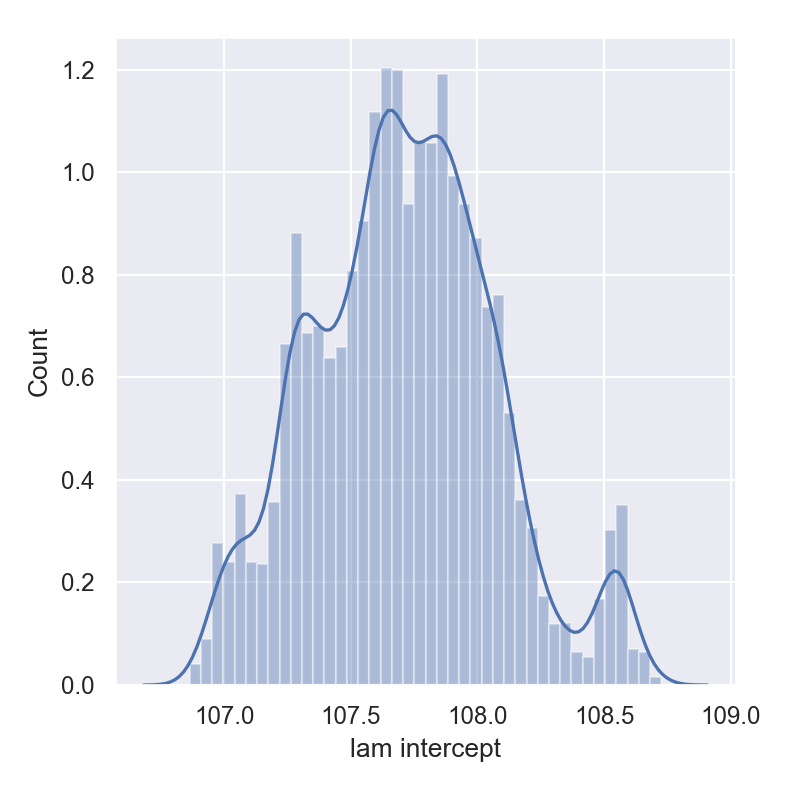

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [716]:
plt.subplots(figsize = (5,5))

sns.distplot(CMP_lam_int_samps)#, bins = np.linspace(.1,.2, 40))

plt.ylabel('Count')
plt.xlabel('lam intercept')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


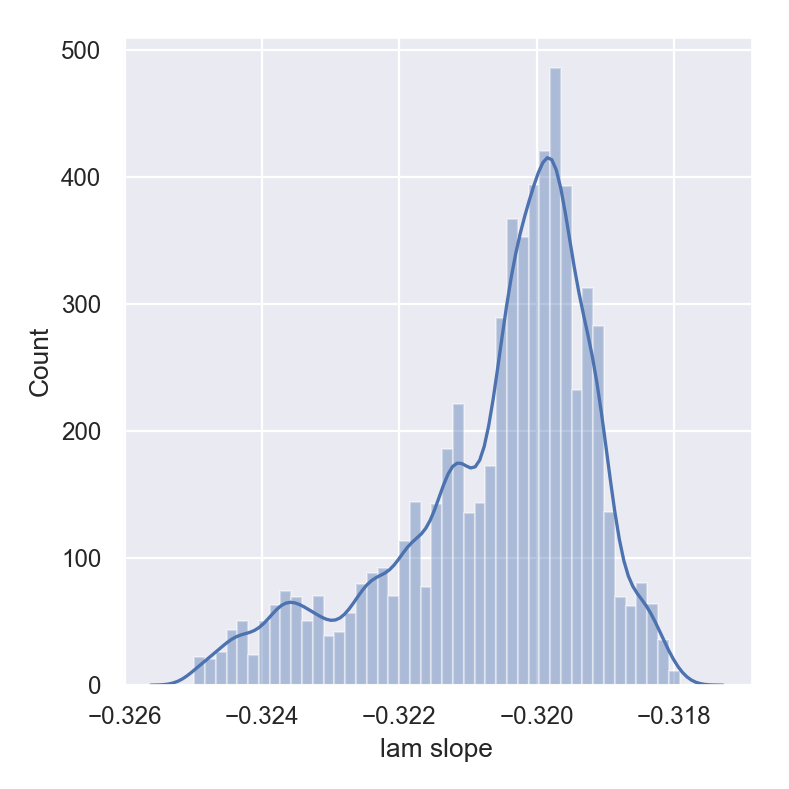

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [717]:
plt.subplots(figsize = (5,5))

sns.distplot(CMP_lam_slp_samps)#, bins = np.linspace(.1,.2, 40))

plt.ylabel('Count')
plt.xlabel('lam slope')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


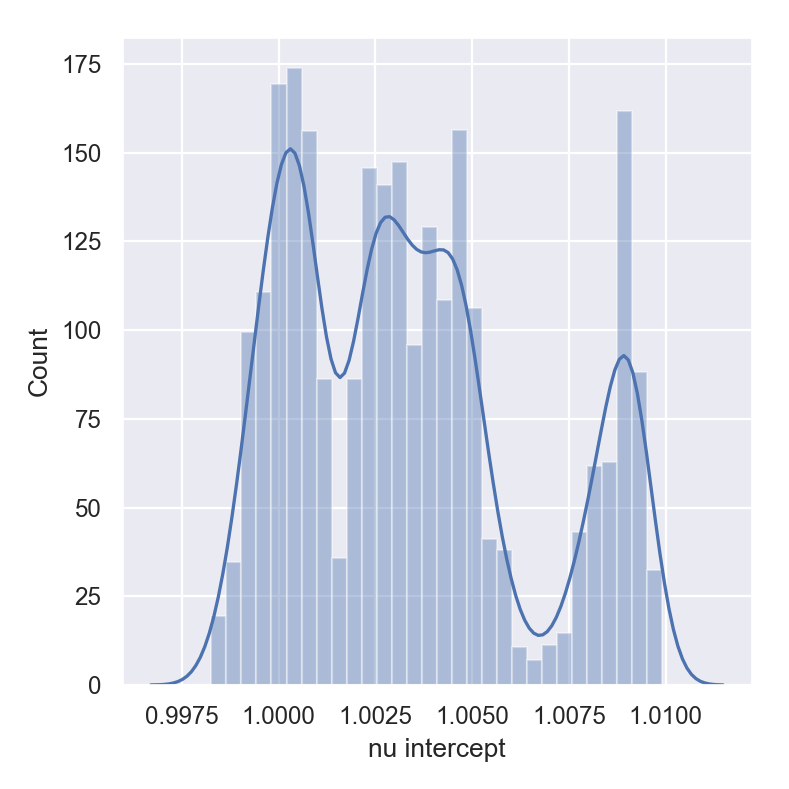

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [719]:
plt.subplots(figsize = (5,5))

sns.distplot(CMP_nu_int_samps)#, bins = np.linspace(.1,.2, 40))

plt.ylabel('Count')
plt.xlabel('nu intercept')
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


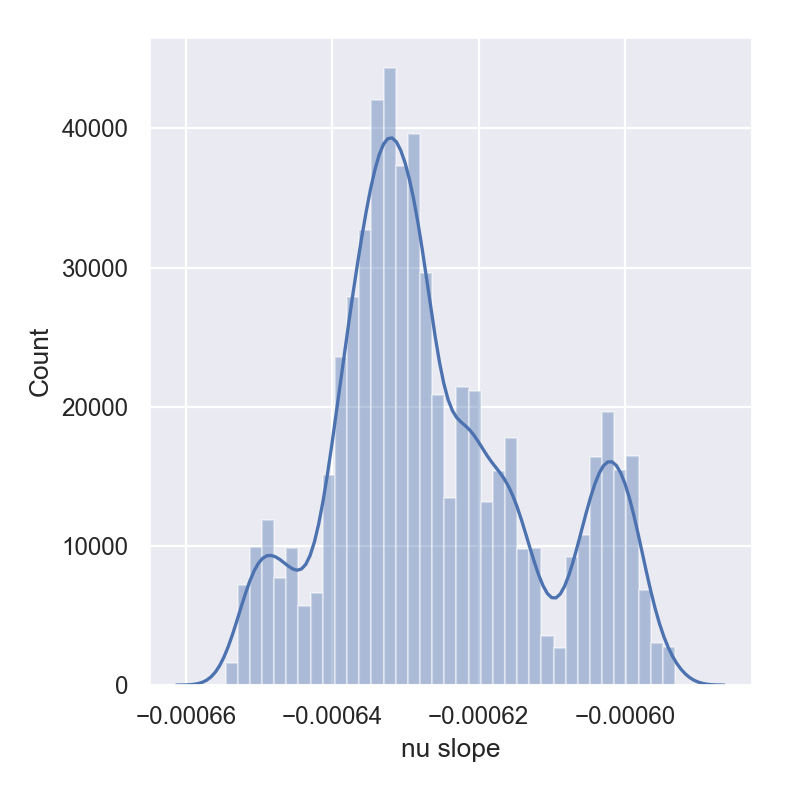

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [718]:
plt.subplots(figsize = (5,5))

sns.distplot(CMP_nu_slp_samps)#, bins = np.linspace(.1,.2, 40))

plt.ylabel('Count')
plt.xlabel('nu slope')
plt.tight_layout()

### test statistics and plots

In [725]:
# generate samples, bins them, and them get confidence bands on the bins

tf.set_random_seed(0)

bins = np.linspace(64,144,21)

bin_mid_pts = [(bins[i]+bins[i+1])/2 for i,_ in enumerate(bins[:-1])]

CMP_score_samps = []

all_scores_bined = []

# generate 80 games for each lambda sample
for lam_season,nu_season in zip(full_lam_samps, full_nu_samps):
    
    score_samps = []
    
    for lam, nu in zip(lam_season, nu_season):
    
        this_CMP_dist = Conway_Maxwell_Poisson_distribution(lam = lam, nu = nu)

        score_samps.append( this_CMP_dist.sample(sample_size = 1)[0]) # [0] to get 1 and only entry
    
    CMP_score_samps.append(score_samps) 
    
    scores_binned, _ = np.histogram(score_samps, bins = bins, density=True)
    all_scores_bined.append(scores_binned)

#  transpose so that now we have an array, with each entry is a list of bin counts 
all_scores_bined = np.array(all_scores_bined)    
all_scores_bined = all_scores_bined.T

# find the confidence intervals for each bin
p025_bin_vals, p1_bin_vals, median_bin_vals, p9_bin_vals, p975_bin_vals = \
    zip(*[(np.quantile(b,.025), np.quantile(b,.1), np.median(b), np.quantile(b,.9), np.quantile(b,.975)) for b in all_scores_bined])

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


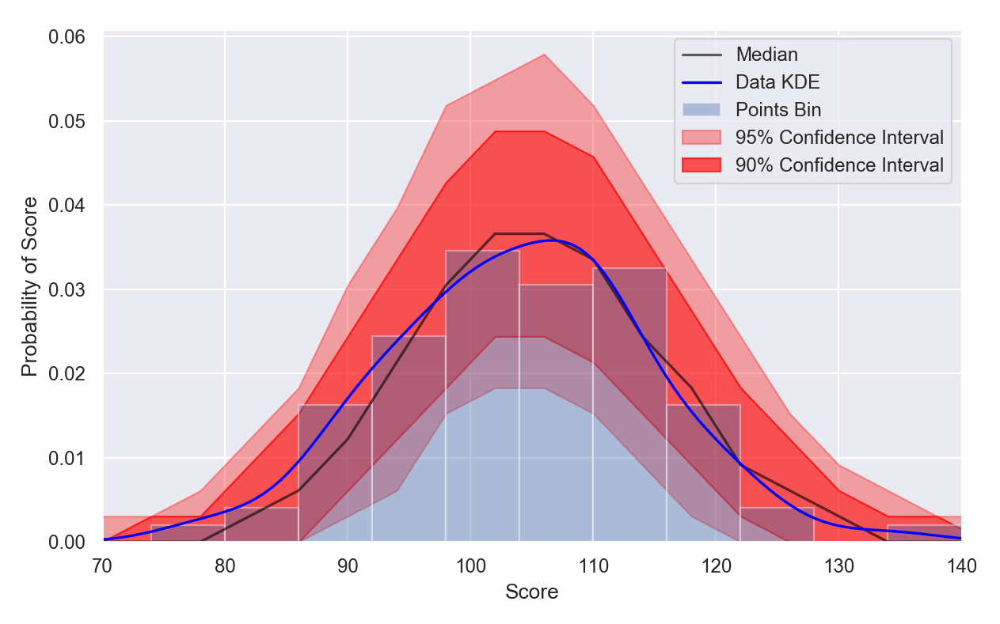

/anaconda/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


In [726]:
fig, ax = plt.subplots(figsize = (8,5))

# break the 95 confidence band into two pieces, above and below 90 band for easier legend
band_95 = ax.fill_between(x = bin_mid_pts, y1 = p025_bin_vals, y2 = p1_bin_vals, **{'alpha':.33, 'color':'red'},label='95% Confidence Interval')
band_90 = ax.fill_between(x = bin_mid_pts, y1 = p1_bin_vals, y2 = p9_bin_vals, **{'alpha':.66, 'color':'red'},label='90% Confidence Interval')
ax.fill_between(x = bin_mid_pts, y1 = p9_bin_vals, y2 = p975_bin_vals, **{'alpha':.33, 'color':'red'} )

median_line = ax.plot(bin_mid_pts, median_bin_vals, alpha = .6, color = 'black', label = 'Median')

data_line = sns.kdeplot(BOS_pts.astype(int), color = 'blue', label = 'Data KDE')

bins = np.arange(50,150,6) #np.linspace(50,150,101)

bined_plot = sns.distplot(BOS_pts, kde = False, norm_hist=True, bins = bins, label = 'Points Bin')

plt.xlabel('Score')
plt.ylabel('Probability of Score')
#plt.ylim(0,.062)
plt.xlim(70,140)
plt.legend()
plt.tight_layout()

In [757]:
just_neg_bi_samps = []

just_CMP_sampls_over_time = []

for lam_season,nu_season in zip(full_lam_samps, full_nu_samps):
    
    this_season_data = []
    
    for lam, nu in zip(lam_season, nu_season):
    
        this_CMP_dist = Conway_Maxwell_Poisson_distribution(lam = lam, nu = nu)
        curr_samp = this_CMP_dist.sample(sample_size=1)[0] # gives[[...]] array, so just take [0] comp

        this_season_data.append(curr_samp)
        

    just_CMP_sampls_over_time.append(this_season_data)
    
just_CMP_sampls_over_time = np.array(just_CMP_sampls_over_time) 

In [771]:
p025_quart, p1_quart, p5_quart, p9_quart, p975_quart = np.quantile(a = just_CMP_sampls_over_time.T, q = [.025, .1, .5, .9, .975], axis = 1) 
# taking transpose, now each entry is for a given time. 

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


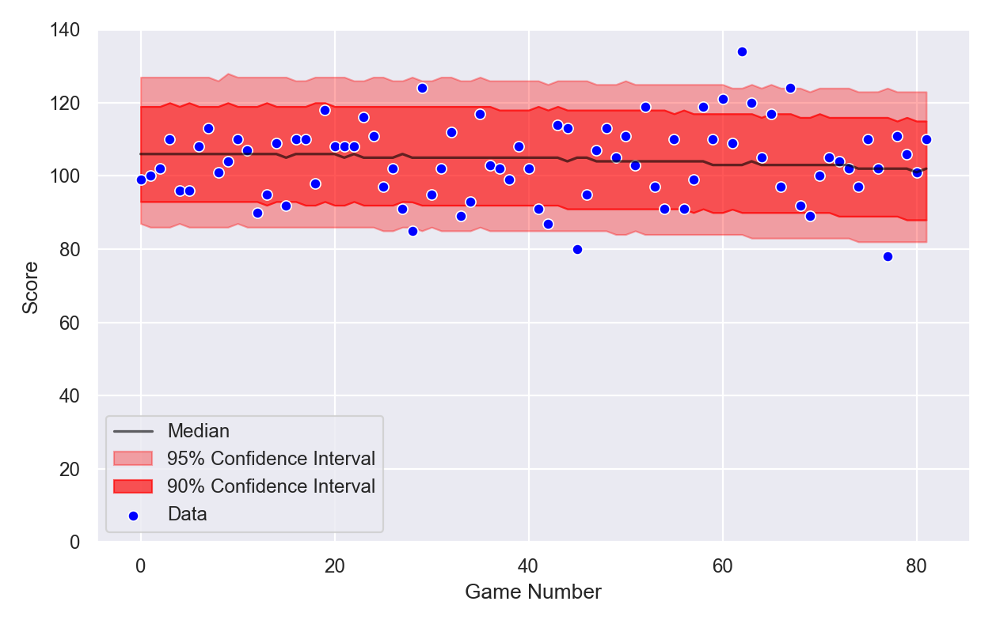

In [772]:
fig, ax = plt.subplots(figsize = (8,5))

t_vals = range(0,82)

# break the 95 confidence band into two pieces, above and below 90 band for easier legend
band_95 = ax.fill_between(x = t_vals, y1 = p025_quart, y2 = p1_quart, **{'alpha':.33, 'color':'red'},label='95% Confidence Interval')
band_90 = ax.fill_between(x = t_vals, y1 = p1_quart, y2 = p9_quart, **{'alpha':.66, 'color':'red'},label='90% Confidence Interval')
ax.fill_between(x = t_vals, y1 = p9_quart, y2 = p975_quart, **{'alpha':.33, 'color':'red'} )
median_line = ax.plot(t_vals, p5_quart, alpha = .6, color = 'black', label = 'Median')

data_line = sns.scatterplot(x = t_vals, y = BOS_pts, color = 'blue', label = 'Data')

plt.xlabel('Game Number')
plt.ylabel('Score')
plt.ylim(0,140)
plt.tight_layout()

## Final Conclusions